# Ultrasonic Exploratory Data Analysis

This notebook will be exploring data from sensor using the version 2 platform.

The data collection procedure was as following
1. Mount arduino on the platform. During this Data collection we used arduino 1 only
2. Mount Ultrasonic Sensor that will be tested on to breadboard
3. Upload "automate_data_collection_v1.ino" and run "US_datacollection_v4.py"
4. Starting from delay 16800us and run "S" which is a sequence of datacollection that will automatically move the surface closer to ultrasonic sensor with set increments.
5. Repeat it by adjust delay into 10000us, 8000us,6000us, and 3000us 

## Load Data

In [44]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the folder path
folder_path = '../ultra_sonic_sensor/fully_automate/data_v4.1'

# Check if the folder exists and list the files
if os.path.exists(folder_path):
    # Generate list of file paths
    file_paths = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith('.csv')]
    print("List of CSV files:", file_paths)
else:
    print("Folder not found")

List of CSV files: ['../ultra_sonic_sensor/fully_automate/data_v4.1/test_seq_ard1_sensor15_14_58_52_02072024.csv', '../ultra_sonic_sensor/fully_automate/data_v4.1/test_seq_ard1_sensor7_11_53_59_02072024.csv', '../ultra_sonic_sensor/fully_automate/data_v4.1/test_seq_ard1_sensor9_12_59_02_02072024.csv', '../ultra_sonic_sensor/fully_automate/data_v4.1/test_seq_ard1_sensor12_13_48_37_02072024.csv', '../ultra_sonic_sensor/fully_automate/data_v4.1/test_seq_ard1_sensor11_13_36_36_02072024.csv', '../ultra_sonic_sensor/fully_automate/data_v4.1/test_seq_ard1_sensor20_16_08_36_03072024.csv', '../ultra_sonic_sensor/fully_automate/data_v4.1/test_seq_ard1_sensor19_15_39_41_03072024.csv', '../ultra_sonic_sensor/fully_automate/data_v4.1/test_seq_ard1_sensor13_14_19_30_02072024.csv', '../ultra_sonic_sensor/fully_automate/data_v4.1/test_seq_ard1_sensor10_13_21_50_02072024.csv', '../ultra_sonic_sensor/fully_automate/data_v4.1/test_seq_ard1_sensor11_13_34_03_02072024.csv', '../ultra_sonic_sensor/fully_aut

In [45]:
def merge_csv_files(file_paths):
    """
    Merge multiple CSV files into a single DataFrame.

    Parameters:
    file_paths (list of str): List of file paths to the CSV files.

    Returns:
    DataFrame: Merged DataFrame containing data from all input CSV files.
    """
    dataframes = []
    for file in file_paths:
        df = pd.read_csv(file)
        dataframes.append(df)

    # Concatenate all DataFrames
    merged_df = pd.concat(dataframes, ignore_index=True)
    
    return merged_df

In [46]:
# Merge CSV files
merged_df = merge_csv_files(file_paths)
merged_df

,Trial,Ping Duration,Distance (cm),Ping Time (us),Delay (us),Steps,Arduino ID,Sensor ID,Range (cm),Sensor length (cm),...,Angle on XY plane,side a (cm),side b (cm),side c (cm),Angle on YZ plane,Sensor Configuration,Sensor Angle,Surface material,Surface Length (cm),Surface Width (cm)
0,0,13364,52,3007,8000,0,1,15,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
1,1,13368,52,3007,8000,0,1,15,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
2,2,13300,52,3003,8000,0,1,15,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
3,3,13304,52,3003,8000,0,1,15,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
4,4,13304,52,3003,8000,0,1,15,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119995,95,9100,14,815,6000,10480,1,15,13,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
119996,96,9100,14,815,6000,10480,1,15,13,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
119997,97,9100,14,815,6000,10480,1,15,13,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
119998,98,9104,14,811,6000,10480,1,15,13,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5


In [47]:
merged_df.columns

Index(['Trial', 'Ping Duration', 'Distance (cm)', 'Ping Time (us)',
       'Delay (us)', 'Steps', 'Arduino ID', 'Sensor ID', 'Range (cm)',
       'Sensor length (cm)', 'Color of sensor', 'Angle on XY plane',
       'side a (cm)', 'side b (cm)', 'side c (cm)', 'Angle on YZ plane',
       'Sensor Configuration', 'Sensor Angle', 'Surface material',
       'Surface Length (cm)', 'Surface Width (cm)'],
      dtype='object')

In [48]:
df_step_zero=merged_df[merged_df.Steps == 0]
df_step_zero

,Trial,Ping Duration,Distance (cm),Ping Time (us),Delay (us),Steps,Arduino ID,Sensor ID,Range (cm),Sensor length (cm),...,Angle on XY plane,side a (cm),side b (cm),side c (cm),Angle on YZ plane,Sensor Configuration,Sensor Angle,Surface material,Surface Length (cm),Surface Width (cm)
0,0,13364,52,3007,8000,0,1,15,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
1,1,13368,52,3007,8000,0,1,15,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
2,2,13300,52,3003,8000,0,1,15,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
3,3,13304,52,3003,8000,0,1,15,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
4,4,13304,52,3003,8000,0,1,15,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118895,95,11312,53,3027,6000,0,1,15,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
118896,96,11316,53,3023,6000,0,1,15,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
118897,97,11304,53,3027,6000,0,1,15,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
118898,98,11312,53,3027,6000,0,1,15,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5


In [49]:
df_step_zero["Range (cm)"].unique()

array([53])

In [50]:
df_step_zero[df_step_zero["Range (cm)"] != 53]

,Trial,Ping Duration,Distance (cm),Ping Time (us),Delay (us),Steps,Arduino ID,Sensor ID,Range (cm),Sensor length (cm),...,Angle on XY plane,side a (cm),side b (cm),side c (cm),Angle on YZ plane,Sensor Configuration,Sensor Angle,Surface material,Surface Length (cm),Surface Width (cm)


### Clean data 

Remove columns with NaN. Currently NaN column are irrelevant so would be dropped

In [51]:
# Remove columns with any NaN values
cleaned_df = merged_df.dropna(axis=1)
cleaned_df

,Trial,Ping Duration,Distance (cm),Ping Time (us),Delay (us),Steps,Arduino ID,Sensor ID,Range (cm),Color of sensor,Angle on XY plane,side a (cm),side c (cm),Angle on YZ plane,Sensor Configuration,Sensor Angle,Surface material,Surface Length (cm),Surface Width (cm)
0,0,13364,52,3007,8000,0,1,15,53,b,0,18.3,0,0,HTR,90,wood,31,30.5
1,1,13368,52,3007,8000,0,1,15,53,b,0,18.3,0,0,HTR,90,wood,31,30.5
2,2,13300,52,3003,8000,0,1,15,53,b,0,18.3,0,0,HTR,90,wood,31,30.5
3,3,13304,52,3003,8000,0,1,15,53,b,0,18.3,0,0,HTR,90,wood,31,30.5
4,4,13304,52,3003,8000,0,1,15,53,b,0,18.3,0,0,HTR,90,wood,31,30.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119995,95,9100,14,815,6000,10480,1,15,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
119996,96,9100,14,815,6000,10480,1,15,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
119997,97,9100,14,815,6000,10480,1,15,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
119998,98,9104,14,811,6000,10480,1,15,13,b,0,18.3,0,0,HTR,90,wood,31,30.5


## Visual analysis on effect of delay and range on Ping Time 

### Visualization by Range

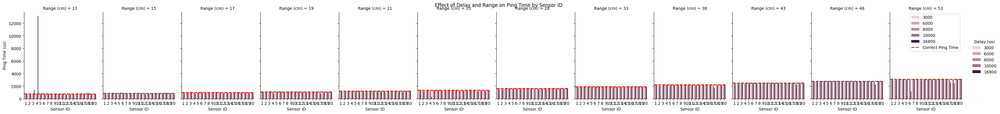

In [52]:
# Function to visualize the effect of delay and range on ping time
def visualize_delay_and_range_effect_on_ping_time(df):
    """
    Visualize the effect of delay and range on ping time.

    Parameters:
    df (DataFrame): The DataFrame containing the data.
    """
    
    # Group by sensor ID, delay, and range, then calculate the mean ping time
    grouped_df = df.groupby(['Sensor ID', 'Delay (us)', 'Range (cm)'])['Ping Time (us)'].mean().reset_index()
    
    # Create the visualization
    g = sns.catplot(
        x='Sensor ID', 
        y='Ping Time (us)', 
        hue='Delay (us)', 
        col='Range (cm)', 
        data=grouped_df, 
        kind='bar', 
        height=4, 
        aspect=0.7
    )
    
    # Add horizontal lines for correct ping times based on range
    for ax in g.axes.flatten():
        range_val = float(ax.get_title().split('=')[1].strip())
        correct_ping_time = (2 * range_val / 100) / 343 * 1e6
        ax.axhline(correct_ping_time, color='red', linestyle='--', linewidth=2, label='Correct Ping Time')
    
    plt.subplots_adjust(top=0.9)
    plt.suptitle('Effect of Delay and Range on Ping Time by Sensor ID')
    plt.legend()
    plt.show()


# Visualize the effect of delay and range on ping time
visualize_delay_and_range_effect_on_ping_time(cleaned_df)


we can see there are notable outliers present for each sensor in particular ranges. Most notable thing from this graph is sensor 4 where sometime it gives over and under measurement while it is on delay 16800. Later will be printing bigger graph to investigate this further. 

So far there are some distinct characteristics been catured and this will later be captured through machine learning method for characterization. 

In [53]:
# Function to visualize the effect of delay and range on ping time
def visualize_delay_and_range_effect_on_ping_time(df, target = 0):
    """
    Visualize the effect of delay and range on ping time.

    Parameters:
    df (DataFrame): The DataFrame containing the data.
    """
    # Group by sensor ID, delay, and range, then calculate the mean ping time
    grouped_df = df.groupby(['Sensor ID', 'Delay (us)', 'Range (cm)'])['Ping Time (us)'].mean().reset_index()
    # Create individual plots for each range
    unique_ranges = grouped_df['Range (cm)'].unique()
    
    if target == 0:
        for range_val in unique_ranges:
            subset_df = grouped_df[grouped_df['Range (cm)'] == range_val]
            plt.figure(figsize=(14, 10))
            sns.barplot(
                x='Sensor ID', 
                y='Ping Time (us)', 
                hue='Delay (us)', 
                data=subset_df
            )
            
            correct_ping_time = (2 * range_val / 100) / 343 * 1e6
            plt.axhline(correct_ping_time, color='red', linestyle='--', linewidth=2, label='Correct Ping Time')
            
            plt.title(f'Effect of Delay on Ping Time by Sensor ID for Range {range_val} cm')
            plt.xlabel('Sensor ID')
            plt.ylabel('Mean Ping Time (us)')
            plt.legend(title='Delay (us)')
            plt.xticks(rotation=45)
            # Adjust y-axis limits and ticks for better precision
            min_ping_time = subset_df['Ping Time (us)'].min()
            max_ping_time = subset_df['Ping Time (us)'].max()
            plt.ylim(min_ping_time - 50, max_ping_time + 50)  # Adjust the limits as needed
            plt.yticks(range(int(min_ping_time) - 50, int(max_ping_time) + 50, 50))  # Adjust the step as needed
            plt.show()
    else:
        if target in unique_ranges:
            subset_df = grouped_df[grouped_df['Range (cm)'] == target]
            plt.figure(figsize=(14, 10))
            sns.barplot(
                x='Sensor ID', 
                y='Ping Time (us)', 
                hue='Delay (us)', 
                data=subset_df
            )
            
            correct_ping_time = (2 * target / 100) / 343 * 1e6
            plt.axhline(correct_ping_time, color='red', linestyle='--', linewidth=2, label='Correct Ping Time')
            
            plt.title(f'Effect of Delay on Ping Time by Sensor ID for Range {target} cm')
            plt.xlabel('Sensor ID')
            plt.ylabel('Mean Ping Time (us)')
            plt.legend(title='Delay (us)')
            plt.xticks(rotation=45)
            # Adjust y-axis limits and ticks for better precision
            min_ping_time = subset_df['Ping Time (us)'].min()
            max_ping_time = subset_df['Ping Time (us)'].max()
            plt.ylim(min_ping_time - 50, max_ping_time + 50)  # Adjust the limits as needed
            plt.yticks(range(int(min_ping_time) - 50, int(max_ping_time) + 50, 50))  # Adjust the step as needed
            plt.show()

This function will be generating graph in bigger scale for better analysis.

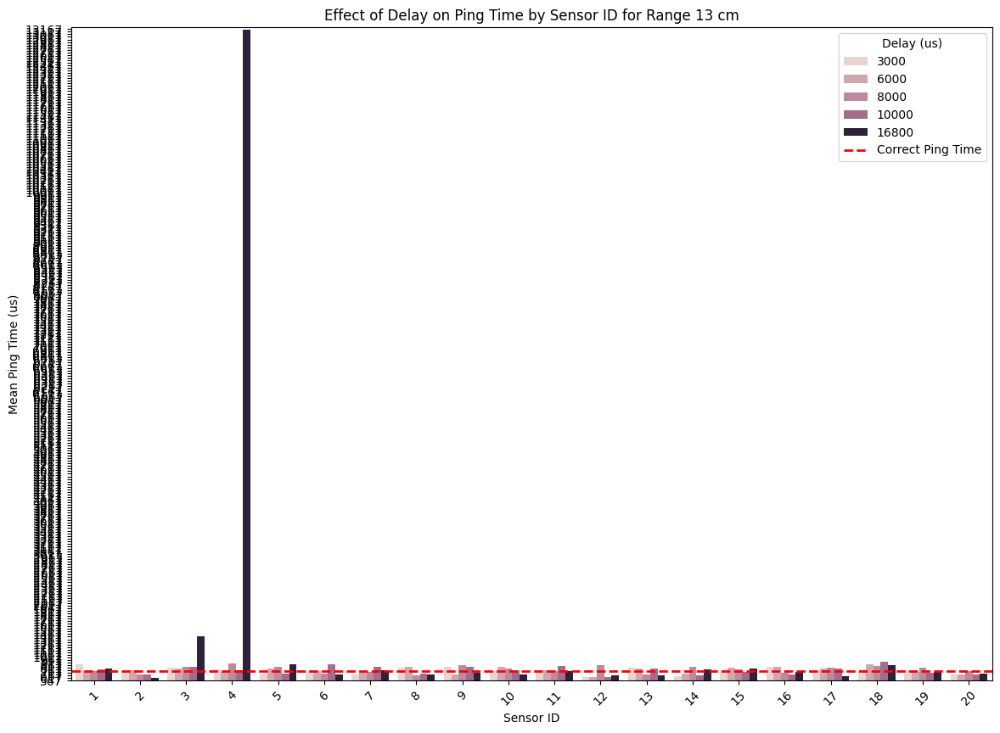

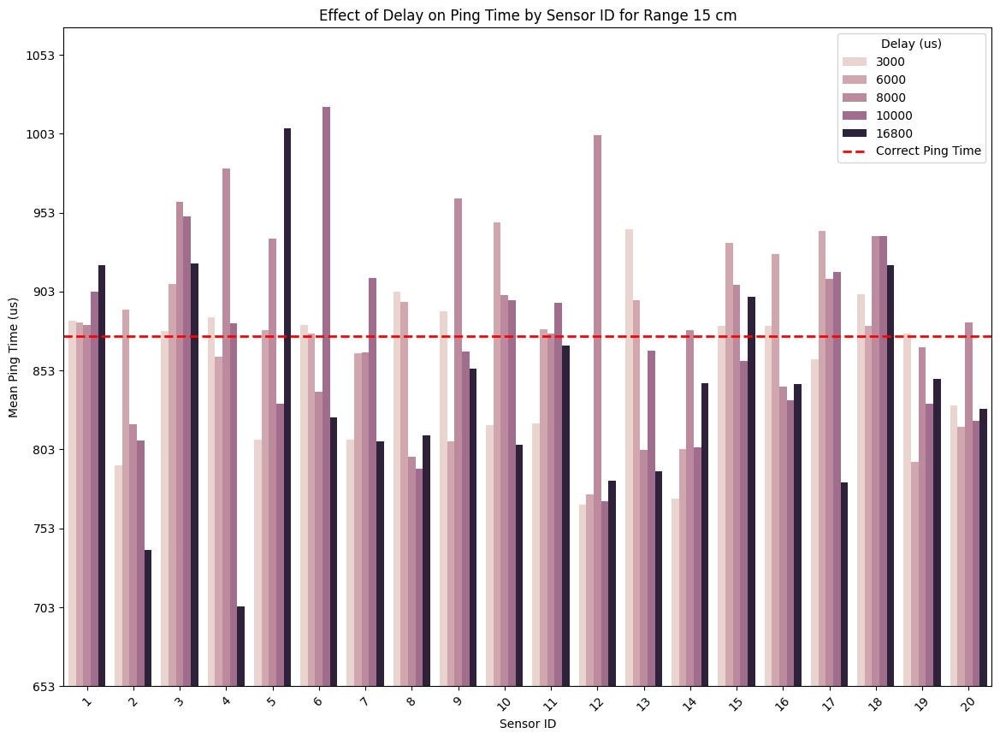

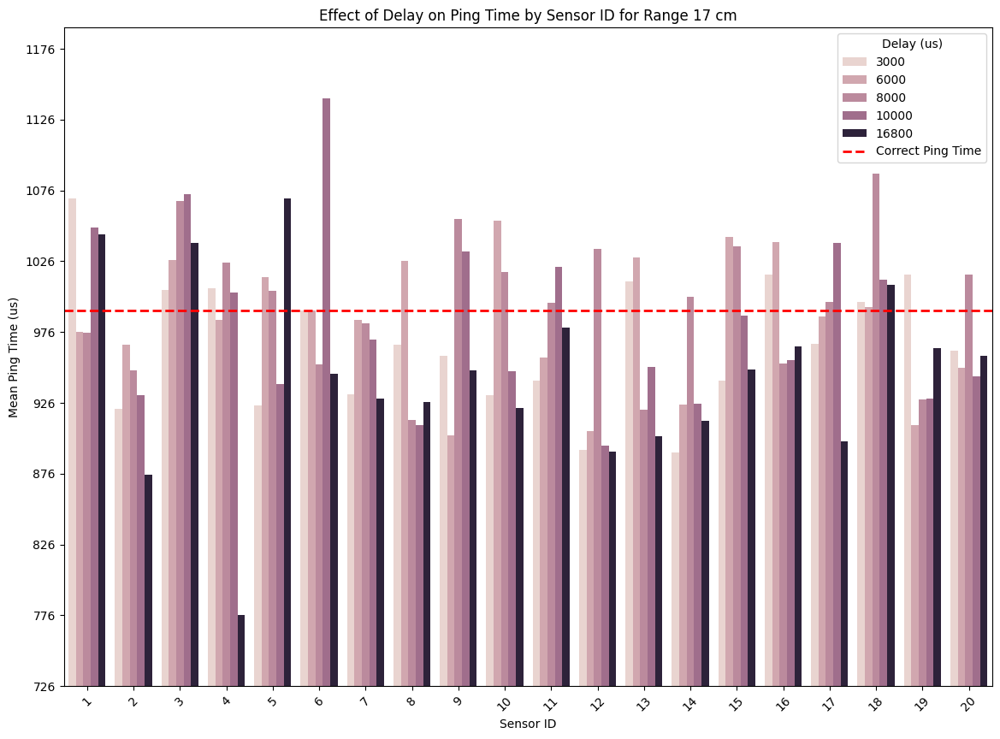

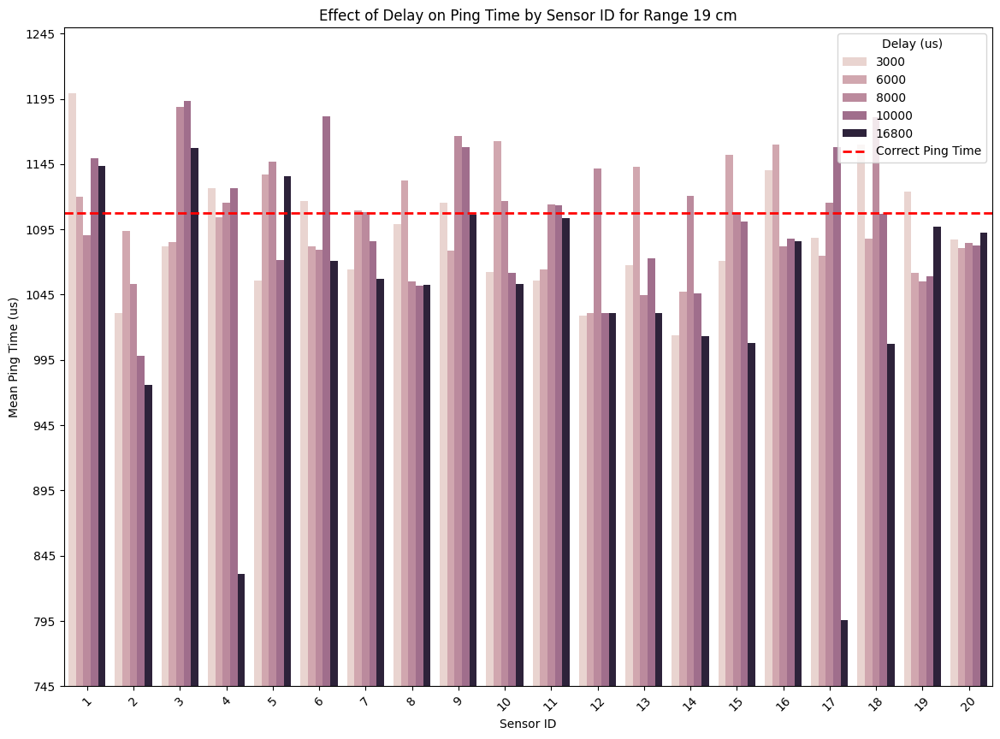

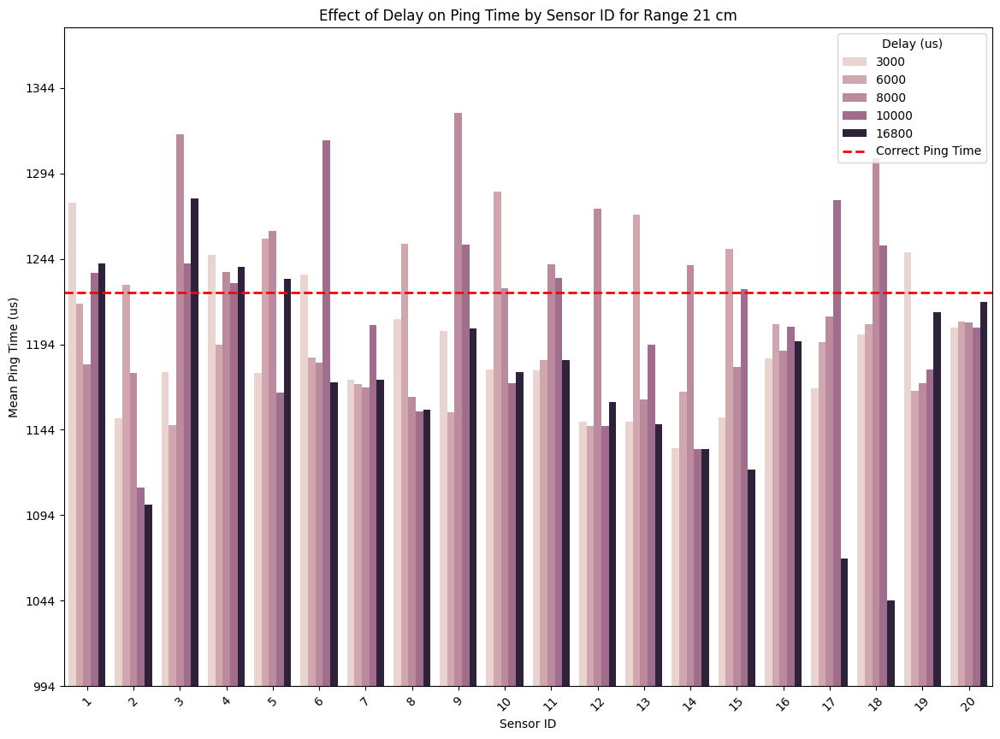

...

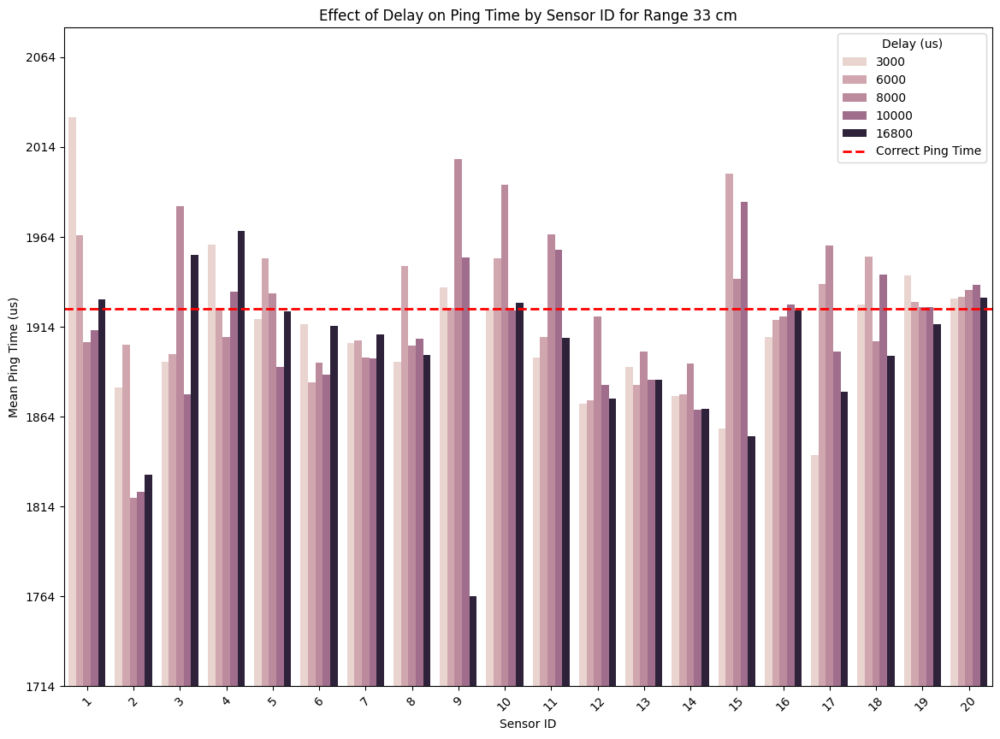

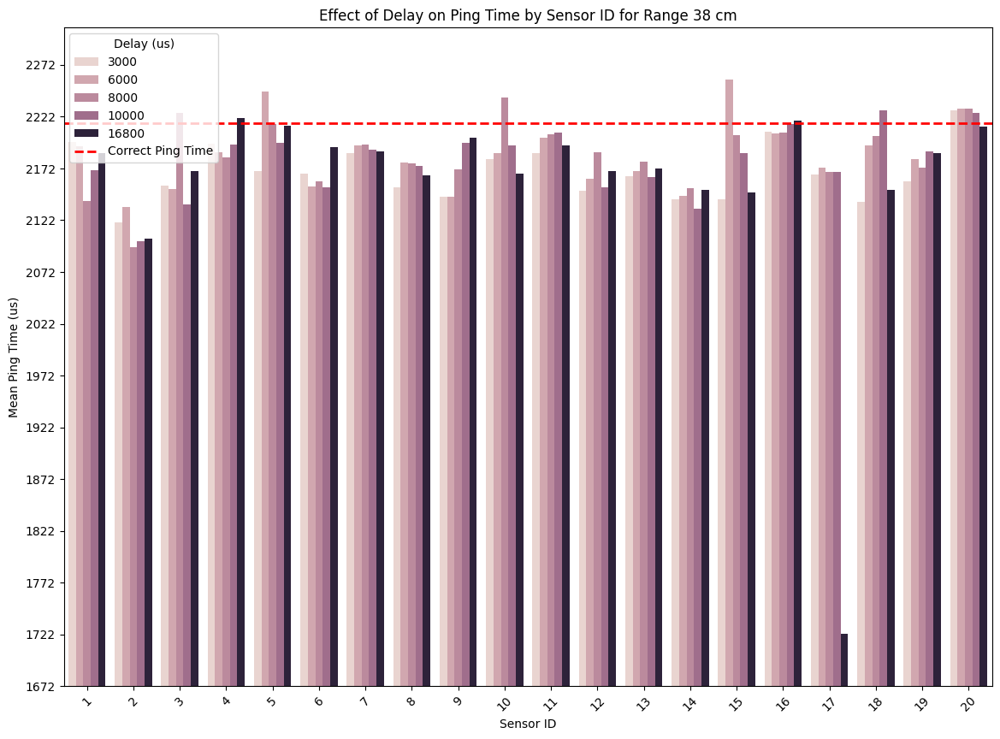

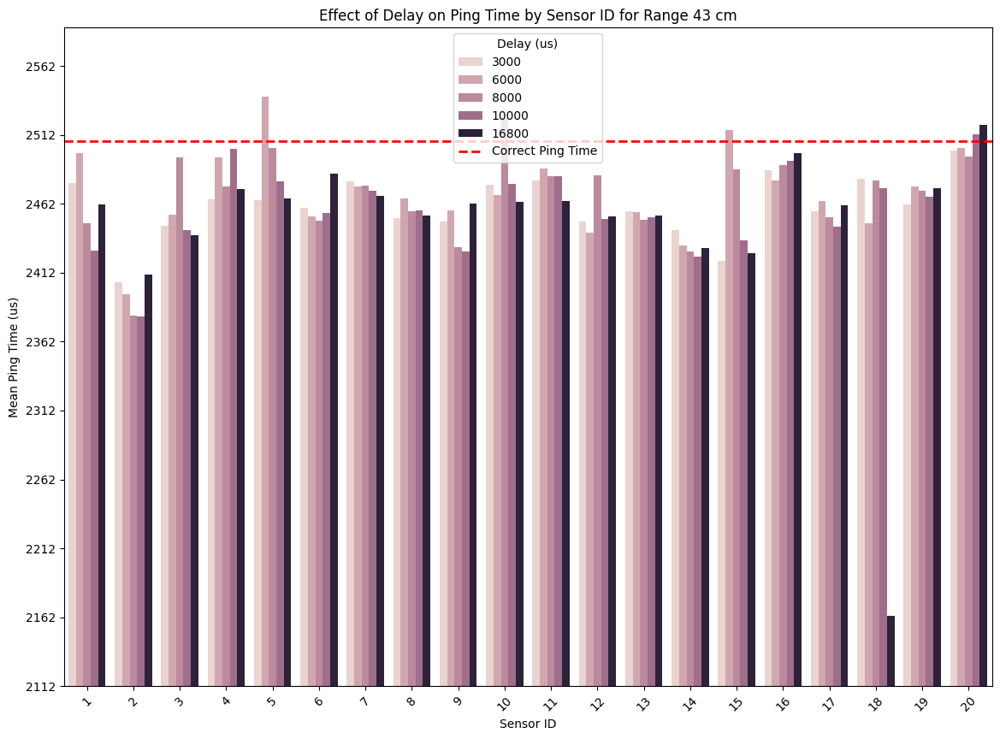

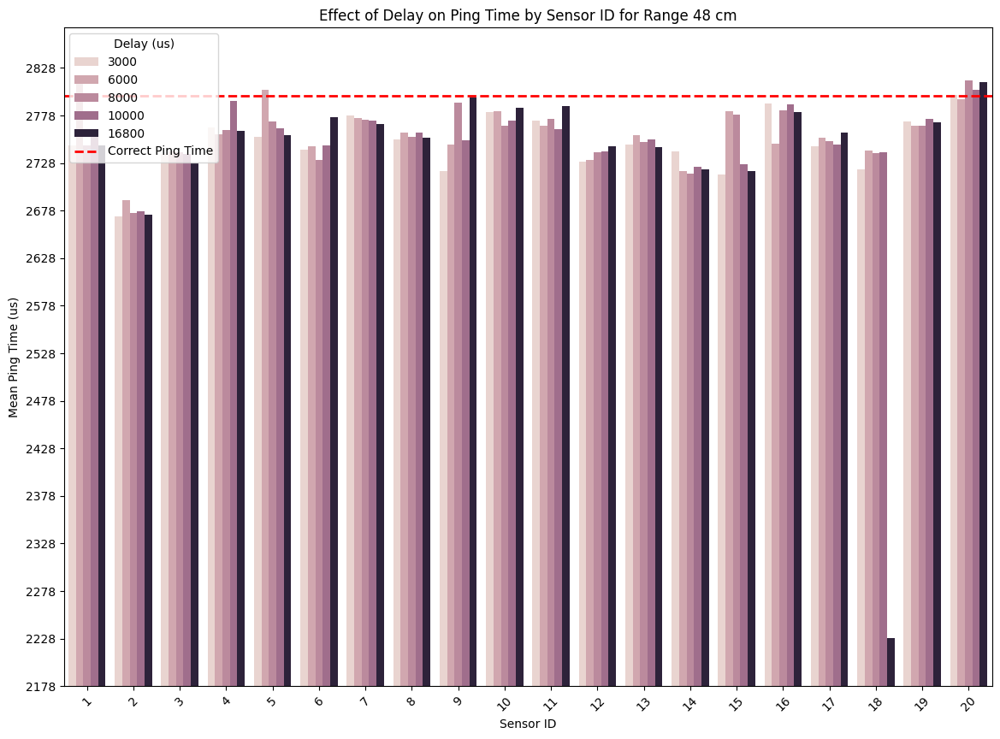

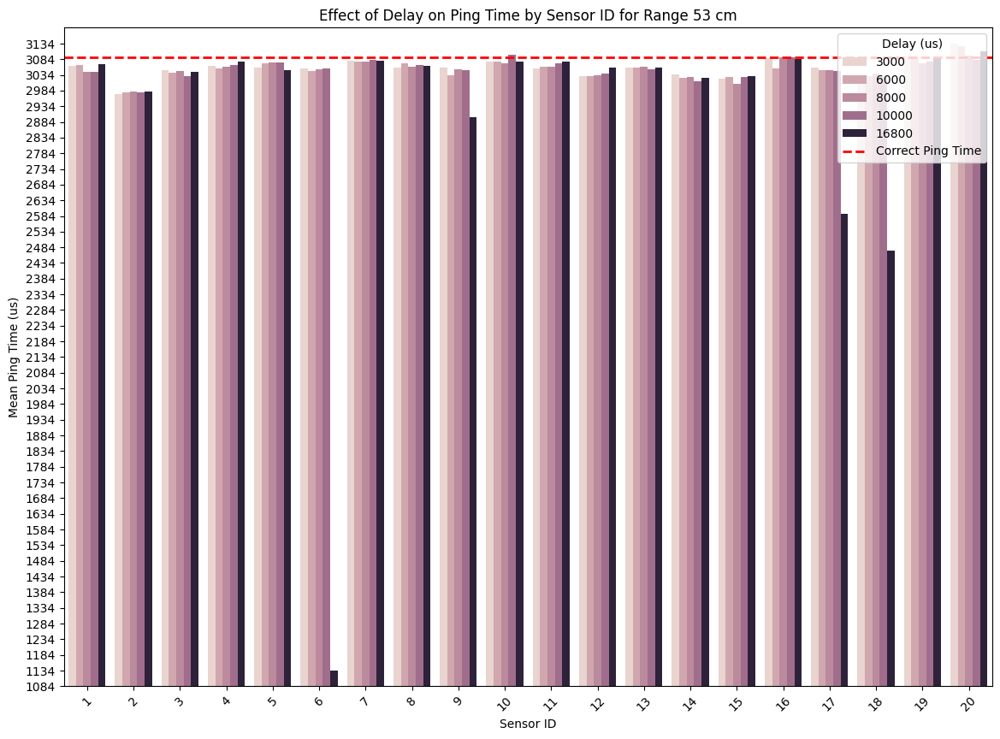

In [54]:
# Print all
visualize_delay_and_range_effect_on_ping_time(cleaned_df)

Sensor 1:
 - under measure
 - Constently struggle to under measure when delay is 8000

 Sensor 2: 
 - in general under measure by big time
 - most stable while its delay 6000 

 Sensor 3:
 - under measure 
 - however with delay 8000 it tends to over measure

 Sensor 4:
 - When its delay 16800 it fail to measure correctly and fails miserably.

 Sensor 5:
 - Constant over estimation at delay 6000

 Sensor 6:
 - Surprisingly with delay 16800 they are in consistent

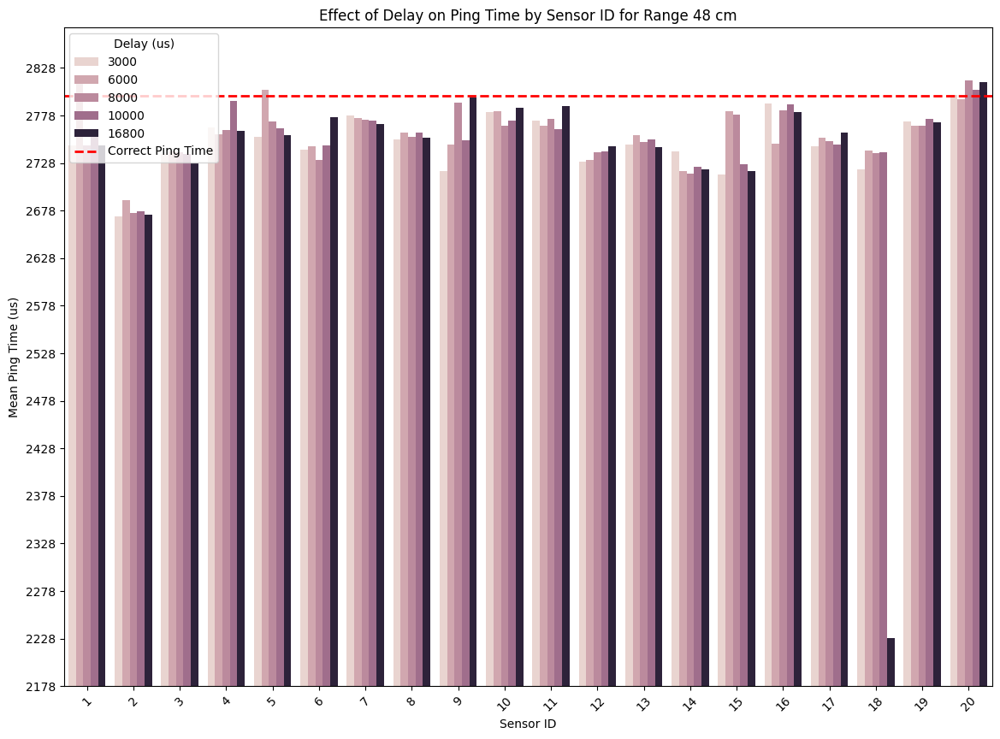

In [55]:
visualize_delay_and_range_effect_on_ping_time(cleaned_df, 48)

### Visualization by Sensor

Do another analysis based on sensors

In [56]:
# Function to visualize the effect of delay and range on ping time
def visualize_effect_on_ping_time_sensors(df, target = 0):
    """
    Visualize the effect of delay and range on ping time.

    Parameters:
    df (DataFrame): The DataFrame containing the data.
    """
    # Group by sensor ID, delay, and range, then calculate the mean ping time
    grouped_df = df.groupby(['Sensor ID', 'Delay (us)', 'Range (cm)'])['Ping Time (us)'].mean().reset_index()
    # Create individual plots for each range
    unique_sensors = grouped_df['Sensor ID'].unique()
    
    if target == 0:
        for id_val in unique_sensors:
            subset_df = grouped_df[grouped_df['Sensor ID'] == id_val]
            plt.figure(figsize=(14, 10))
            sns.barplot(
                x='Range (cm)', 
                y='Ping Time (us)', 
                hue='Delay (us)', 
                data=subset_df
            )
            
            plt.title(f'Effect of Delay on Ping Time by Range on Sensor {id_val}')
            plt.xlabel('Range (cm)')
            plt.ylabel('Mean Ping Time (us)')
            plt.legend(title='Delay (us)')
            plt.xticks(rotation=45)
            # Adjust y-axis limits and ticks for better precision
            min_ping_time = subset_df['Ping Time (us)'].min()
            max_ping_time = subset_df['Ping Time (us)'].max()
            plt.ylim(min_ping_time - 50, max_ping_time + 50)  # Adjust the limits as needed
            plt.yticks(range(int(min_ping_time) - 50, int(max_ping_time) + 50, 50))  # Adjust the step as needed
            plt.show()
    else:
        if target in unique_sensors:
            subset_df = grouped_df[grouped_df['Sensor ID'] == target]
            plt.figure(figsize=(14, 10))
            sns.barplot(
                x='Range (cm)', 
                y='Ping Time (us)', 
                hue='Delay (us)', 
                data=subset_df
            )
            
            plt.title(f'Effect of Delay on Ping Time by Range on Sensor {target}')
            plt.xlabel('Range (cm)')
            plt.ylabel('Mean Ping Time (us)')
            plt.legend(title='Delay (us)')
            plt.xticks(rotation=45)
            # Adjust y-axis limits and ticks for better precision
            min_ping_time = subset_df['Ping Time (us)'].min()
            max_ping_time = subset_df['Ping Time (us)'].max()
            plt.ylim(min_ping_time - 50, max_ping_time + 50)  # Adjust the limits as needed
            plt.yticks(range(int(min_ping_time) - 50, int(max_ping_time) + 50, 50))  # Adjust the step as needed
            plt.show()

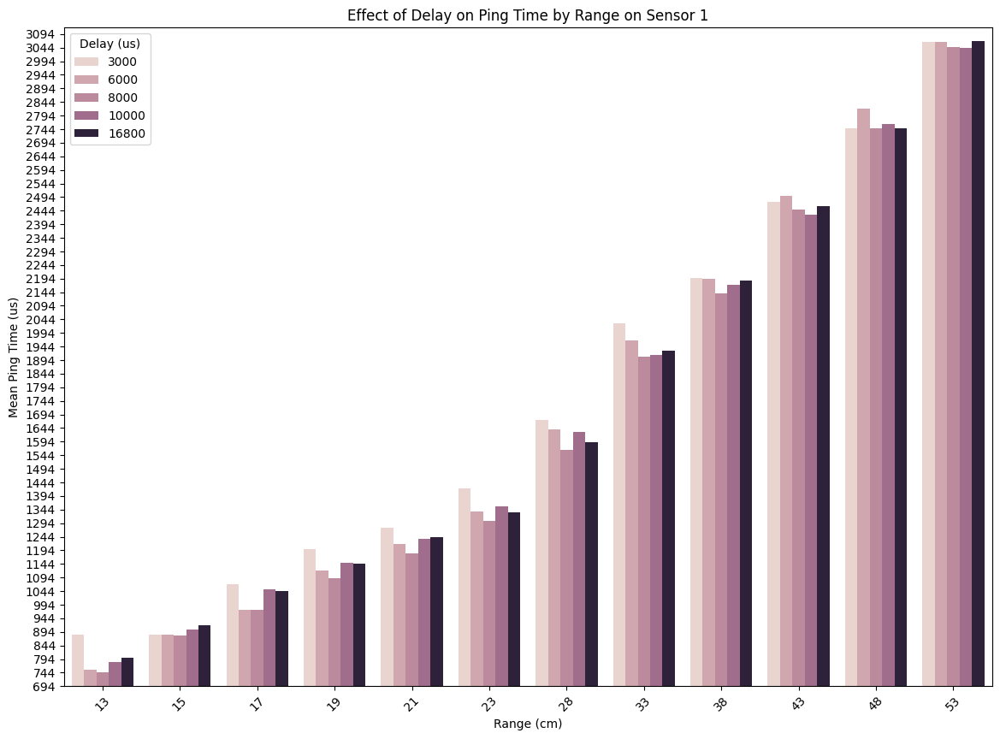

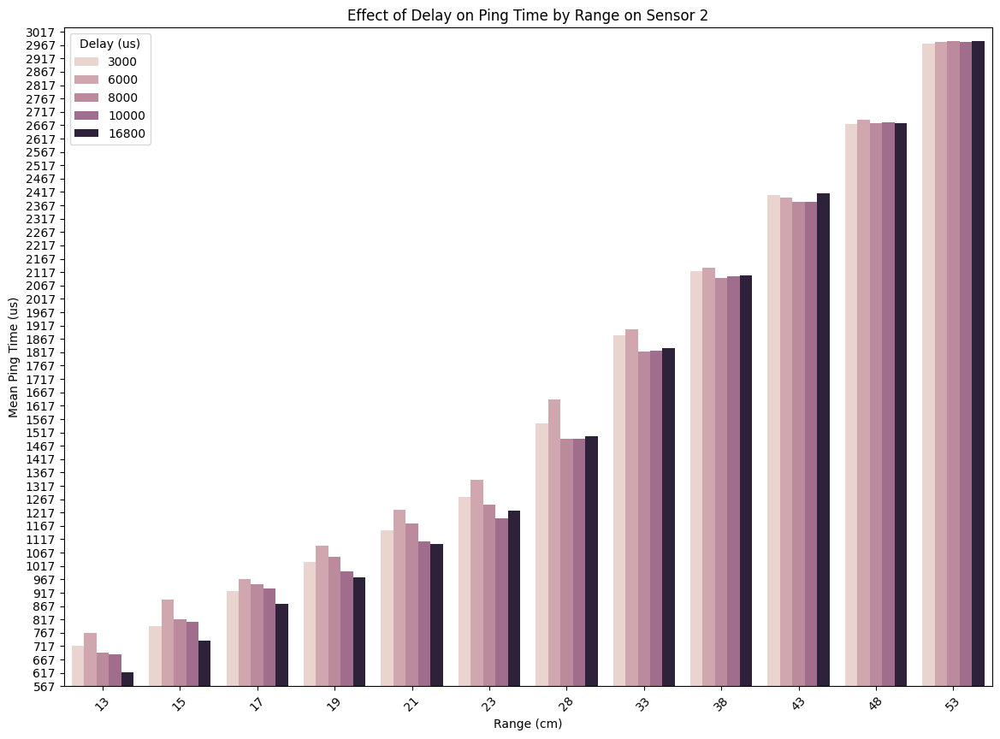

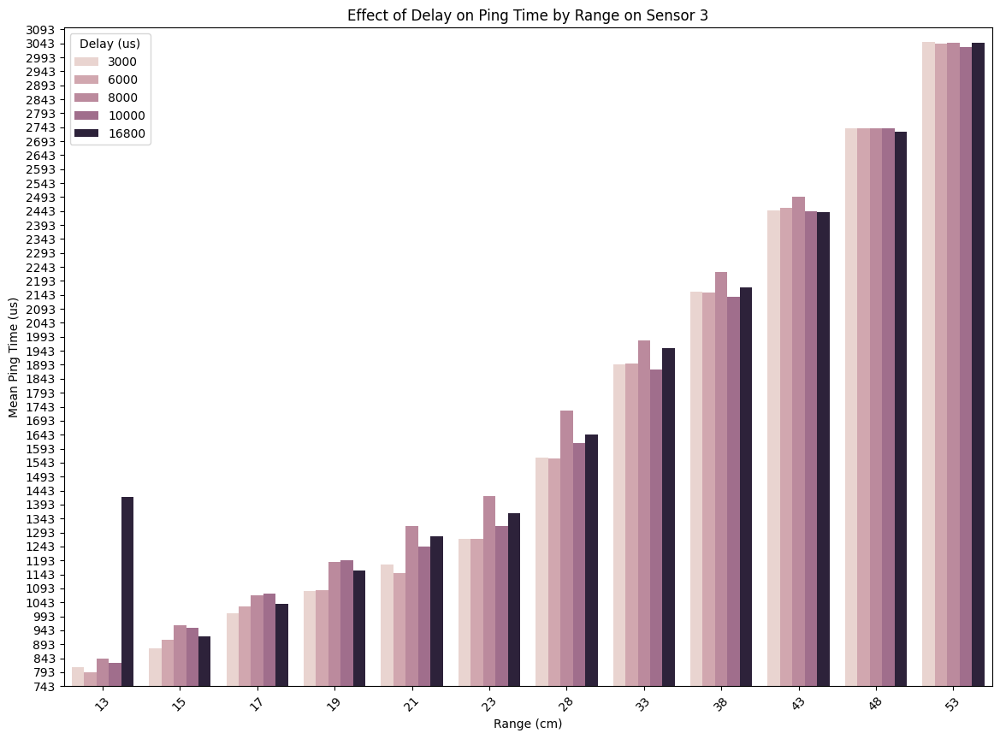

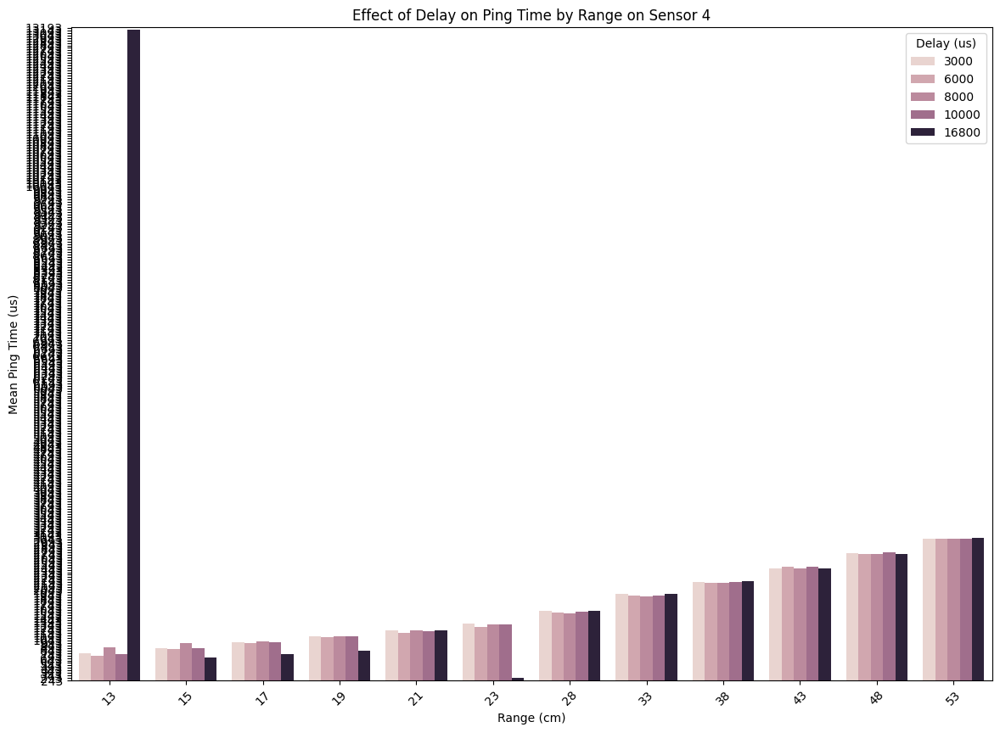

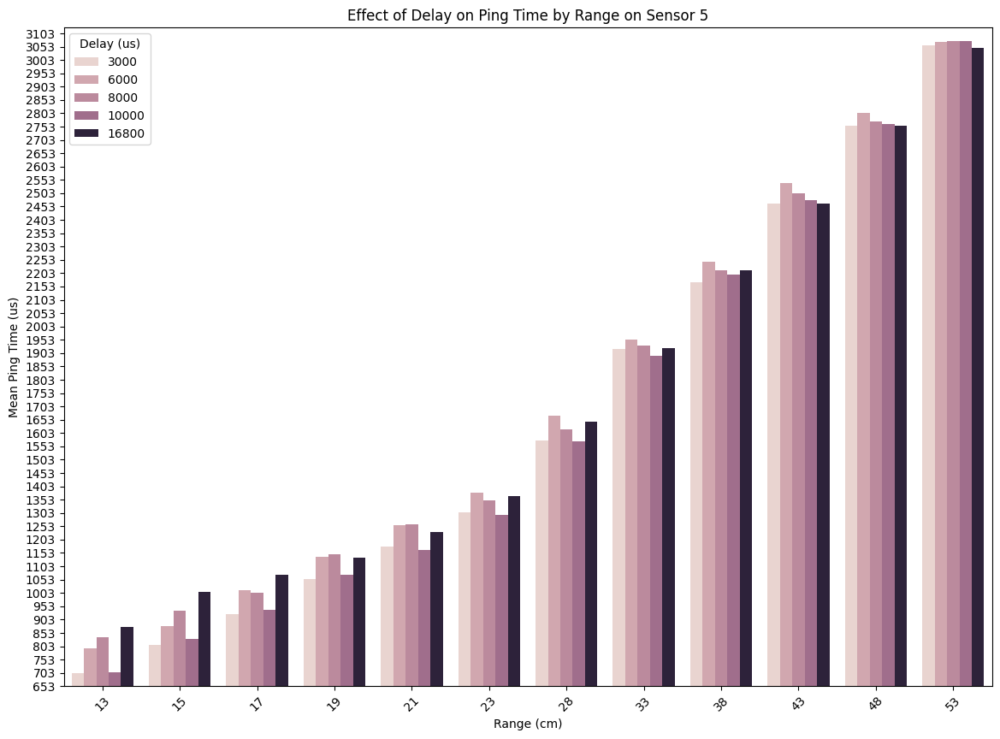

...

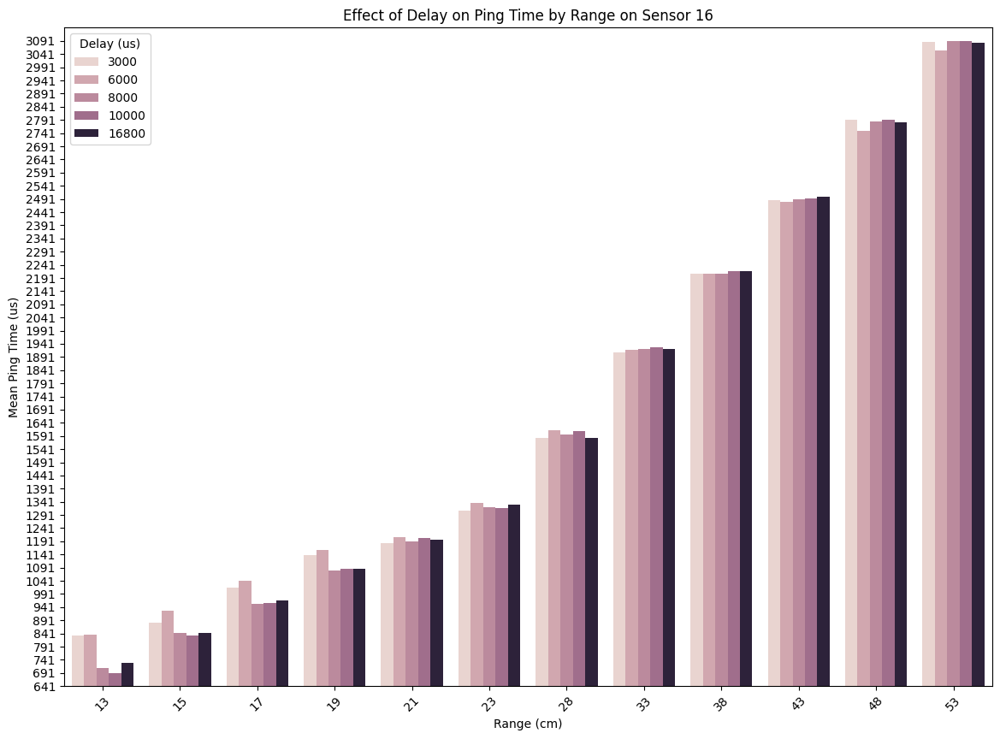

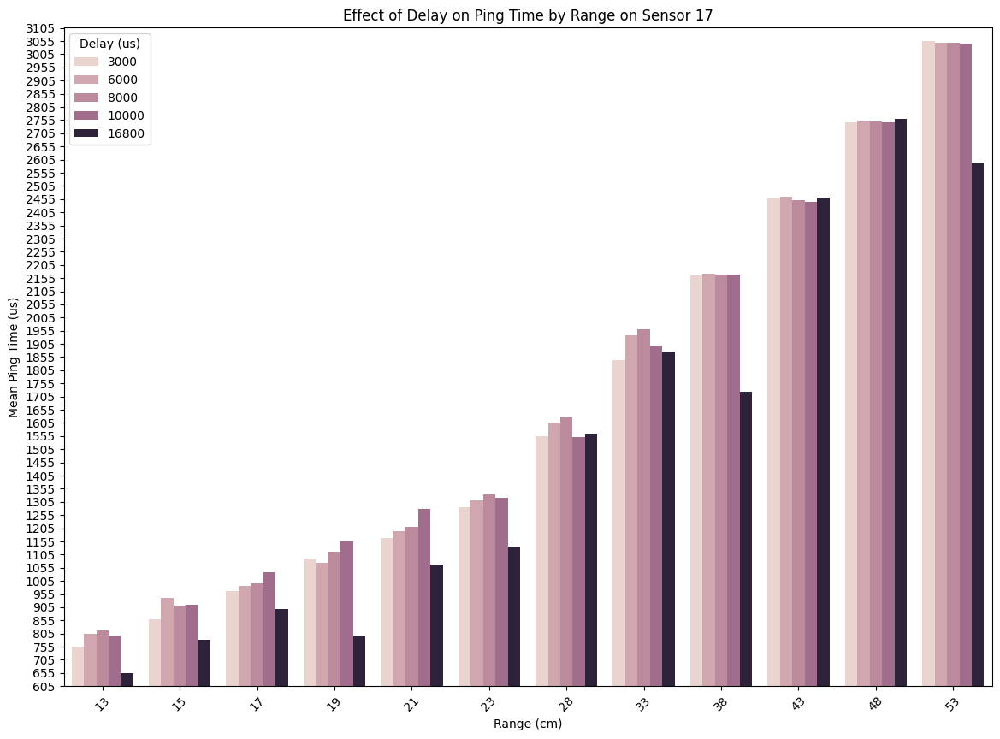

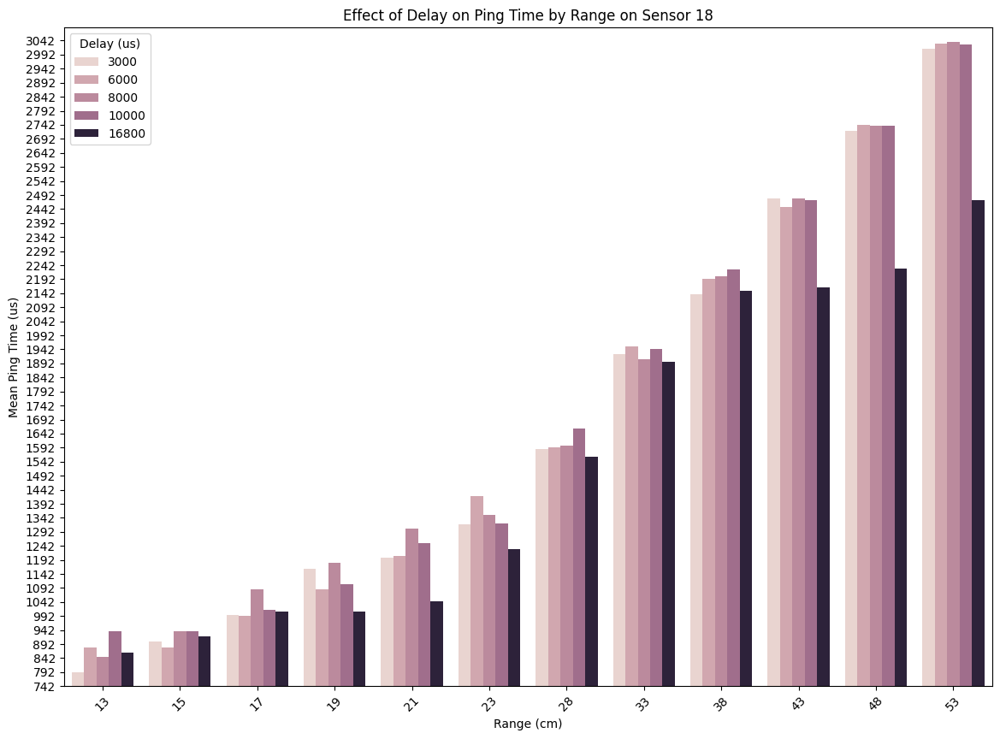

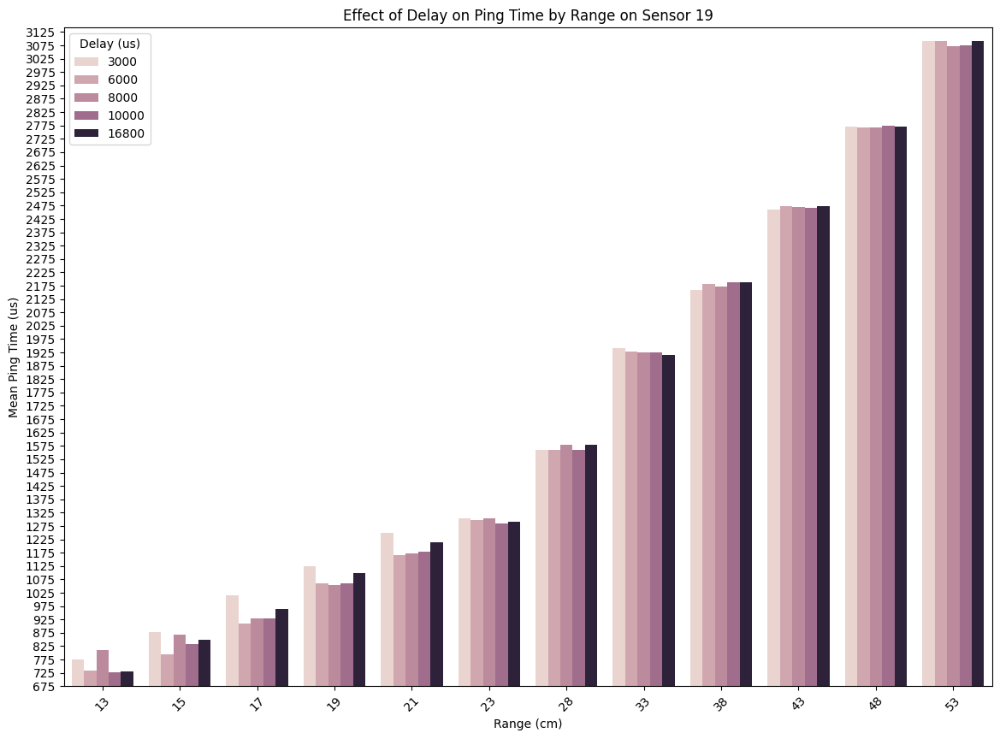

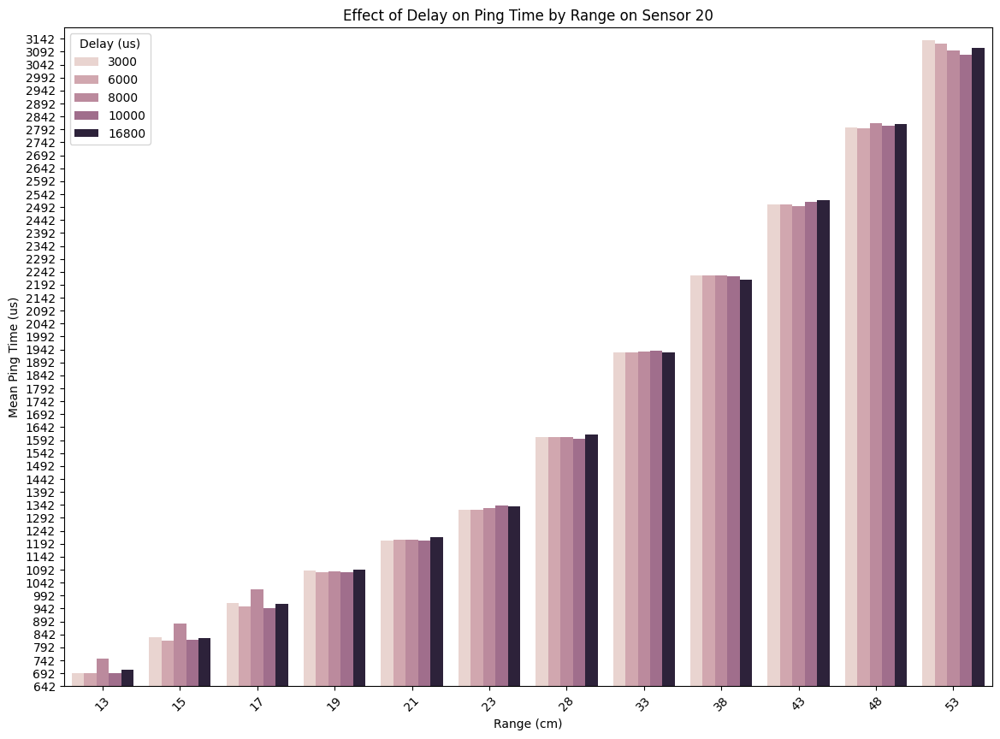

In [57]:
visualize_effect_on_ping_time_sensors(cleaned_df)

From these graph we can see that the each sensor have distinct graph shapes. This make the outlook of the project to characterize the sensor more promising.

### Line plot by range

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


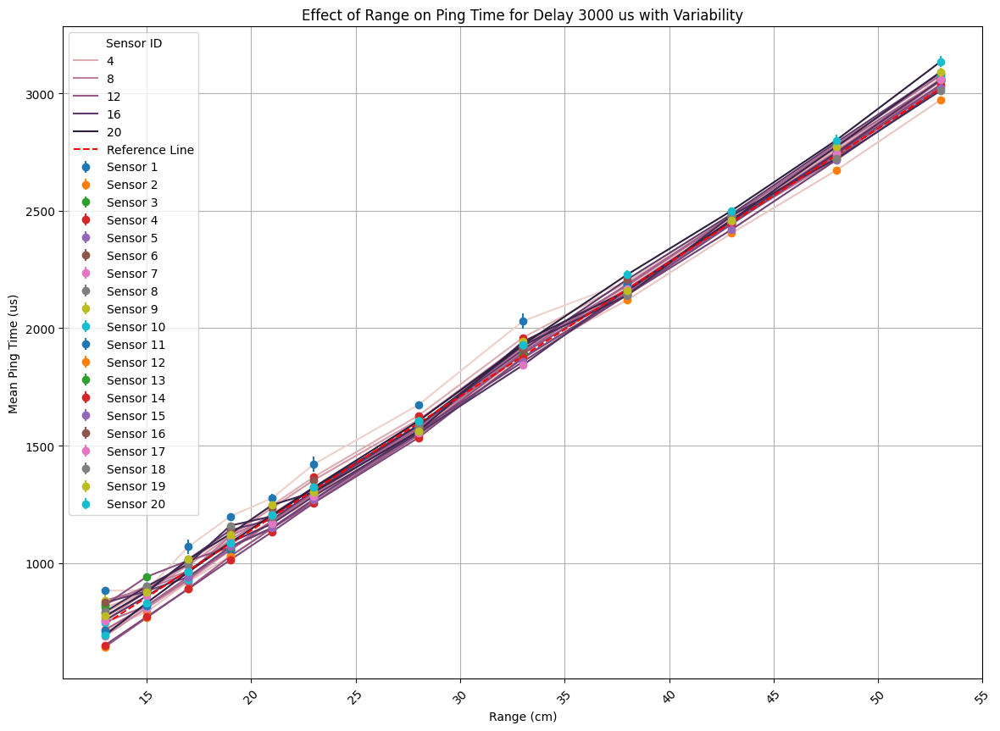

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


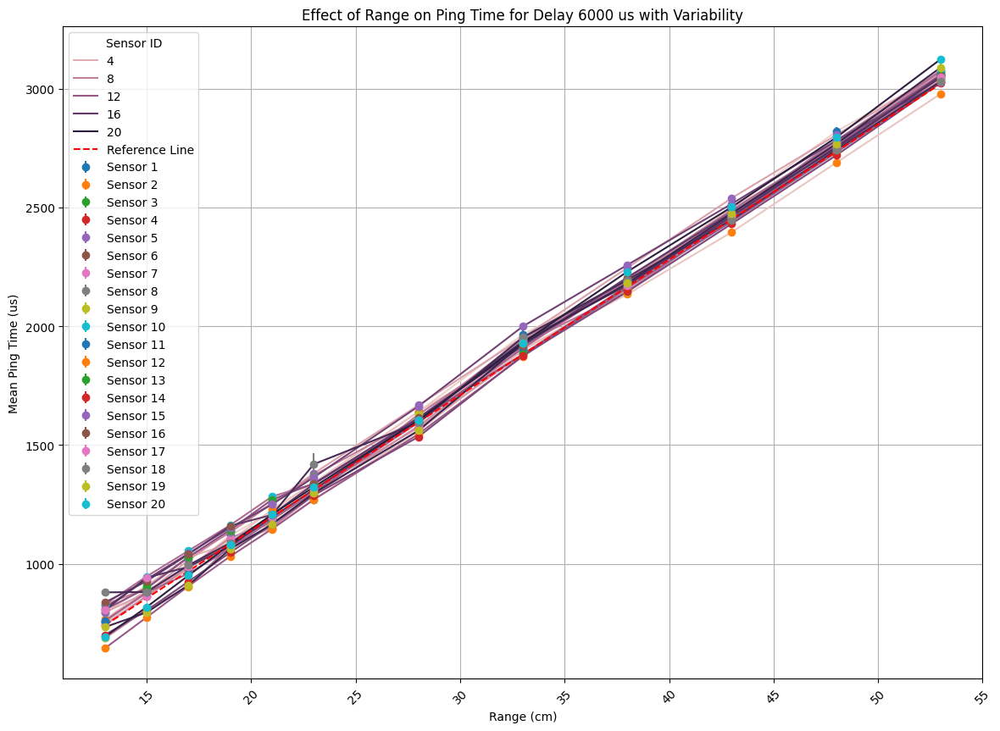

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


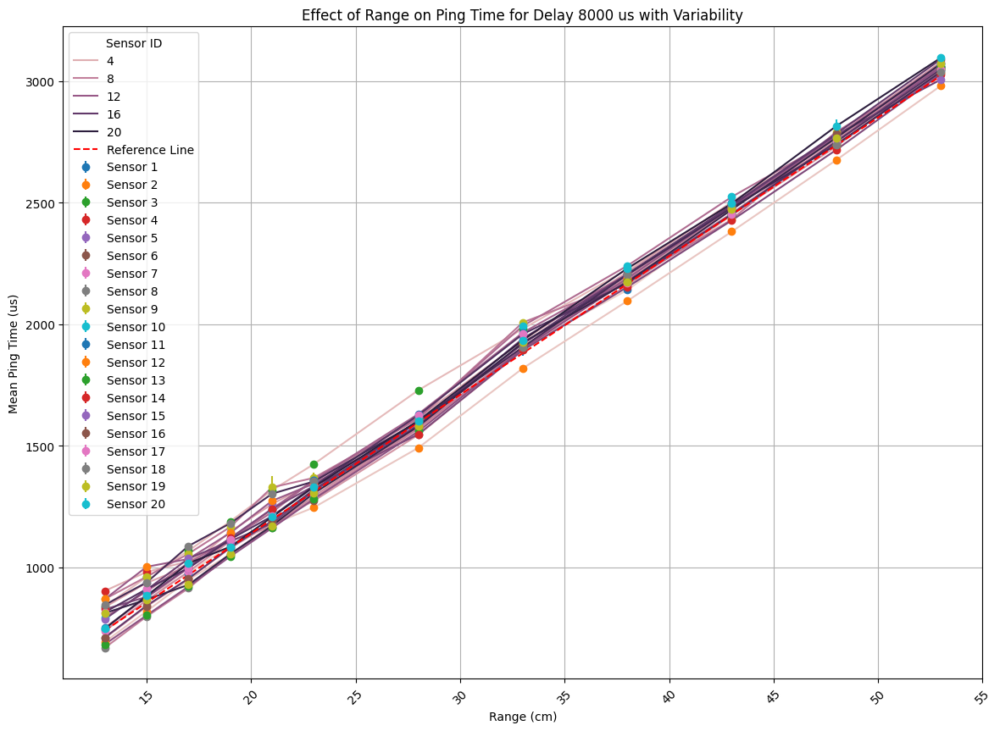

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


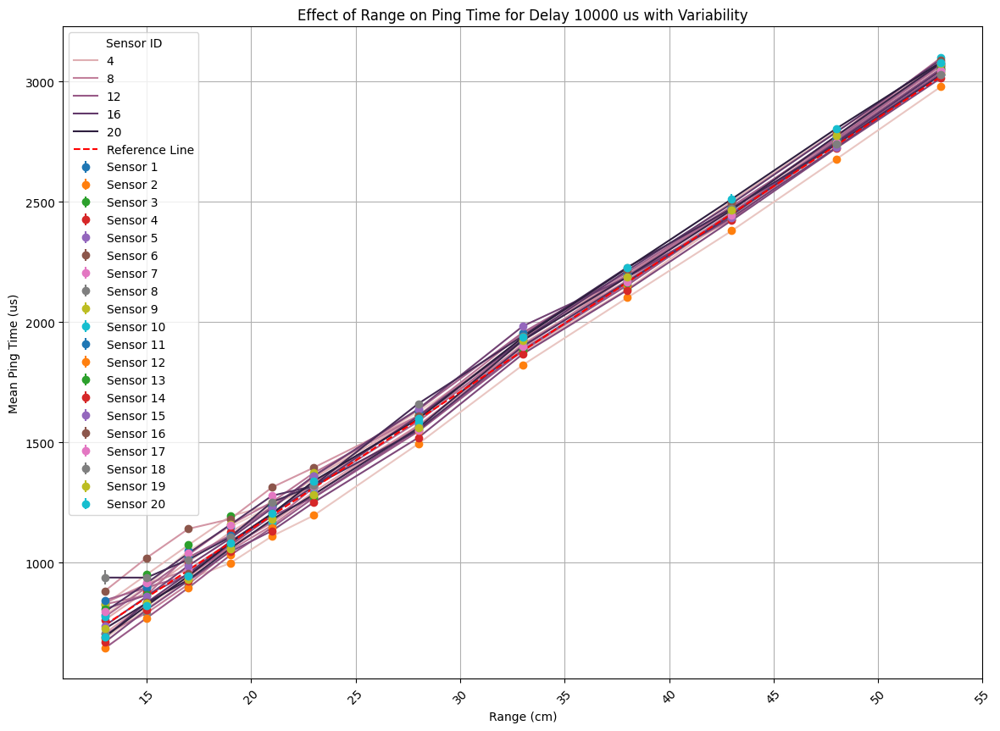

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


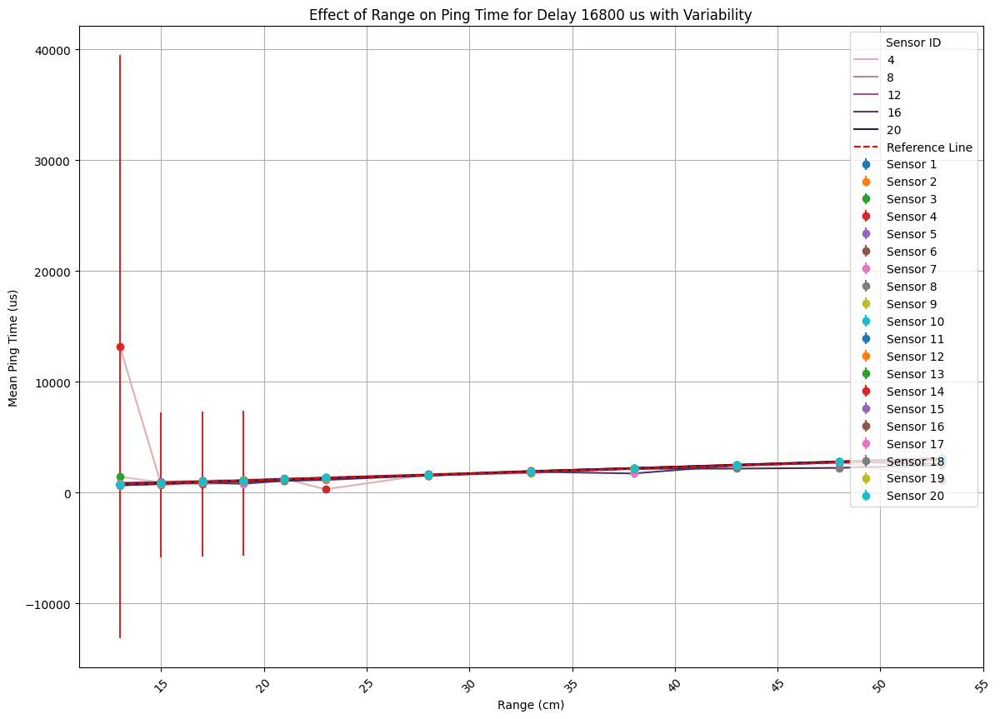

In [58]:
def visualize_lineplot_ping_time_with_variability(df):
    """
    Visualize the effect of range on ping time for each delay separately with variability.

    Parameters:
    df (DataFrame): The DataFrame containing the data.
    """
    # Group by sensor ID, delay, and range, then calculate the mean and standard deviation of ping time
    grouped_df = df.groupby(['Sensor ID', 'Delay (us)', 'Range (cm)']).agg(
        mean_ping_time=('Ping Time (us)', 'mean'),
        std_ping_time=('Ping Time (us)', 'std')
    ).reset_index()

    # Get unique delays
    unique_delays = grouped_df['Delay (us)'].unique()

    for delay in unique_delays:
        plt.figure(figsize=(14, 10))
        subset_df = grouped_df[grouped_df['Delay (us)'] == delay]
        sns.lineplot(
            x='Range (cm)', 
            y='mean_ping_time', 
            hue='Sensor ID', 
            data=subset_df,
            markers=True,
            dashes=False,
            err_style="bars", 
            ci=None
        )
        
        # Adding error bars
        for sensor_id in subset_df['Sensor ID'].unique():
            sensor_data = subset_df[subset_df['Sensor ID'] == sensor_id]
            plt.errorbar(sensor_data['Range (cm)'], sensor_data['mean_ping_time'], yerr=sensor_data['std_ping_time'], fmt='o', label=f'Sensor {sensor_id}')
        # Plot reference line
        ranges = np.linspace(subset_df['Range (cm)'].min(), subset_df['Range (cm)'].max(), 100)
        reference_ping_times = 57 * ranges
        plt.plot(ranges, reference_ping_times, color='red', linestyle='--', label='Reference Line')
        

        plt.title(f'Effect of Range on Ping Time for Delay {delay} us with Variability')
        plt.xlabel('Range (cm)')
        plt.ylabel('Mean Ping Time (us)')
        plt.legend(title='Sensor ID')
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.show()

# Call the function to visualize the plot
visualize_lineplot_ping_time_with_variability(cleaned_df)


## Identifying outliers and doing outlier analysis


#### Visualize Box Plot

In [59]:
def visualize_stacked_box_plots(df):
    """
    Visualize the effect of range on ping time using stacked box plots for each delay.

    Parameters:
    df (DataFrame): The DataFrame containing the data.
    """
    # Get unique delay values
    unique_ranges = df['Range (cm)'].unique()
    
    for range_val in unique_ranges:
        subset_df = df[df['Range (cm)'] == range_val]
        plt.figure(figsize=(16, 12))
        sns.boxplot(
            x='Sensor ID', 
            y='Ping Time (us)', 
            hue='Delay (us)', 
            data=subset_df
        )
        correct_ping_time = (2 * range_val / 100) / 343 * 1e6
        plt.axhline(correct_ping_time, color='red', linestyle='--', linewidth=2, label='Correct Ping Time')
                
        plt.title(f'Stacked Box Plot of Ping Time (us) Grouped by Delay (us) for Range {range_val} cm')
        plt.xlabel('Sensor ID')
        plt.ylabel('Ping Time (us)')
        plt.legend(title='Sensor ID', bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.grid(True)
        plt.xticks(rotation=45)
        # Adjust y-axis limits for better precision
        min_ping_time = subset_df['Ping Time (us)'].min()
        max_ping_time = subset_df['Ping Time (us)'].max()
        plt.ylim(min_ping_time - 50, max_ping_time + 50)  # Adjust the limits as needed
        plt.show()

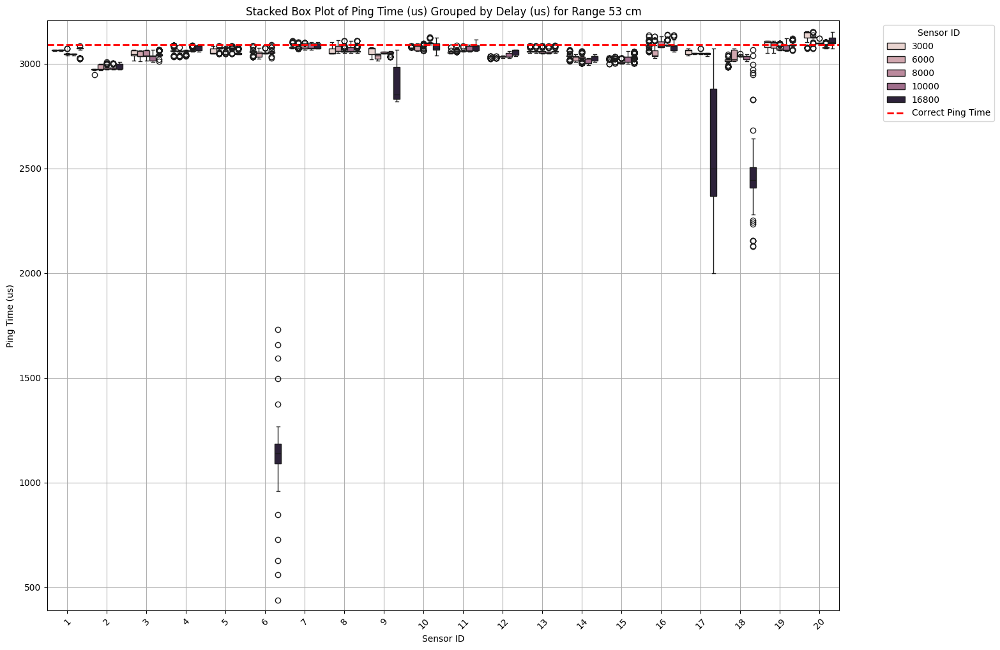

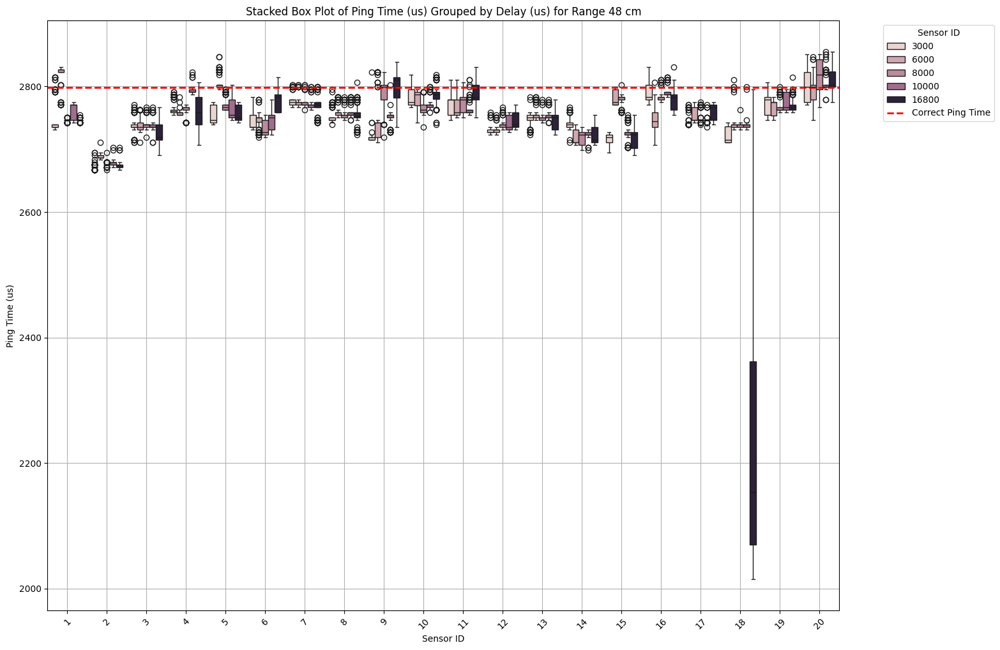

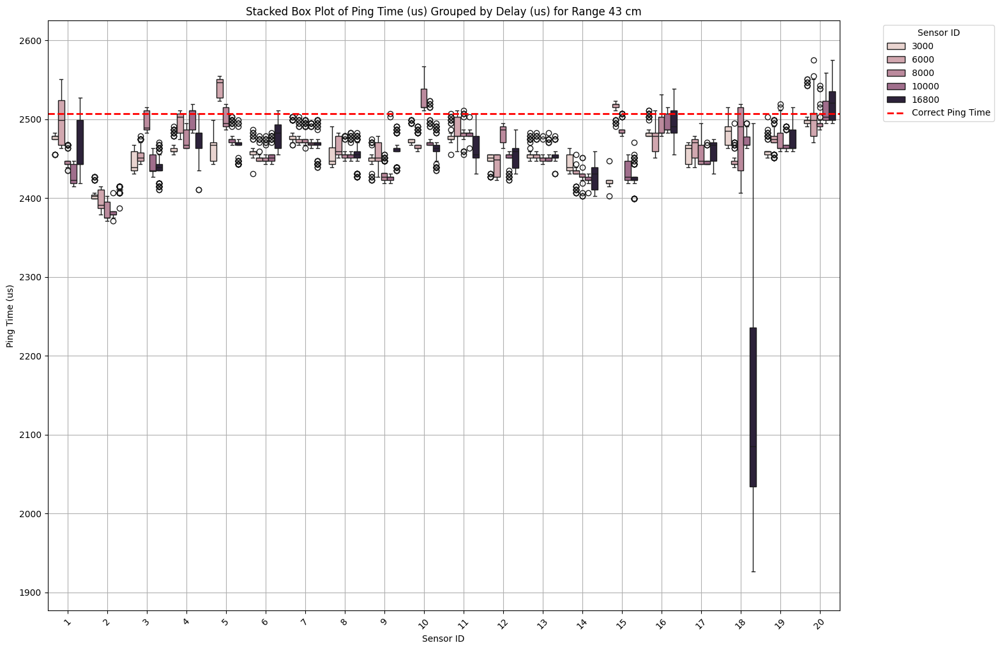

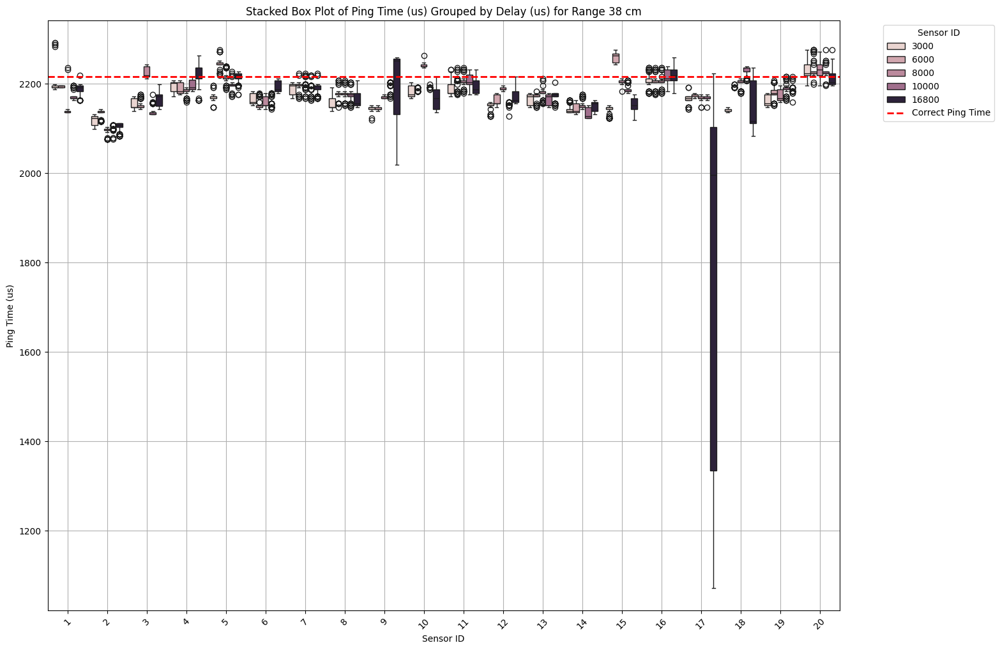

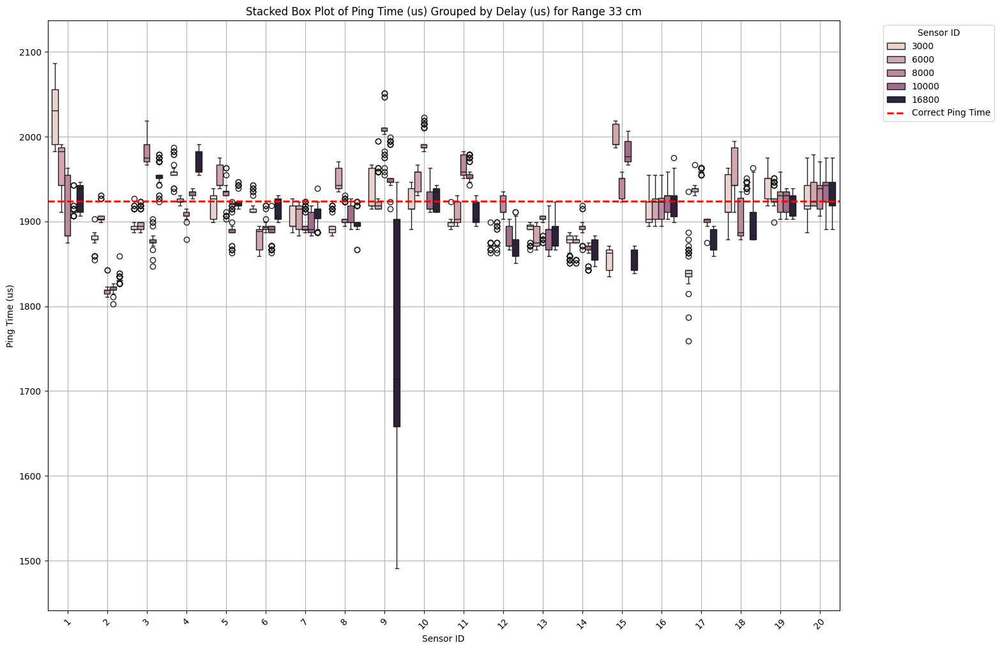

...

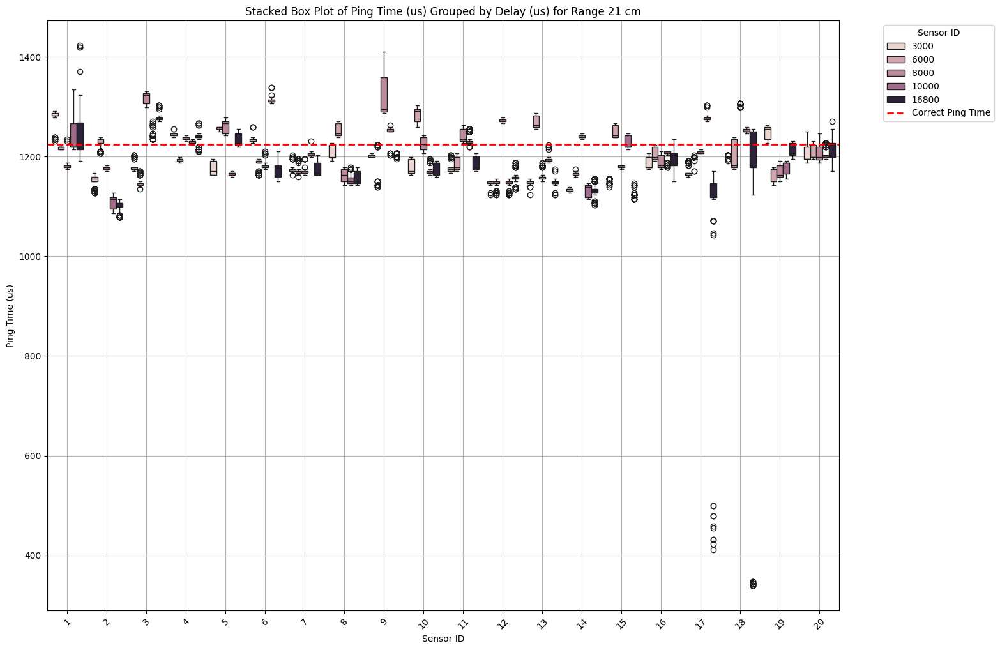

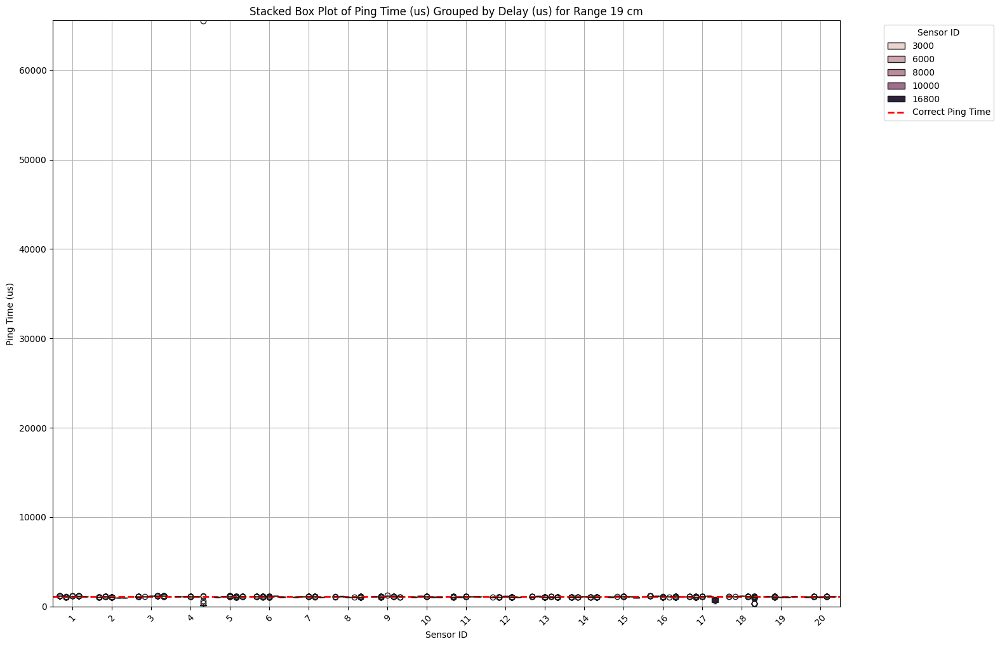

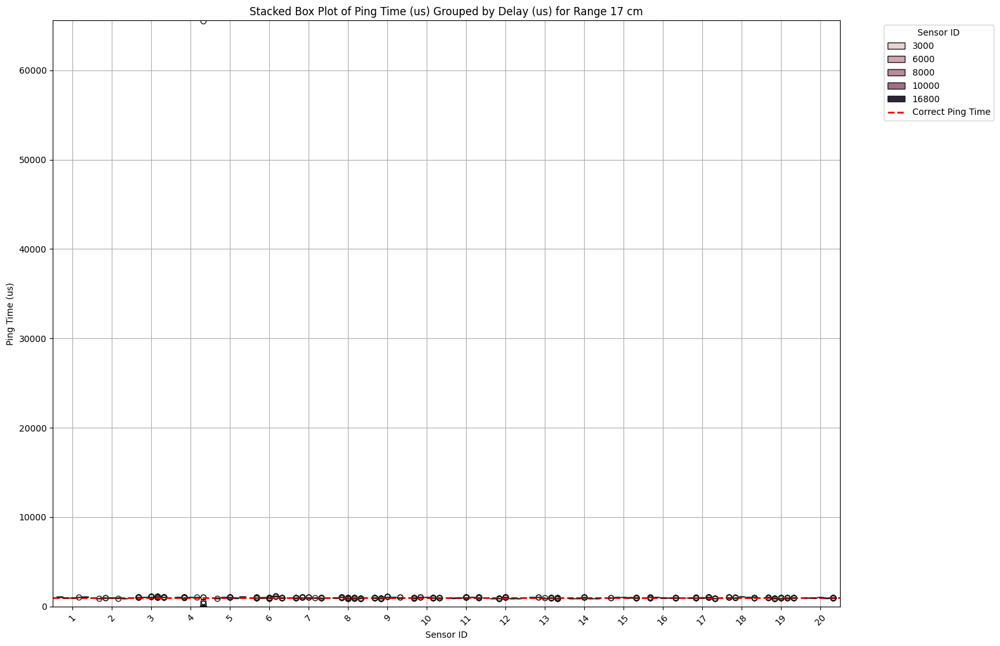

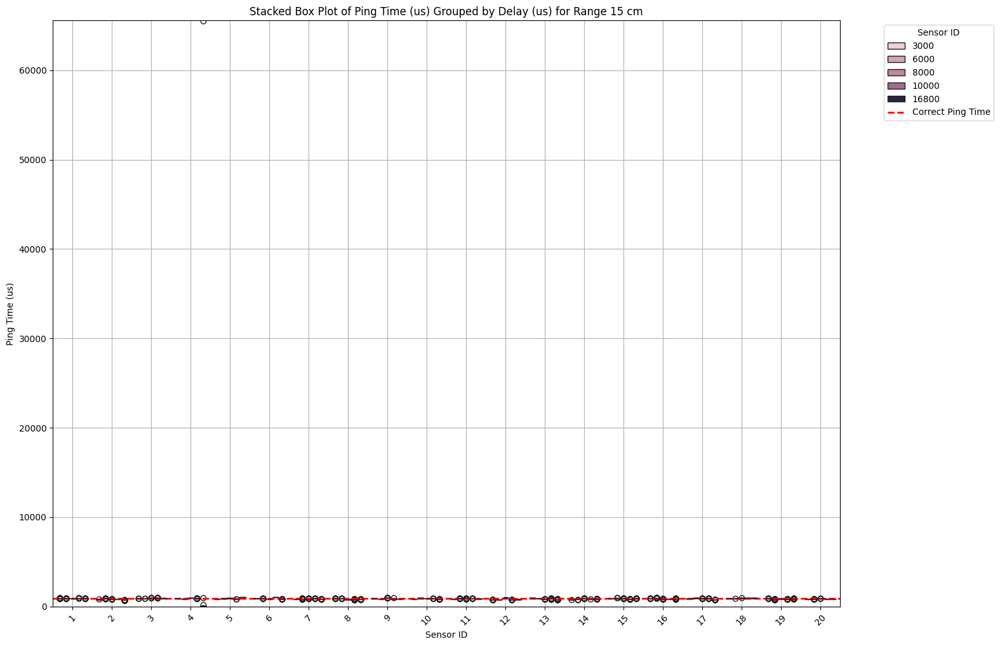

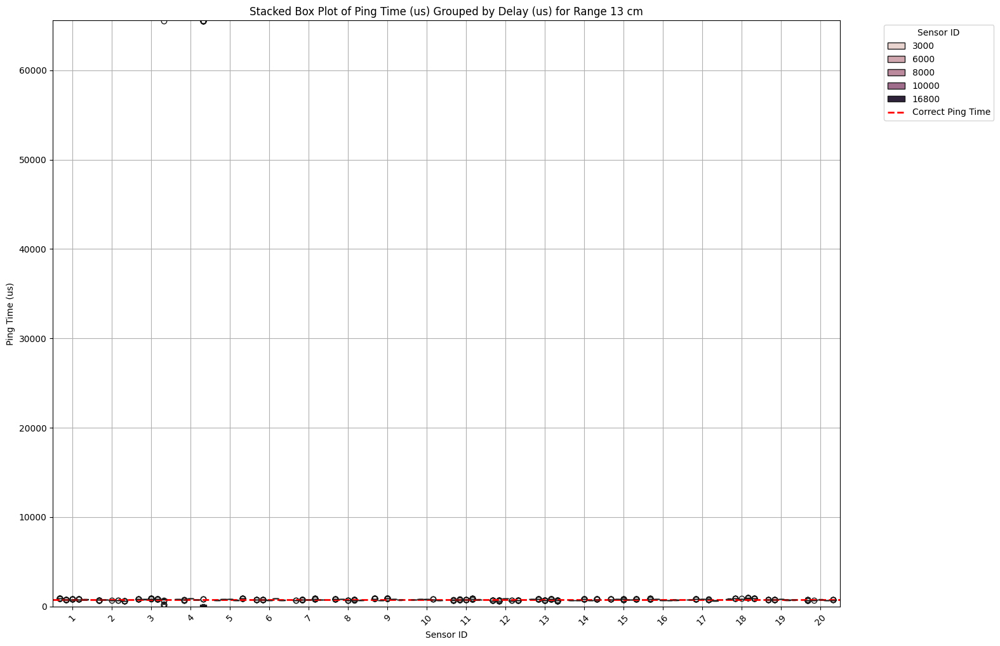

In [60]:
visualize_stacked_box_plots(cleaned_df)

#### Getting data ready


Even though this project has a some aspect of anamoly detection we will separate lower bound and upper bound to do the analysis.

To do so we will use the box plot where it will take lower 25% and upper 25%.

In [61]:
def identify_and_remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_no_outliers = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    df_outliers_lower = df[(df[column] <= lower_bound)]
    df_outliers_upper = df[(df[column] >= upper_bound)]
    return df_no_outliers,df_outliers_lower,df_outliers_upper

To remove outliers it will be done by groups where we group by 'Sensor ID', 'Delay (us)' and 'Range (cm)'. 
This will treat one stationary data collection done during sequence data collection command as a group and from those group we will identify outliers.

This will ensure fairness of removing process rather than doing as a whole.

In [62]:
# Group the data by 'Sensor ID', 'Delay (us)', and 'Range (cm)'
cleaned_data = cleaned_df.copy()
grouped = cleaned_data.groupby(['Sensor ID', 'Delay (us)', 'Range (cm)'])

# Identify and remove outliers for each group
middle_quartile = []
lower_quartile = []
upper_quartile = []

for name, group in grouped:
    cleaned_group = group.copy()
    for column in ['Ping Time (us)']:
        middle_quartile_group,lower_quartile_group,upper_quartile_group = identify_and_remove_outliers(cleaned_group, column)
    middle_quartile.append(middle_quartile_group)
    lower_quartile.append(lower_quartile_group)
    upper_quartile.append(upper_quartile_group)

In [63]:
# Combine the cleaned groups into a single DataFrame
df_removed_outliers = pd.concat(middle_quartile)
df_outliers_lower = pd.concat(lower_quartile)
df_outliers_upper = pd.concat(upper_quartile)

Result of the split

In [64]:
df_removed_outliers

,Trial,Ping Duration,Distance (cm),Ping Time (us),Delay (us),Steps,Arduino ID,Sensor ID,Range (cm),Color of sensor,Angle on XY plane,side a (cm),side c (cm),Angle on YZ plane,Sensor Configuration,Sensor Angle,Surface material,Surface Length (cm),Surface Width (cm)
111503,3,6124,15,883,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111504,4,6124,15,883,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111505,5,6128,15,883,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111507,7,6124,15,883,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111508,8,6128,15,883,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69695,95,4020,54,3103,16800,0,1,20,53,b,0,18.3,0,0,HTR,90,wood,31,30.5
69696,96,4040,54,3123,16800,0,1,20,53,b,0,18.3,0,0,HTR,90,wood,31,30.5
69697,97,4040,54,3123,16800,0,1,20,53,b,0,18.3,0,0,HTR,90,wood,31,30.5
69698,98,4040,54,3115,16800,0,1,20,53,b,0,18.3,0,0,HTR,90,wood,31,30.5


In [65]:
df_outliers_lower

,Trial,Ping Duration,Distance (cm),Ping Time (us),Delay (us),Steps,Arduino ID,Sensor ID,Range (cm),Color of sensor,Angle on XY plane,side a (cm),side c (cm),Angle on YZ plane,Sensor Configuration,Sensor Angle,Surface material,Surface Length (cm),Surface Width (cm)
111500,0,6148,15,879,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111501,1,6148,15,879,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111502,2,6148,15,879,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111534,34,6124,15,879,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111537,37,6124,15,879,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70558,58,1860,16,931,16800,9432,1,20,17,b,0,18.3,0,0,HTR,90,wood,31,30.5
70559,59,1852,16,935,16800,9432,1,20,17,b,0,18.3,0,0,HTR,90,wood,31,30.5
70583,83,1856,16,931,16800,9432,1,20,17,b,0,18.3,0,0,HTR,90,wood,31,30.5
70596,96,1856,16,935,16800,9432,1,20,17,b,0,18.3,0,0,HTR,90,wood,31,30.5


In [66]:
df_outliers_upper

,Trial,Ping Duration,Distance (cm),Ping Time (us),Delay (us),Steps,Arduino ID,Sensor ID,Range (cm),Color of sensor,Angle on XY plane,side a (cm),side c (cm),Angle on YZ plane,Sensor Configuration,Sensor Angle,Surface material,Surface Length (cm),Surface Width (cm)
111506,6,6128,15,887,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111509,9,6128,15,887,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111512,12,6128,15,887,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111515,15,6128,15,887,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111516,16,6128,15,887,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70589,89,1908,17,979,16800,9432,1,20,17,b,0,18.3,0,0,HTR,90,wood,31,30.5
70591,91,1900,17,987,16800,9432,1,20,17,b,0,18.3,0,0,HTR,90,wood,31,30.5
70592,92,1912,17,987,16800,9432,1,20,17,b,0,18.3,0,0,HTR,90,wood,31,30.5
70374,74,2192,22,1271,16800,8384,1,20,21,b,0,18.3,0,0,HTR,90,wood,31,30.5


#### Visualize Effect of delay and range

This will show how middle quartile where there are no outliers would portray similar shape of graphs. 

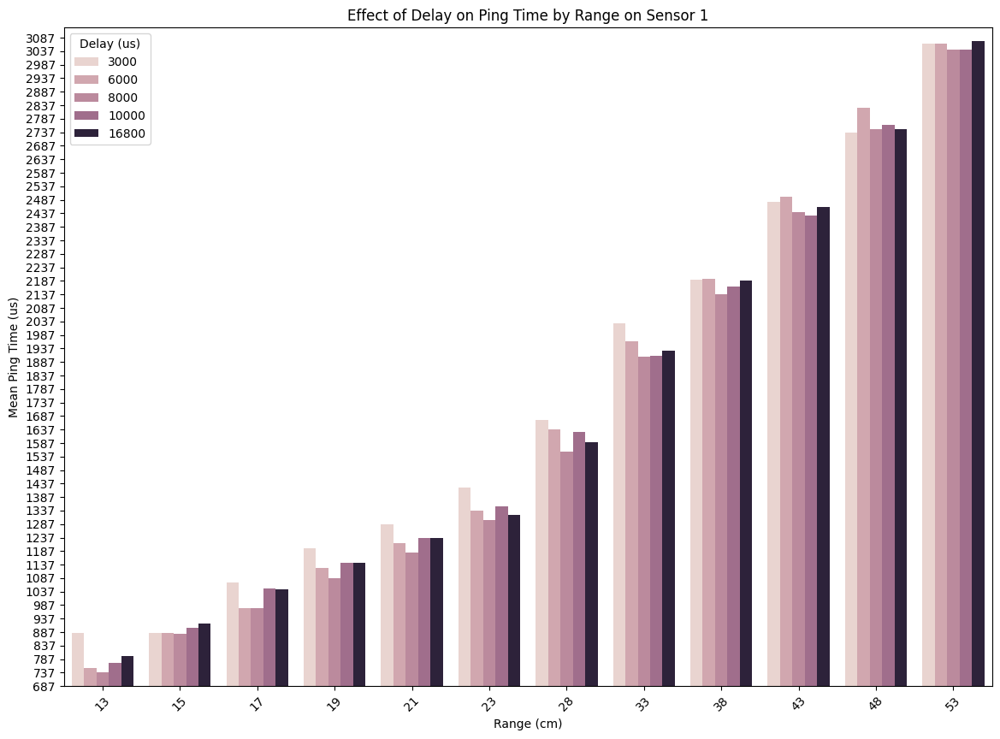

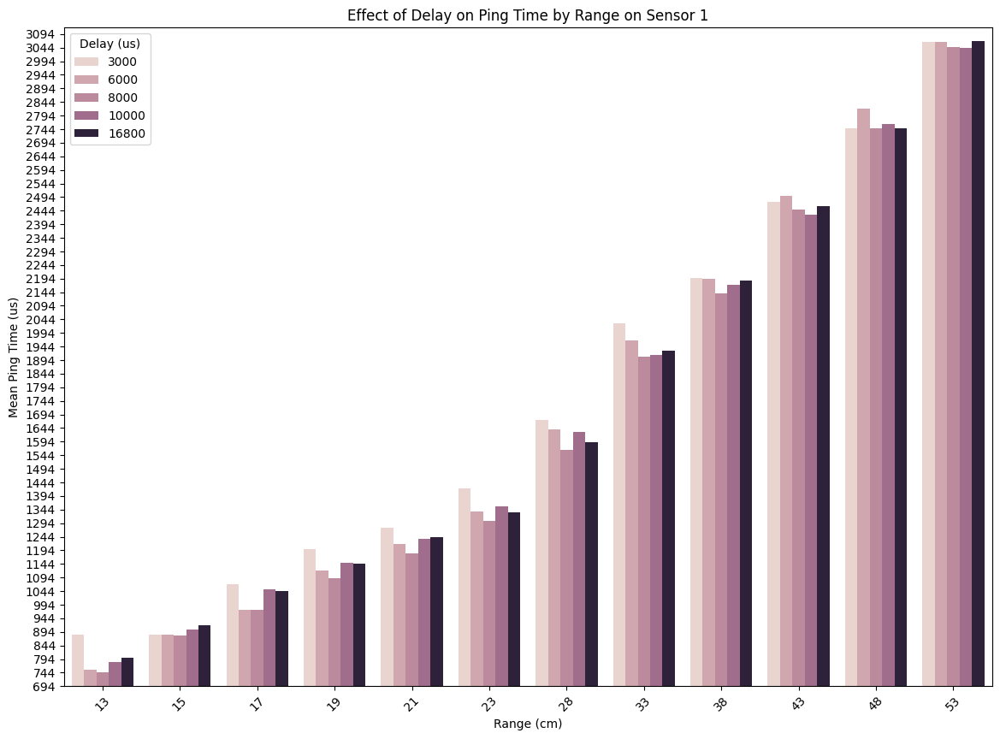

In [67]:
# visualize sensor 1
visualize_effect_on_ping_time_sensors(df_removed_outliers,1)
visualize_effect_on_ping_time_sensors(cleaned_df,1)

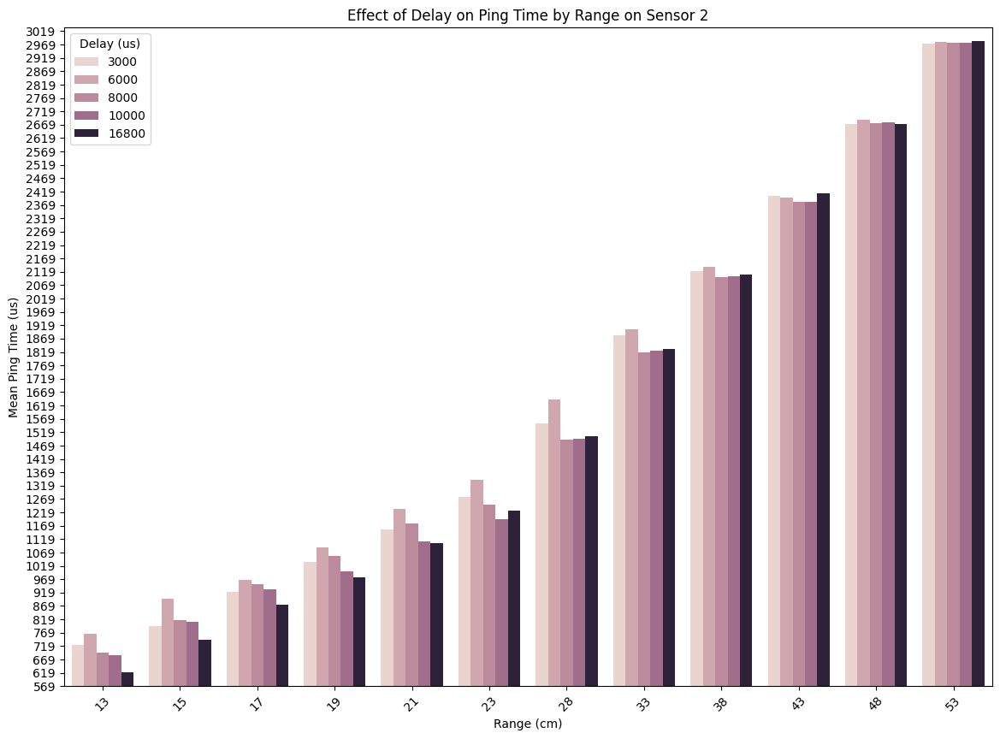

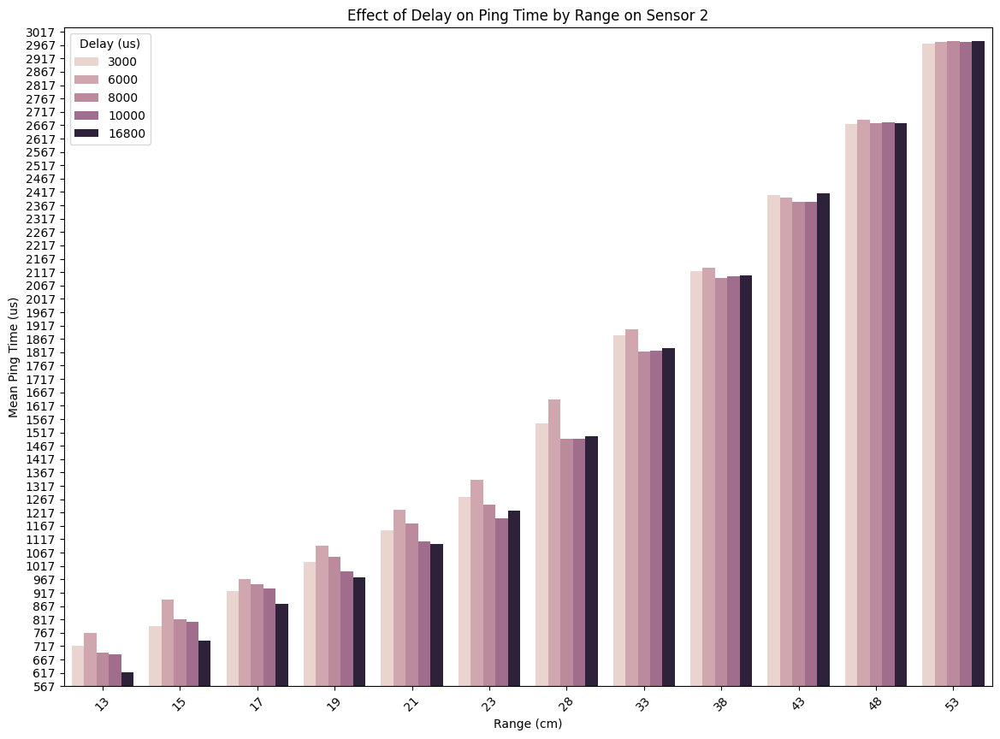

In [68]:
# visualize sensor 2
visualize_effect_on_ping_time_sensors(df_removed_outliers,2)
visualize_effect_on_ping_time_sensors(cleaned_df,2)

Sensor 1 and 2 doesn't show much difference 

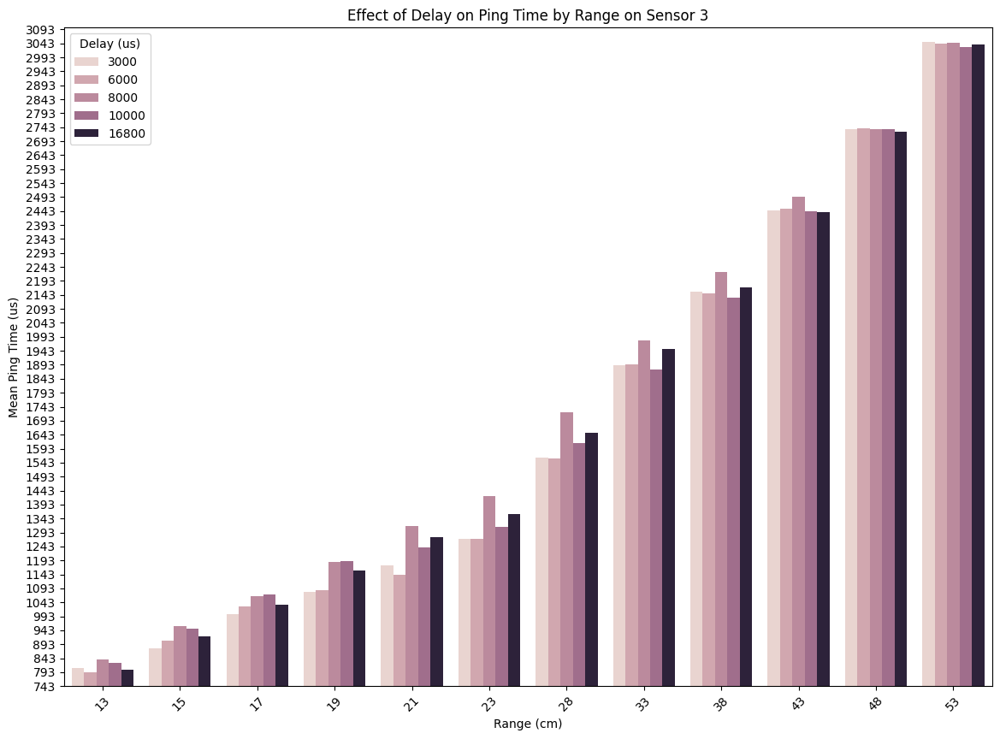

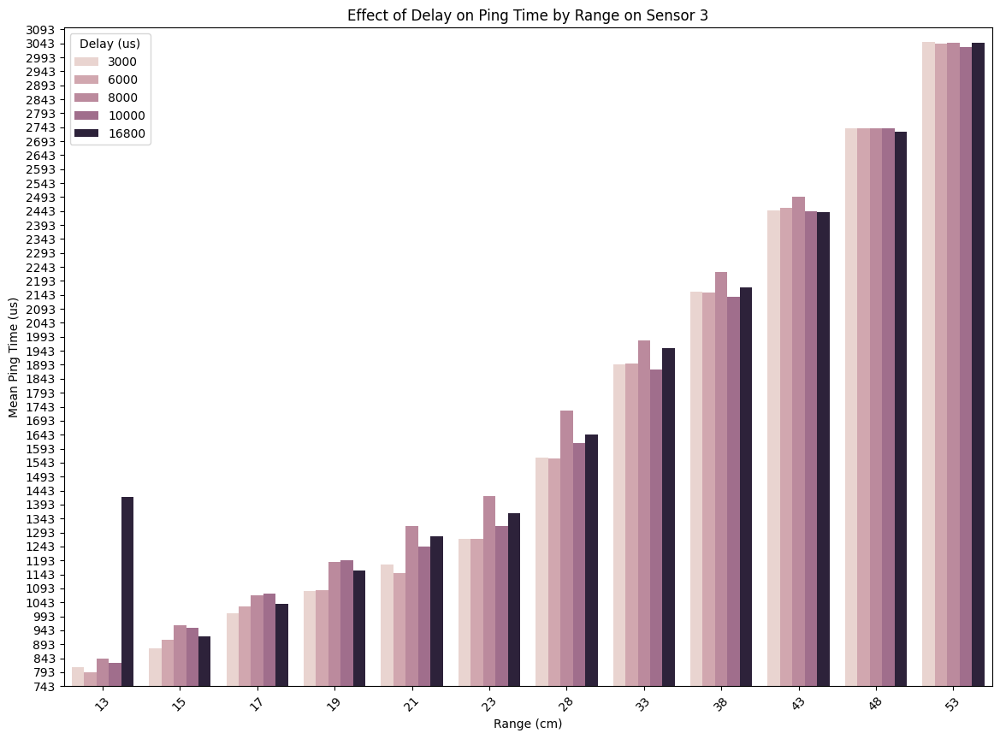

In [69]:
# visualize sensor 3
visualize_effect_on_ping_time_sensors(df_removed_outliers,3)
visualize_effect_on_ping_time_sensors(cleaned_df,3)

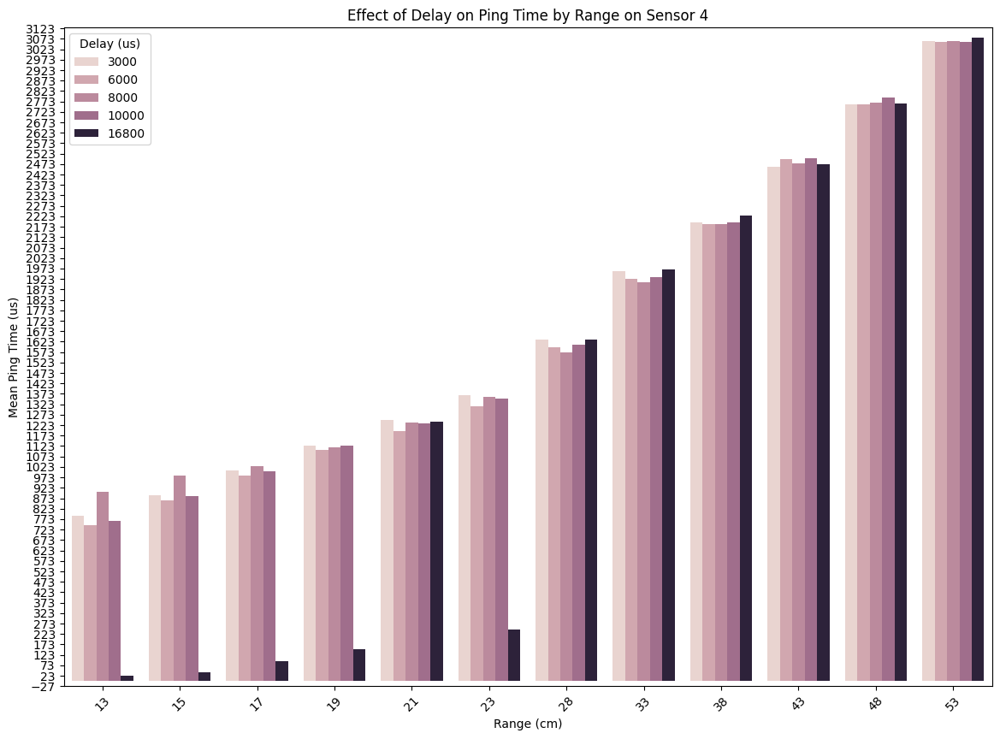

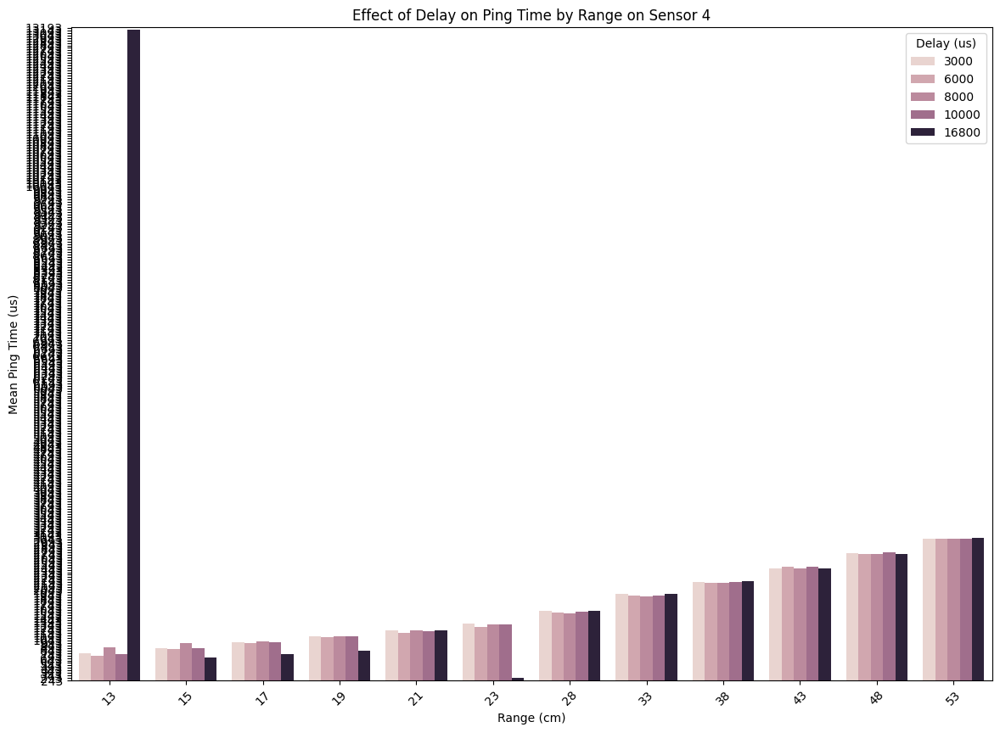

In [70]:
# visualize sensor 4
visualize_effect_on_ping_time_sensors(df_removed_outliers,4)
visualize_effect_on_ping_time_sensors(cleaned_df,4)

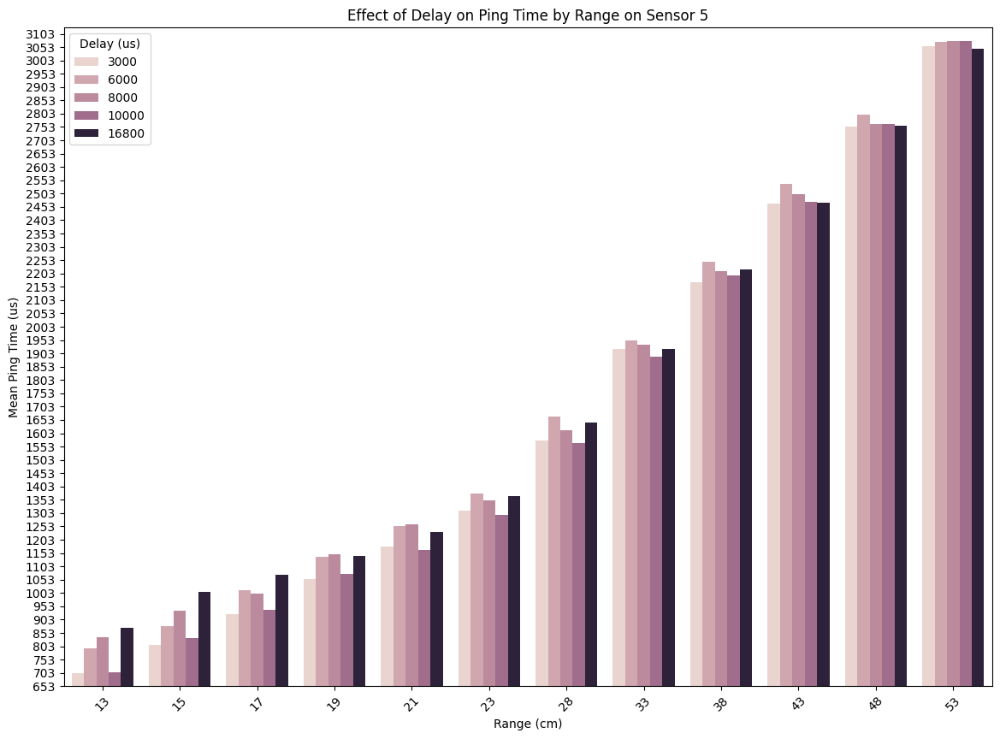

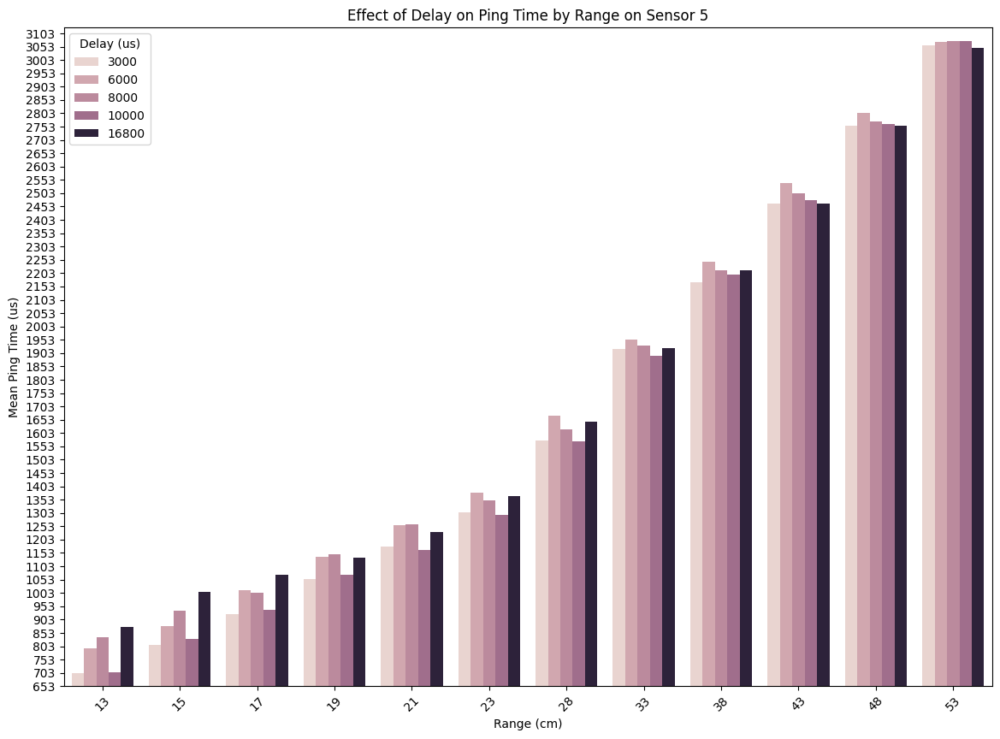

In [71]:
# visualize sensor 5
visualize_effect_on_ping_time_sensors(df_removed_outliers,5)
visualize_effect_on_ping_time_sensors(cleaned_df,5)

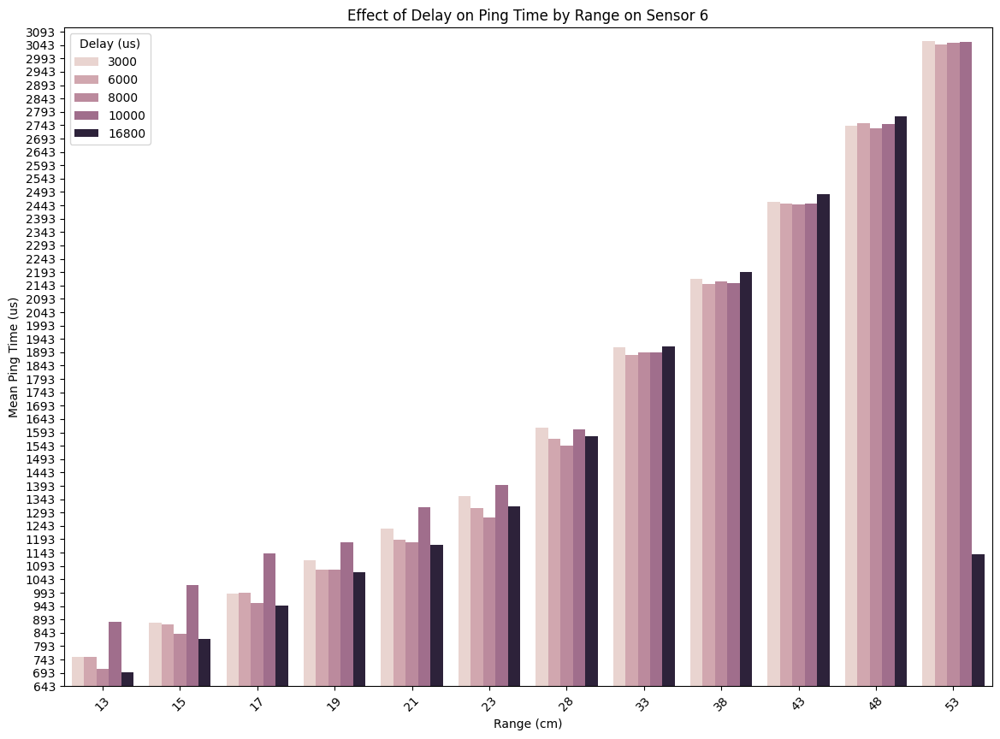

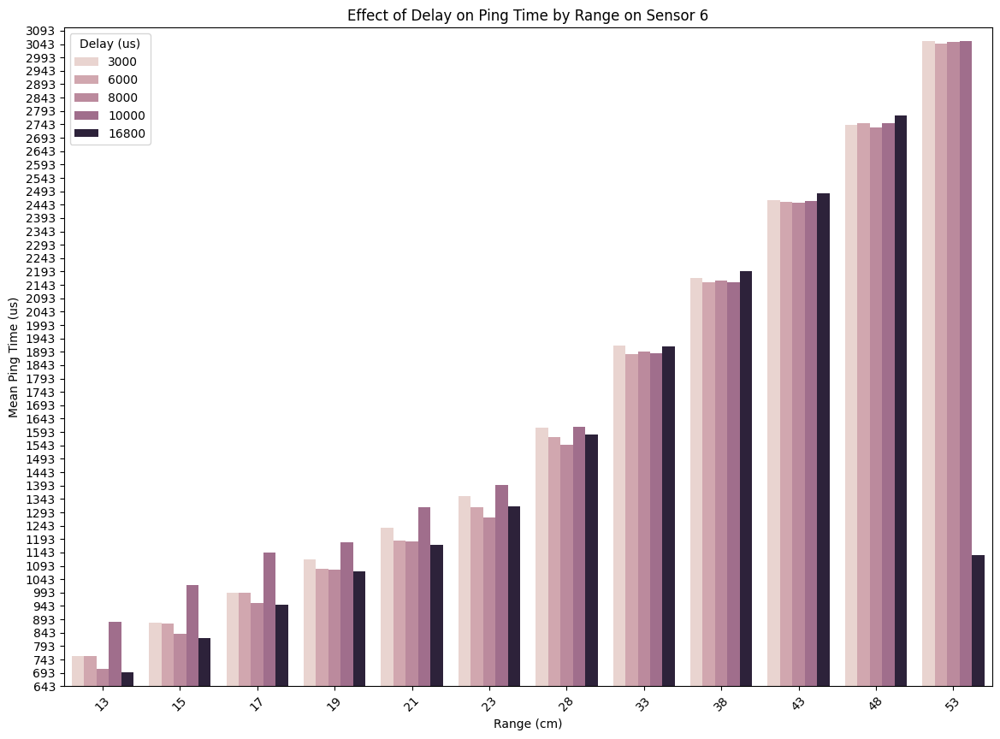

In [72]:
# visualize sensor 6
visualize_effect_on_ping_time_sensors(df_removed_outliers,6)
visualize_effect_on_ping_time_sensors(cleaned_df,6)

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


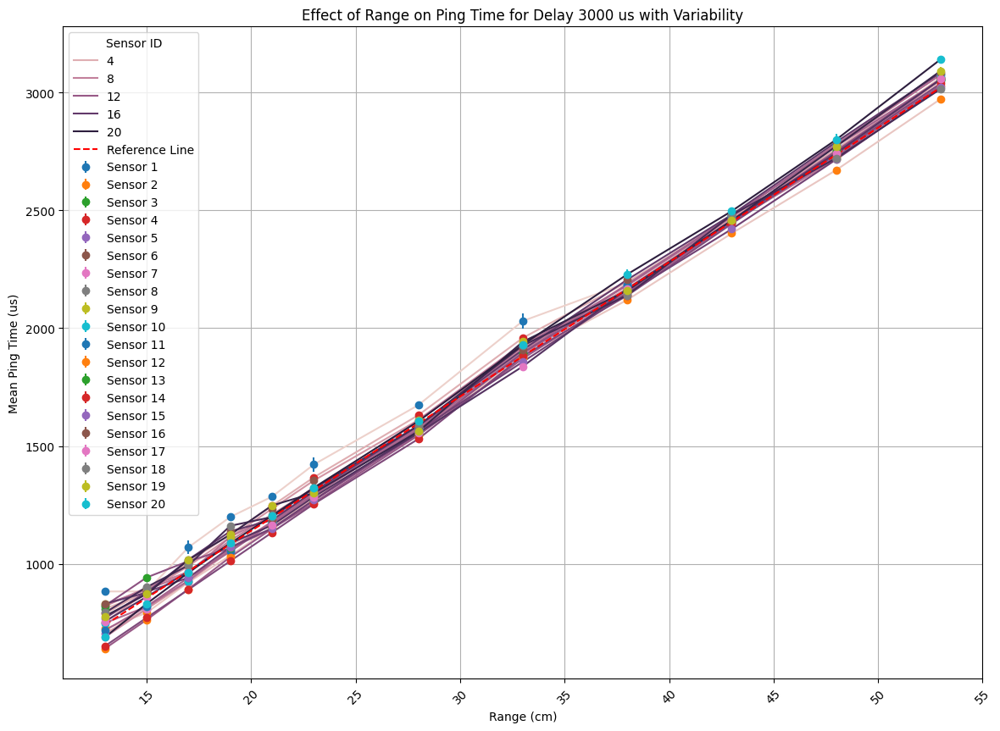

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


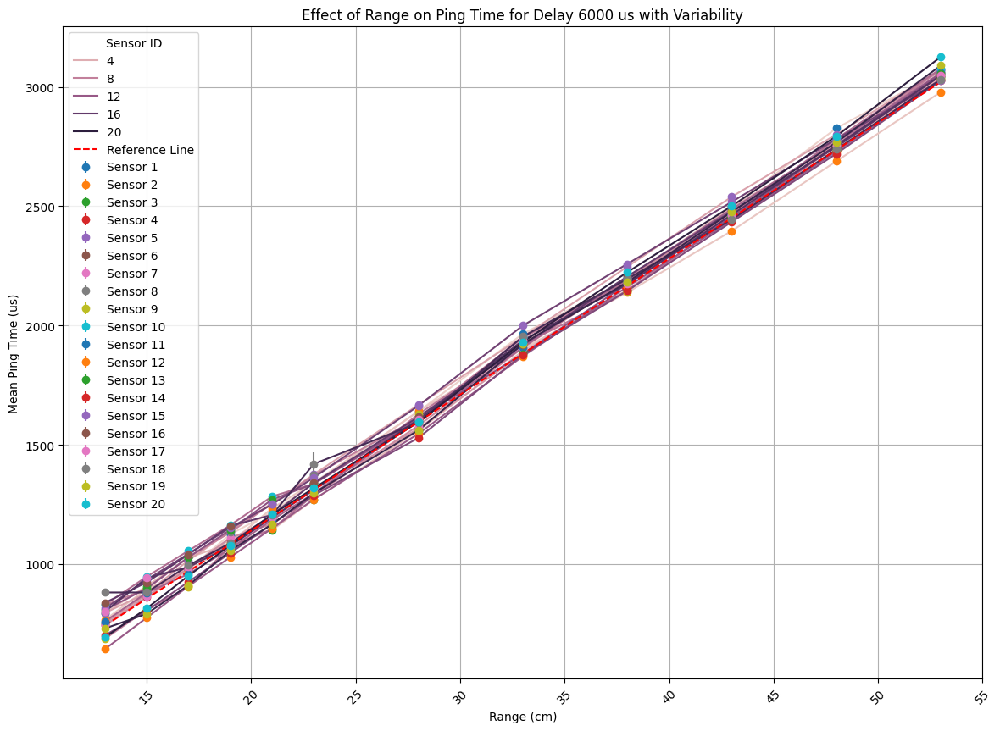

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


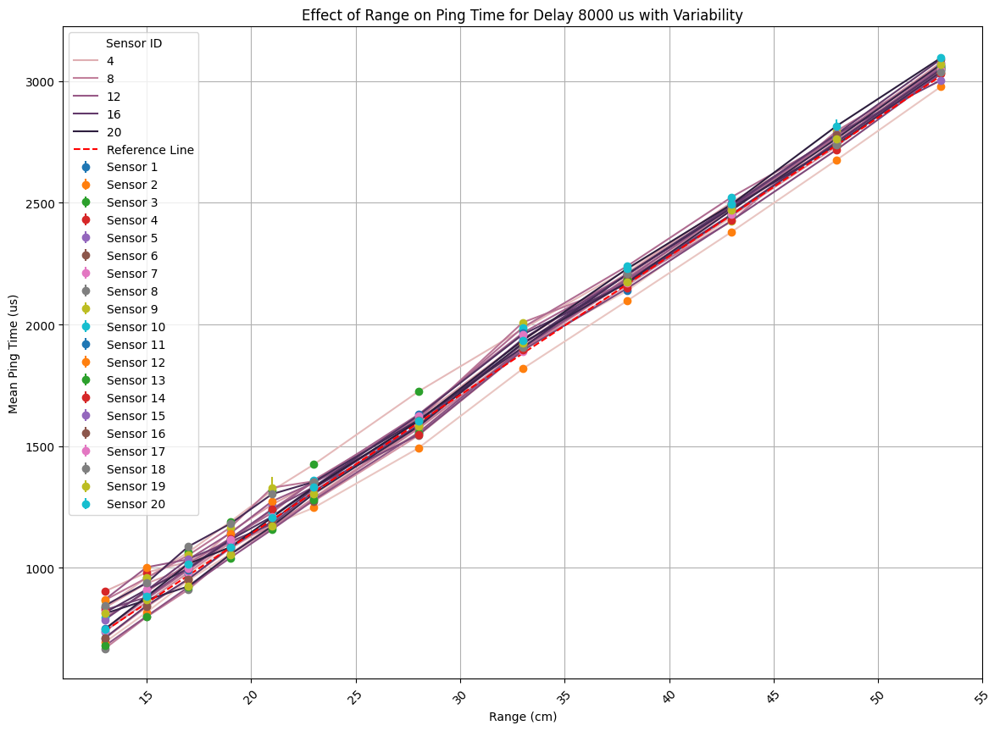

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


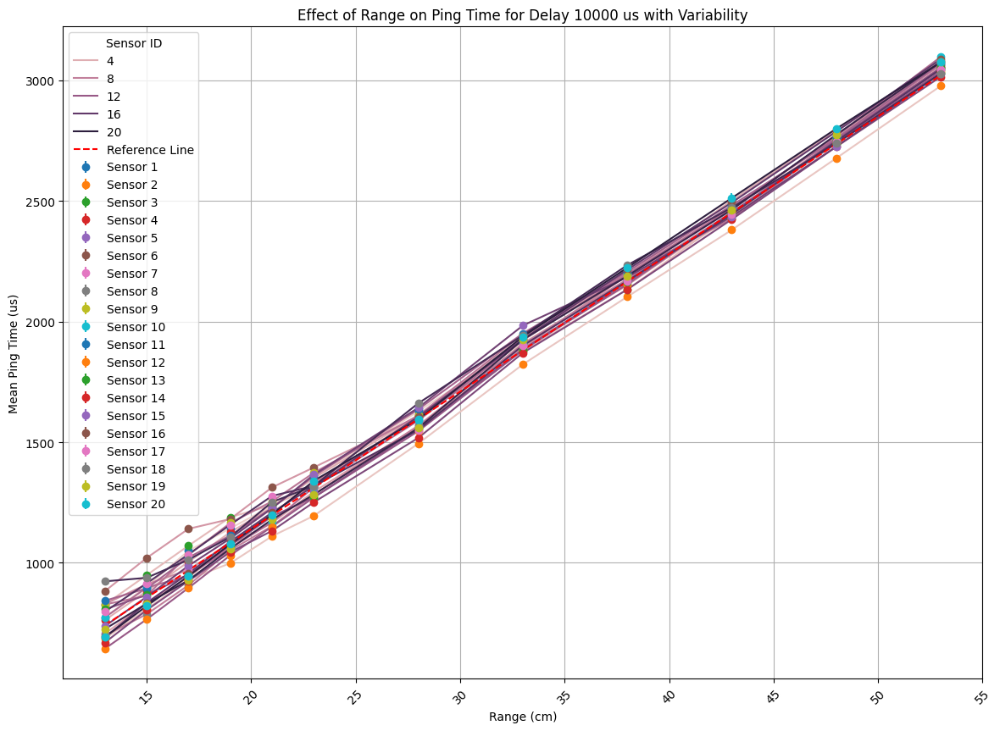

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


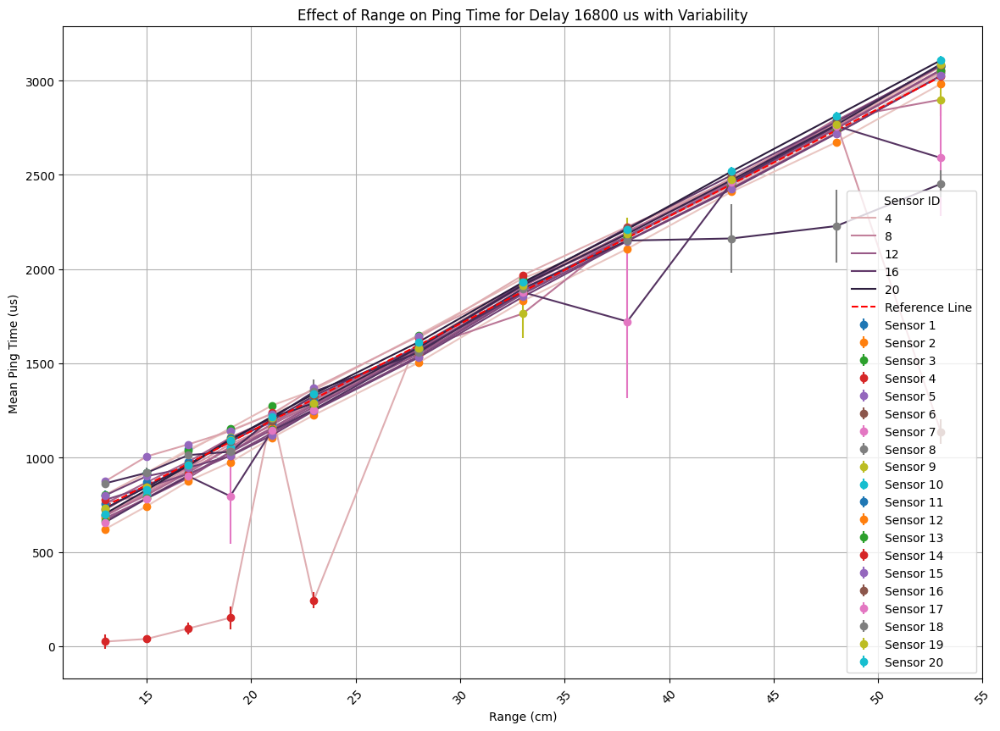

In [73]:
visualize_lineplot_ping_time_with_variability(df_removed_outliers)

### Investigate lower and upper bounds

From this analysis we will see if they will express characters

In [74]:
df_outliers_lower

,Trial,Ping Duration,Distance (cm),Ping Time (us),Delay (us),Steps,Arduino ID,Sensor ID,Range (cm),Color of sensor,Angle on XY plane,side a (cm),side c (cm),Angle on YZ plane,Sensor Configuration,Sensor Angle,Surface material,Surface Length (cm),Surface Width (cm)
111500,0,6148,15,879,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111501,1,6148,15,879,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111502,2,6148,15,879,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111534,34,6124,15,879,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111537,37,6124,15,879,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70558,58,1860,16,931,16800,9432,1,20,17,b,0,18.3,0,0,HTR,90,wood,31,30.5
70559,59,1852,16,935,16800,9432,1,20,17,b,0,18.3,0,0,HTR,90,wood,31,30.5
70583,83,1856,16,931,16800,9432,1,20,17,b,0,18.3,0,0,HTR,90,wood,31,30.5
70596,96,1856,16,935,16800,9432,1,20,17,b,0,18.3,0,0,HTR,90,wood,31,30.5


In [75]:
df_outliers_upper

,Trial,Ping Duration,Distance (cm),Ping Time (us),Delay (us),Steps,Arduino ID,Sensor ID,Range (cm),Color of sensor,Angle on XY plane,side a (cm),side c (cm),Angle on YZ plane,Sensor Configuration,Sensor Angle,Surface material,Surface Length (cm),Surface Width (cm)
111506,6,6128,15,887,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111509,9,6128,15,887,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111512,12,6128,15,887,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111515,15,6128,15,887,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
111516,16,6128,15,887,3000,10480,1,1,13,b,0,18.3,0,0,HTR,90,wood,31,30.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70589,89,1908,17,979,16800,9432,1,20,17,b,0,18.3,0,0,HTR,90,wood,31,30.5
70591,91,1900,17,987,16800,9432,1,20,17,b,0,18.3,0,0,HTR,90,wood,31,30.5
70592,92,1912,17,987,16800,9432,1,20,17,b,0,18.3,0,0,HTR,90,wood,31,30.5
70374,74,2192,22,1271,16800,8384,1,20,21,b,0,18.3,0,0,HTR,90,wood,31,30.5


#### Visualize the lower bound and upper bound effect on ping time

First we will look at the effect on ping time graph

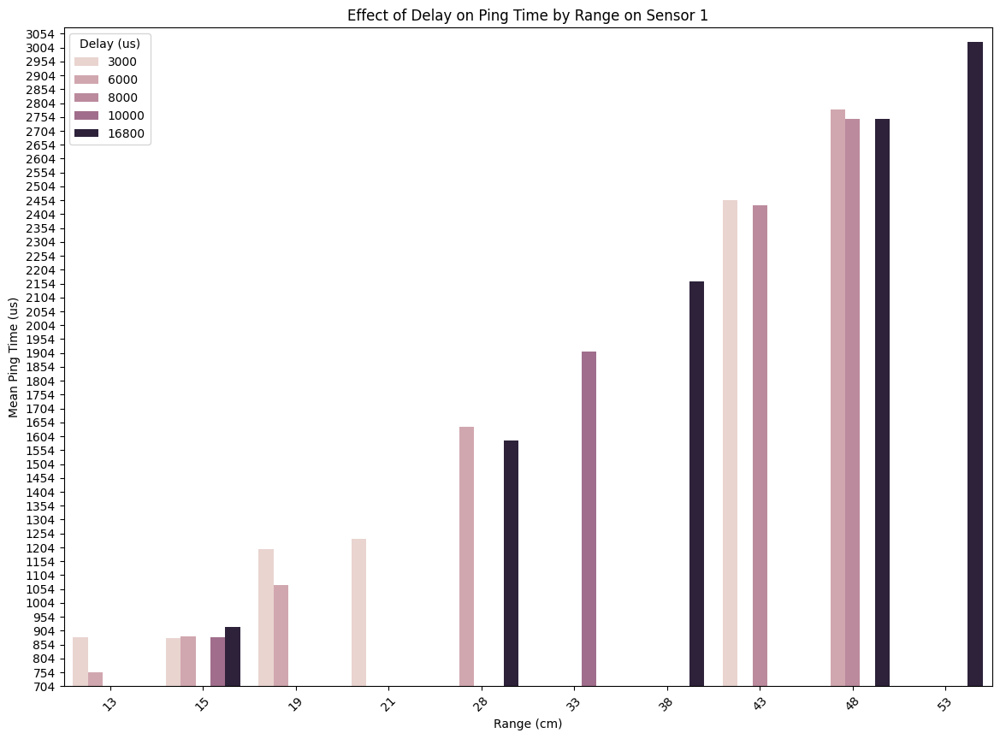

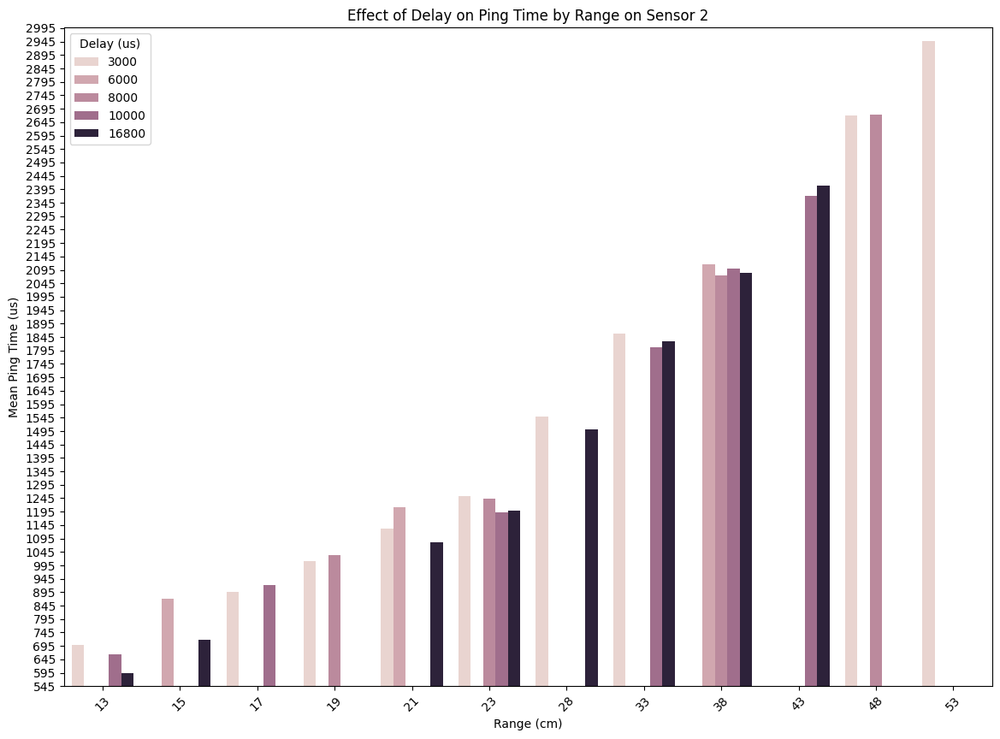

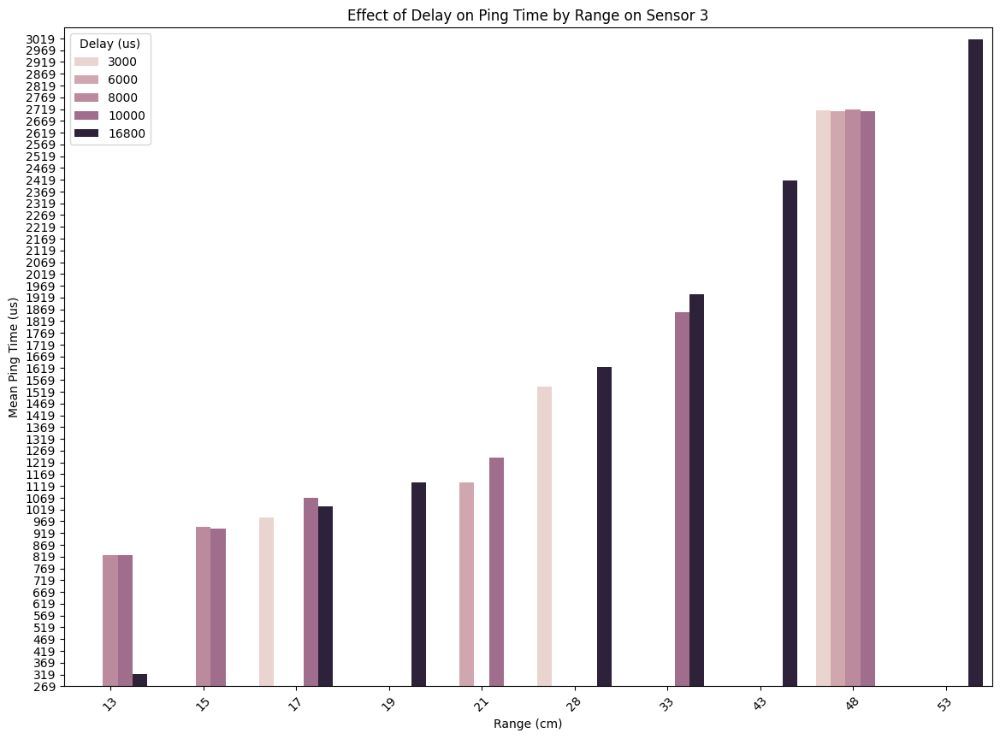

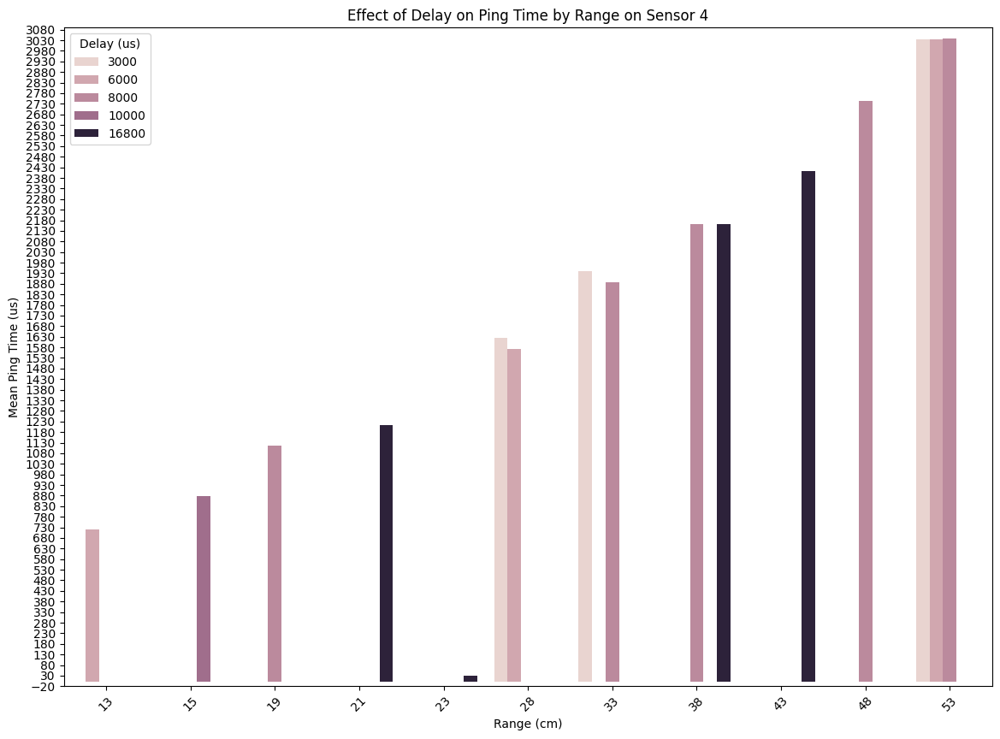

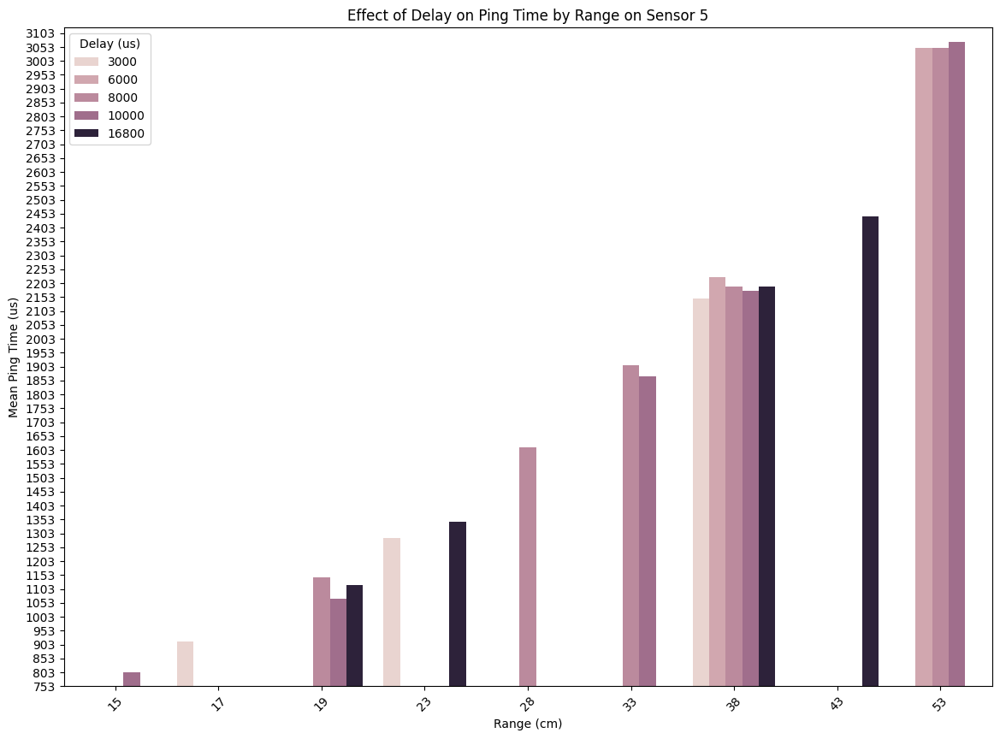

...

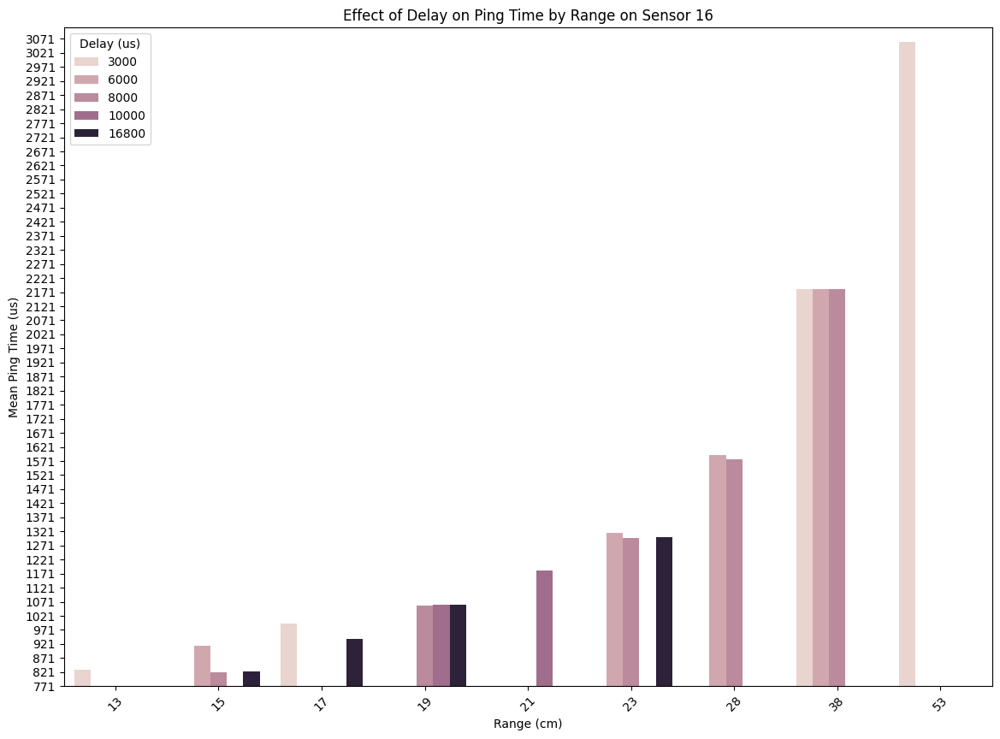

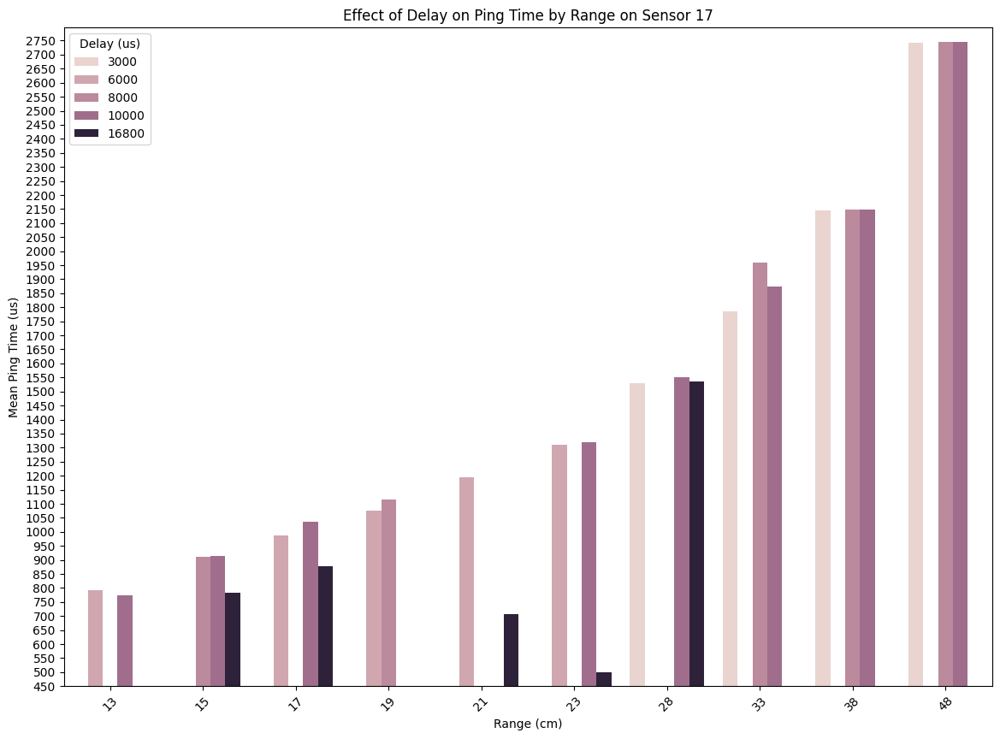

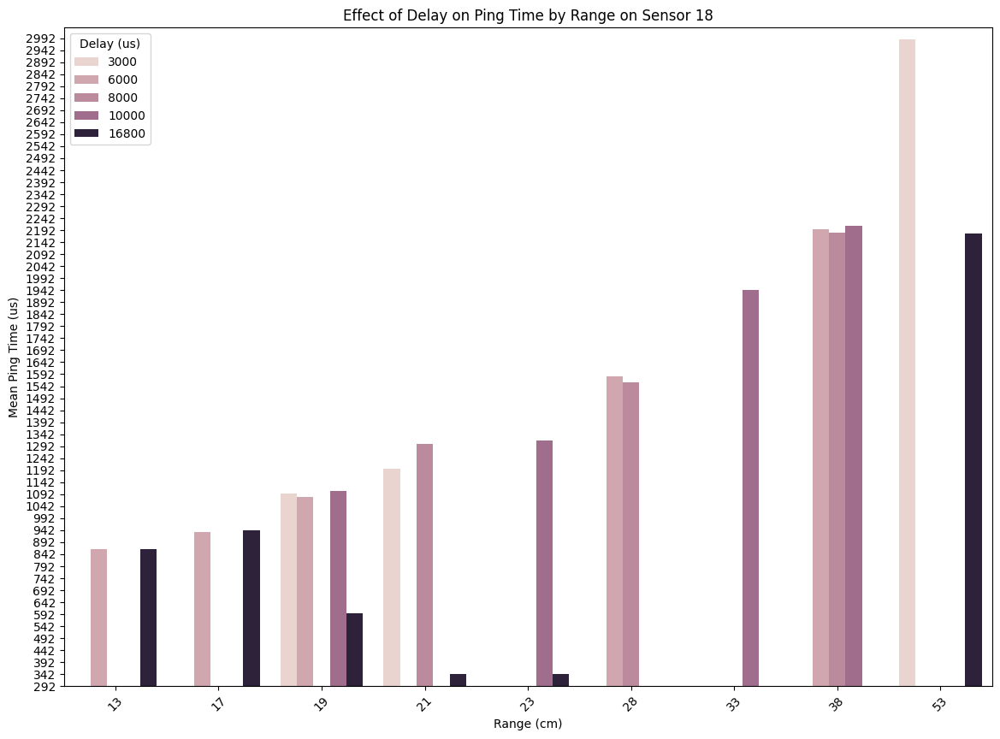

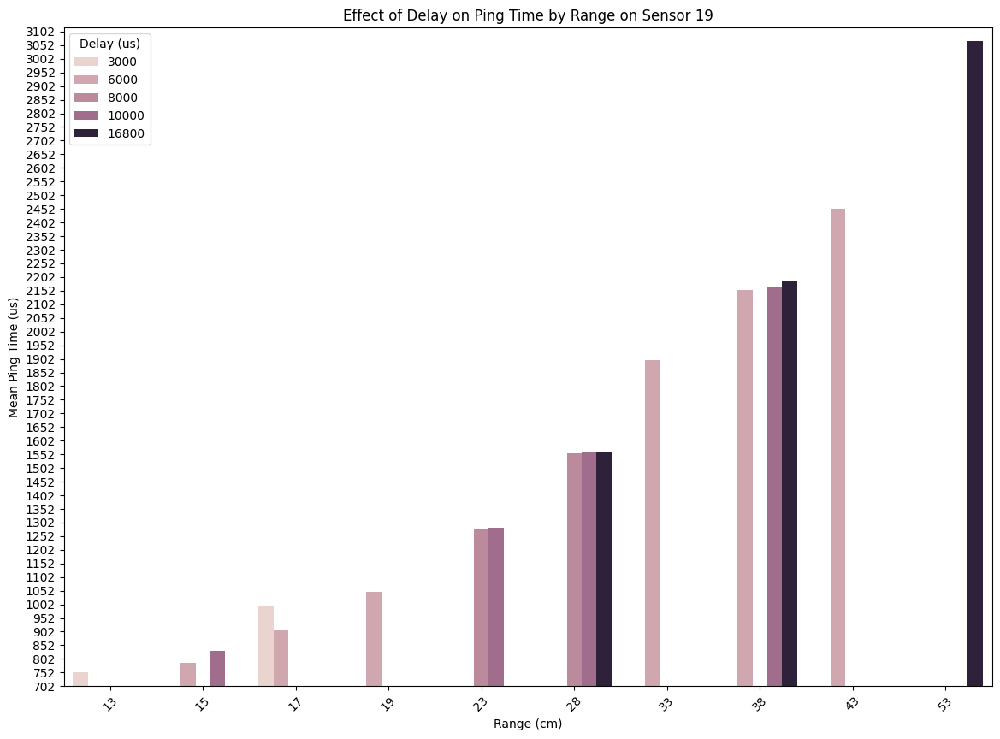

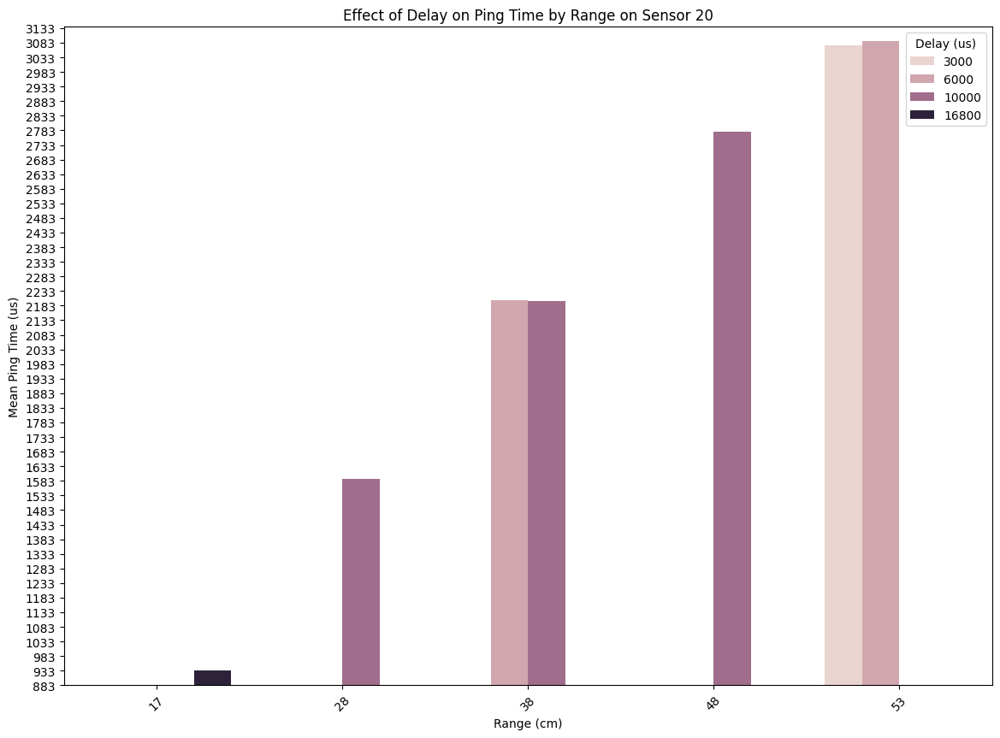

In [76]:
visualize_effect_on_ping_time_sensors(df_outliers_lower)

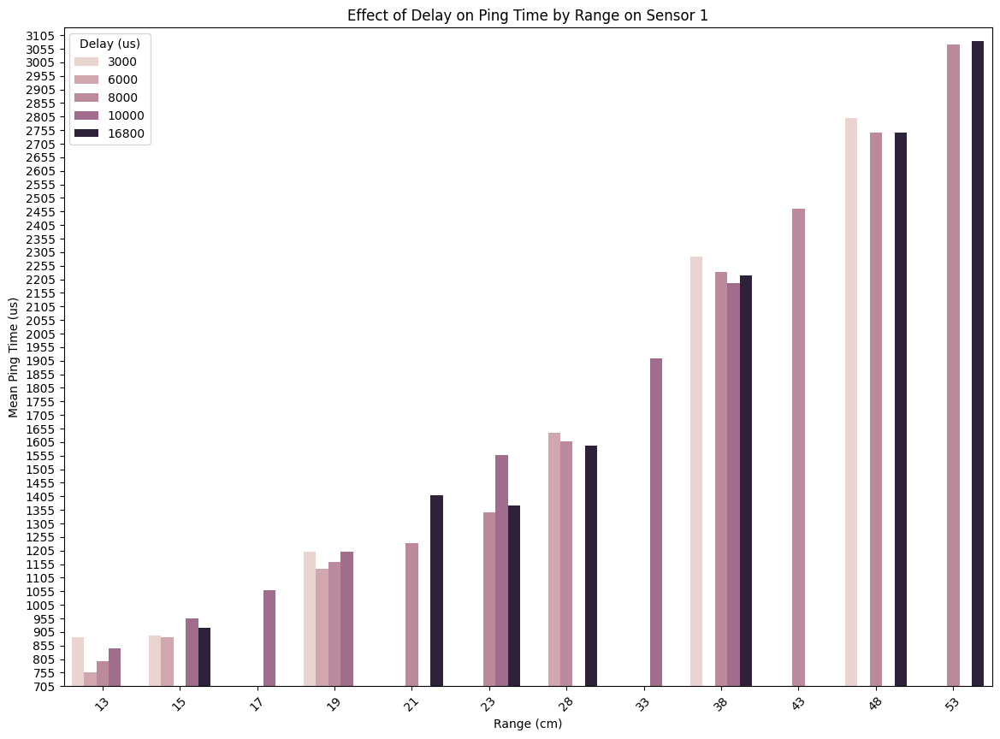

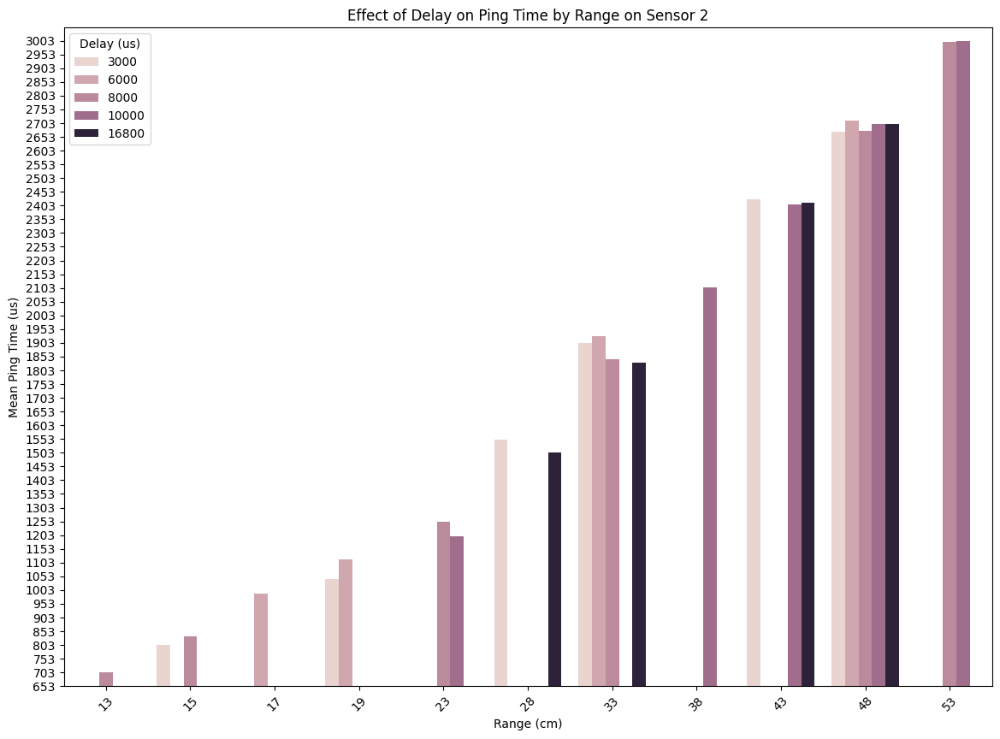

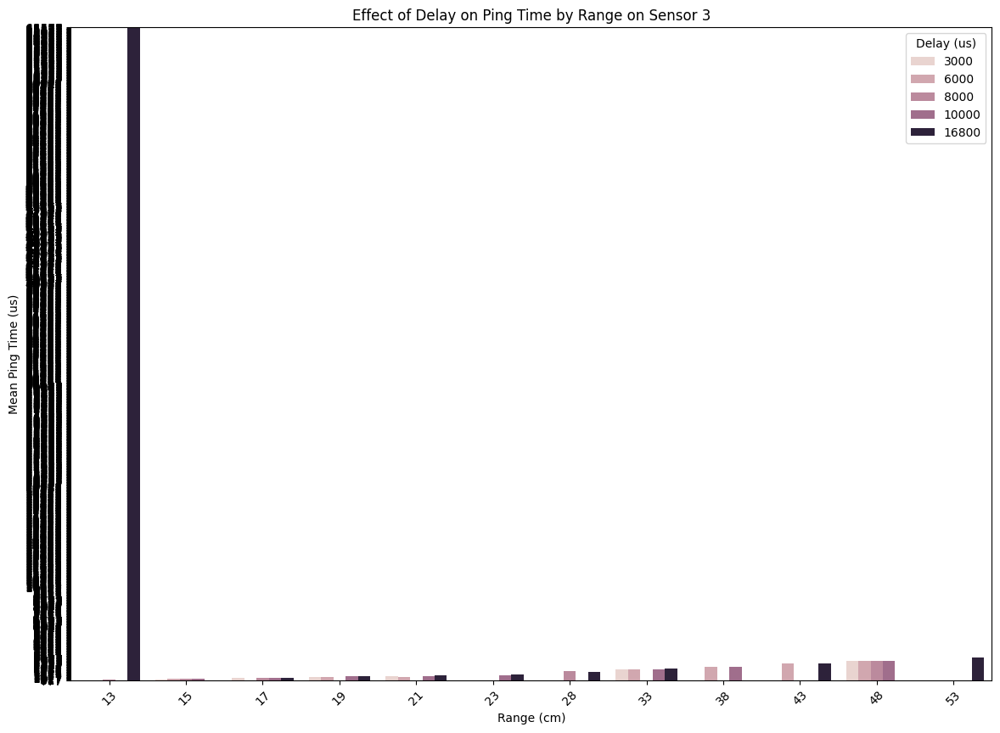

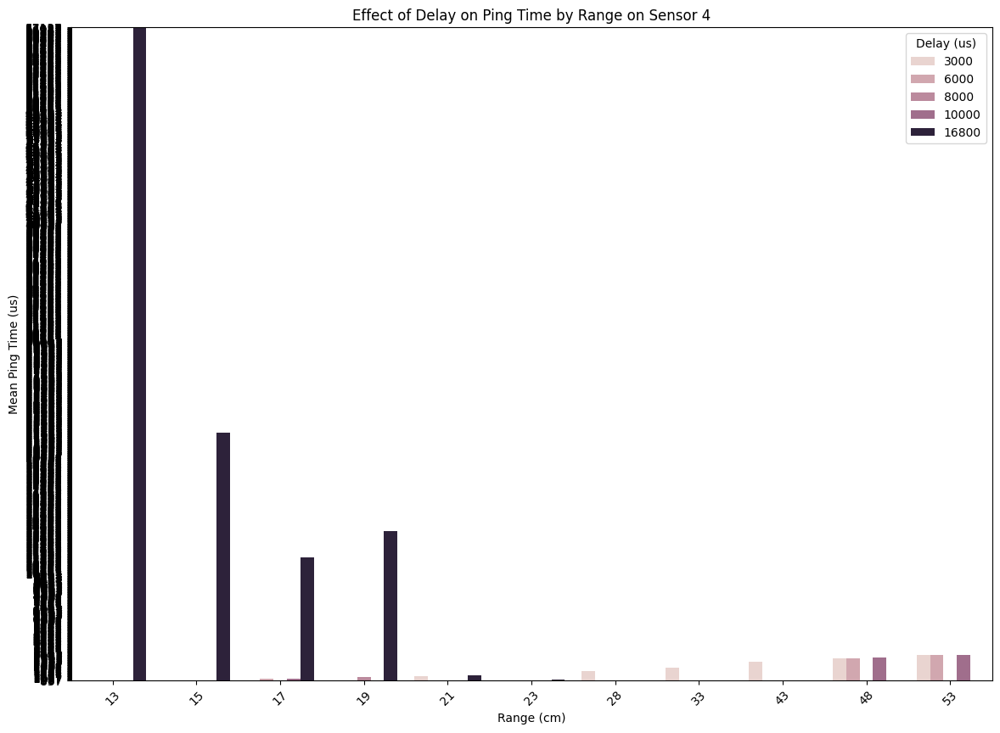

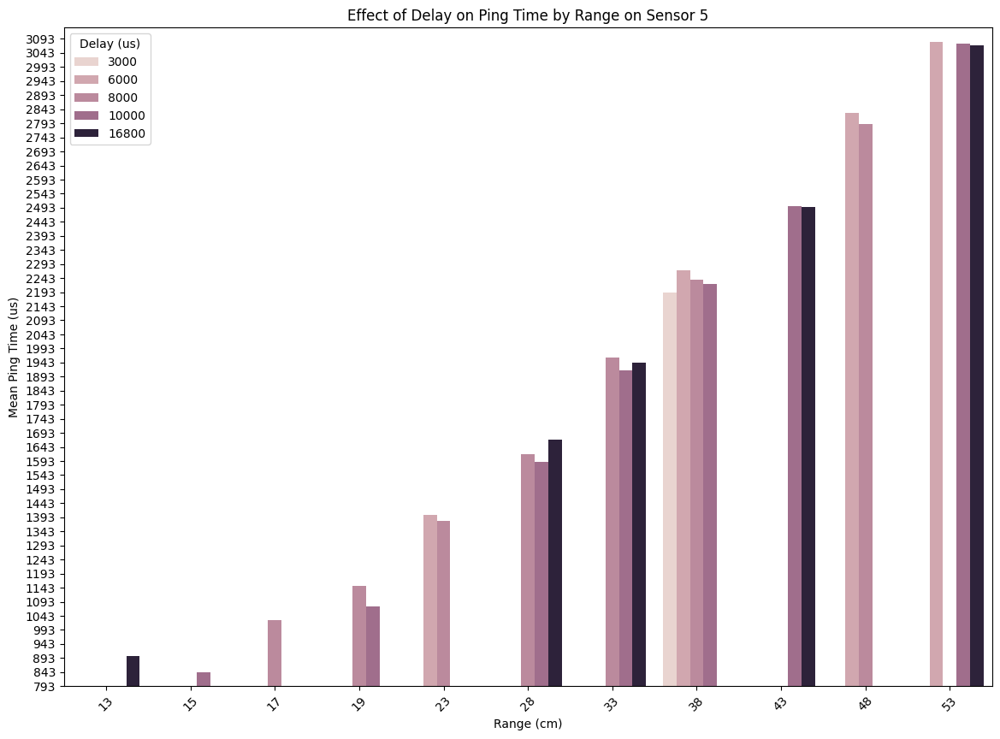

...

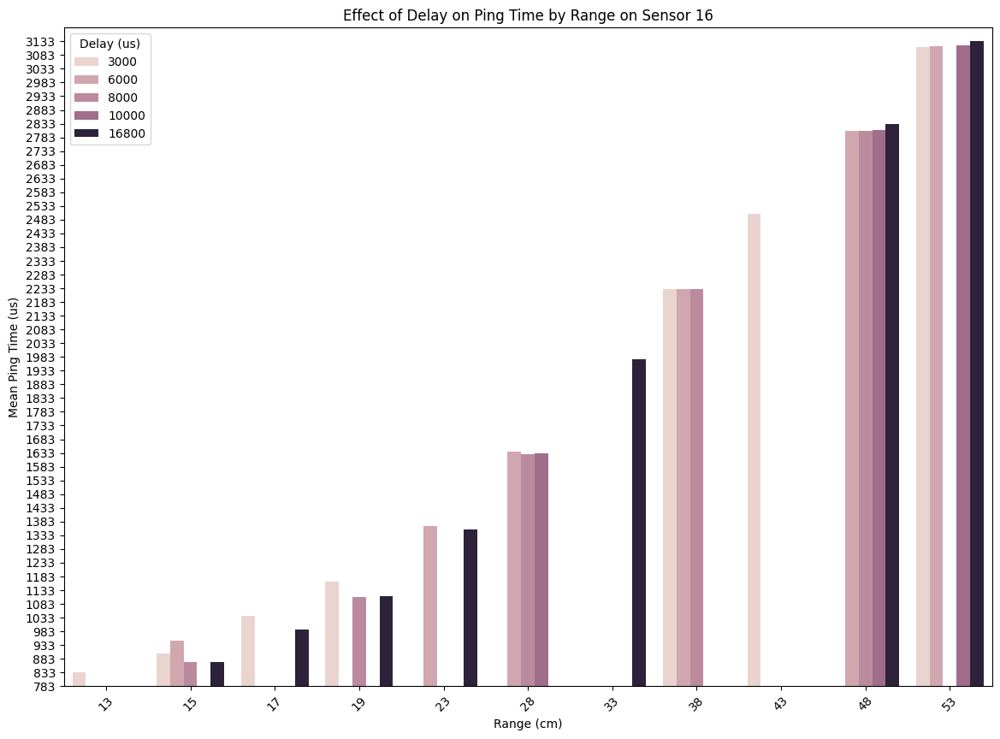

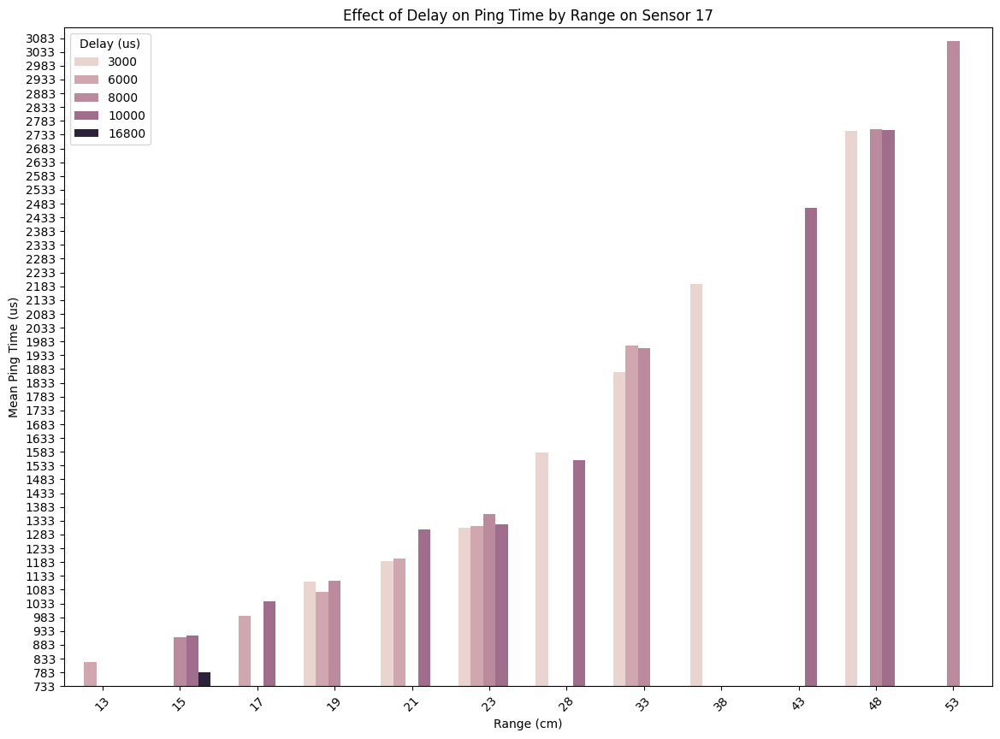

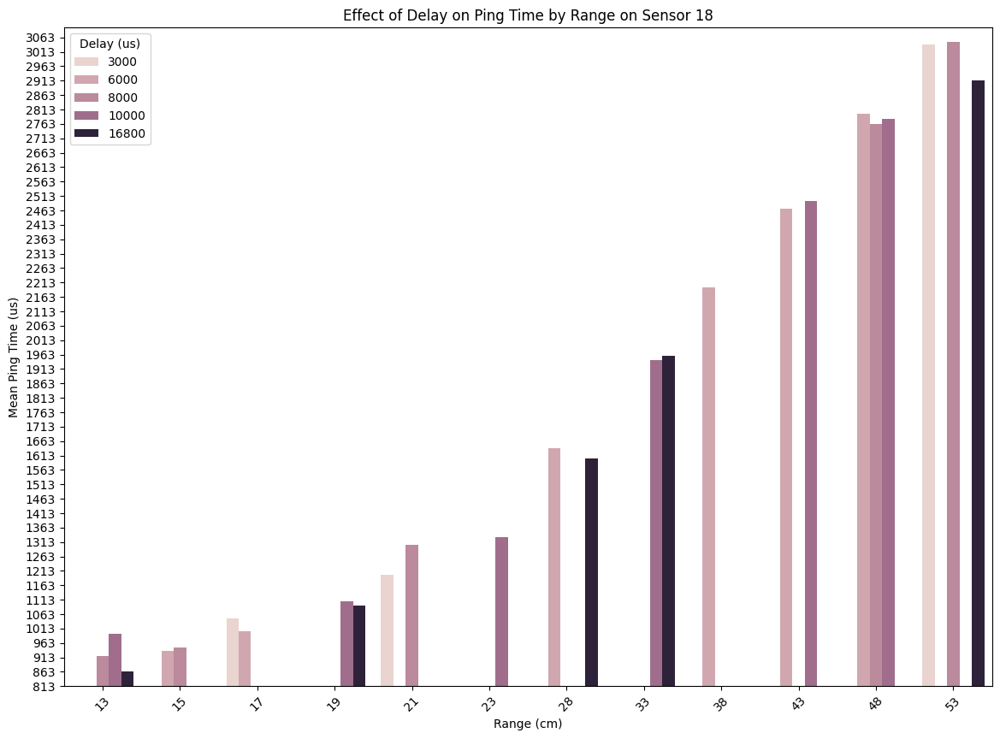

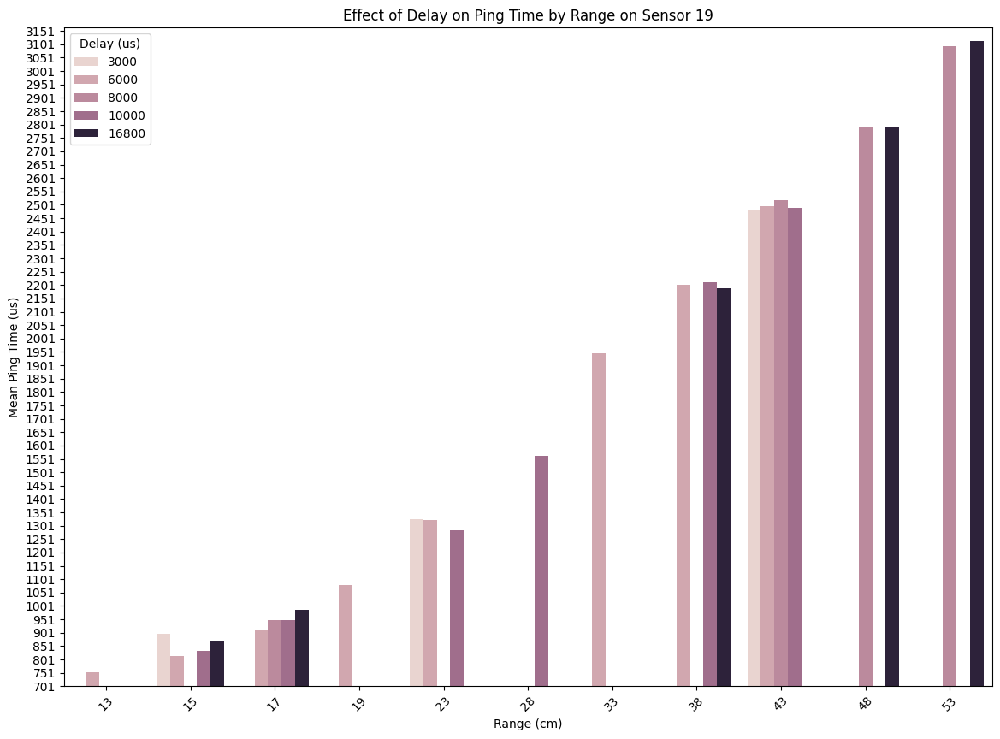

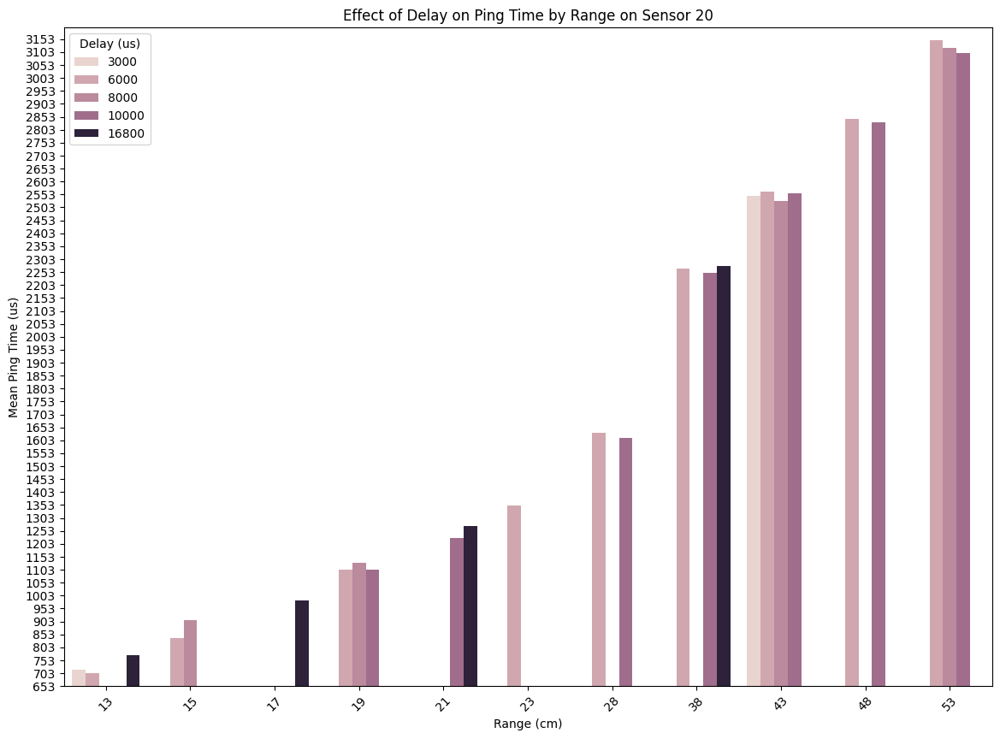

In [77]:
visualize_effect_on_ping_time_sensors(df_outliers_upper)

It does have some different patterns for each sensors this info might also be considered to be used later for characterization.

another thing that are noticable is the frequency and next we will be investigating on frequency

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


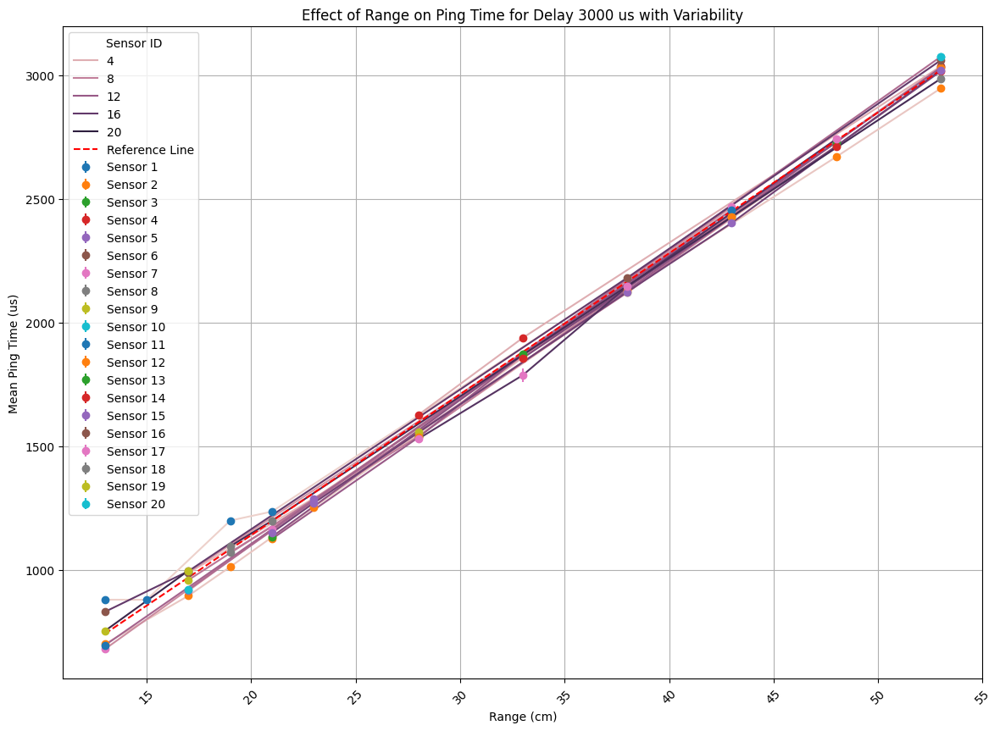

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


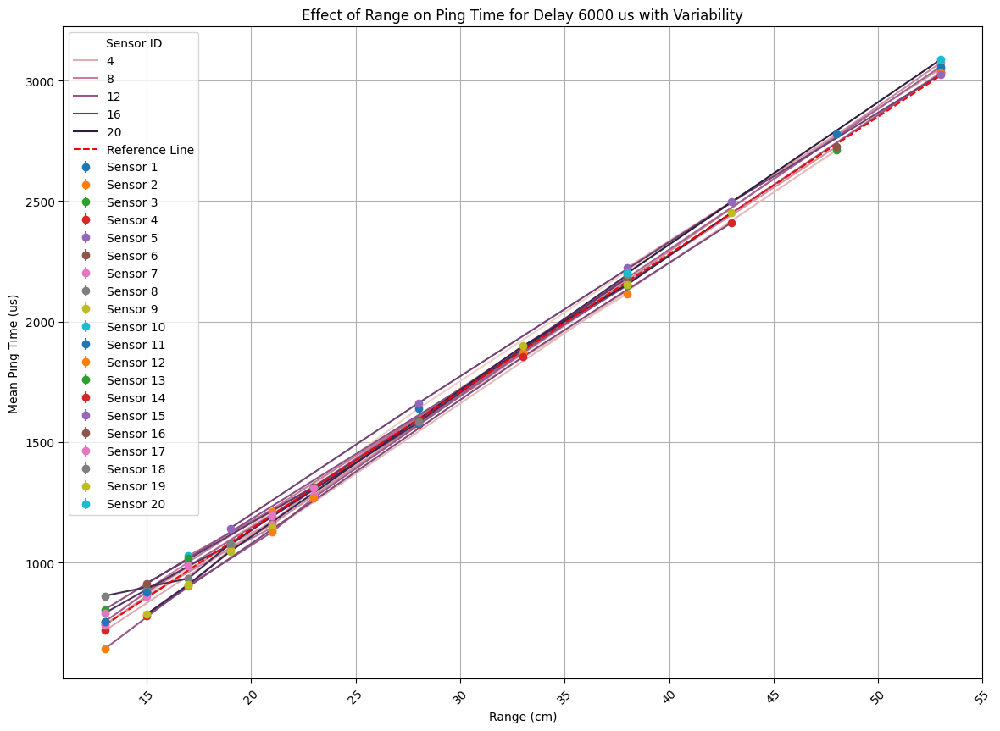

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


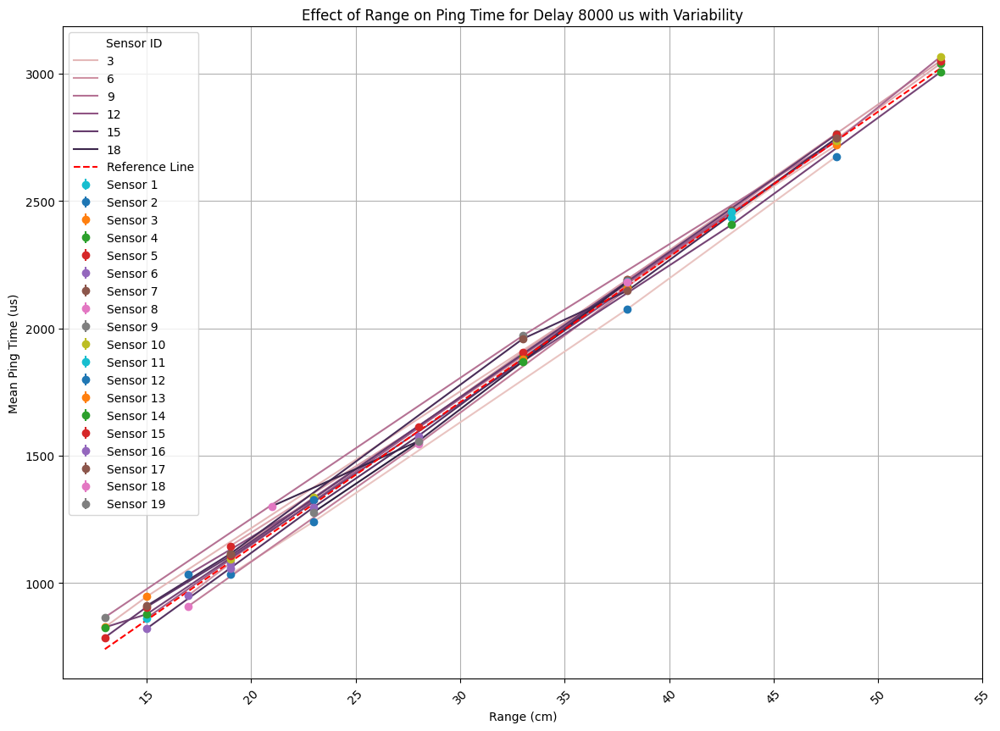

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


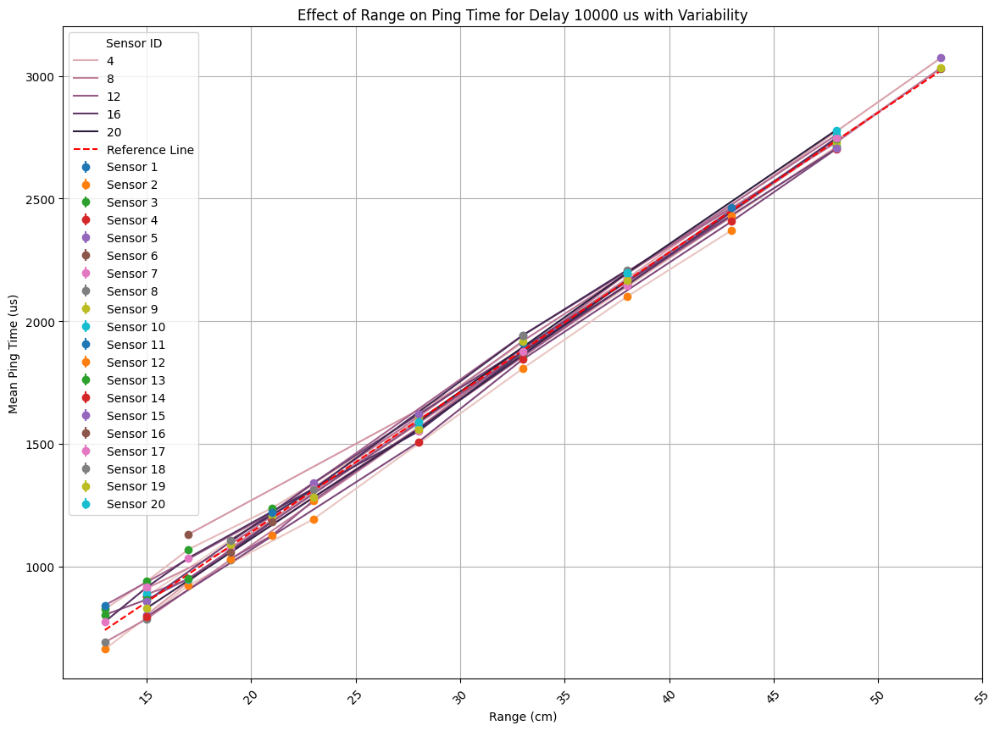

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


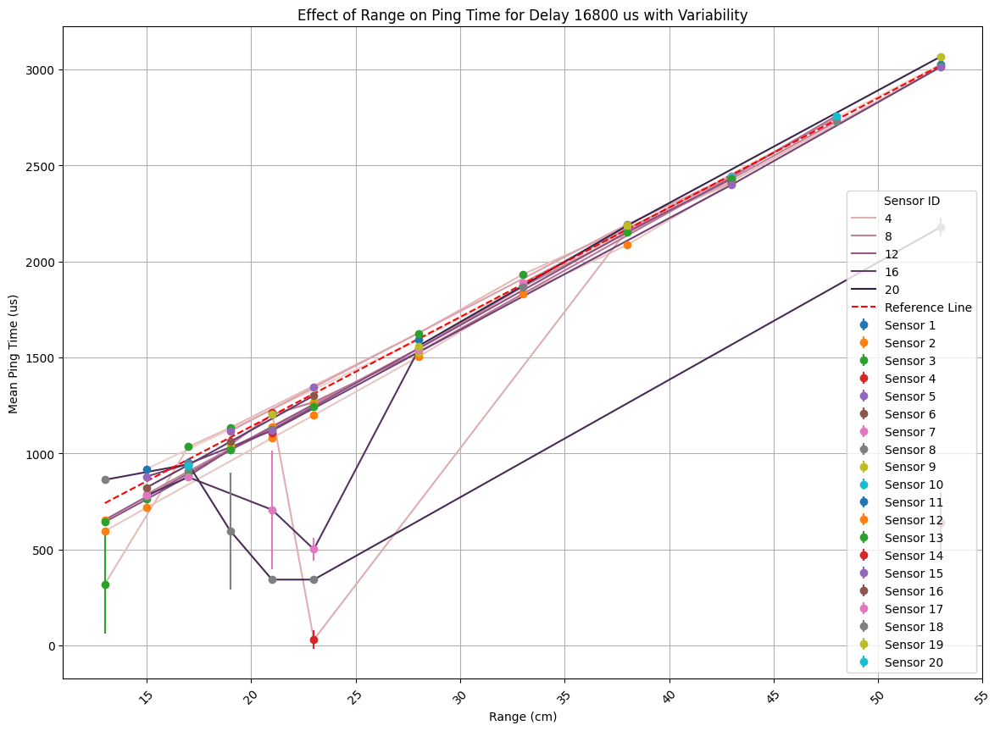

In [78]:
visualize_lineplot_ping_time_with_variability(df_outliers_lower)

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


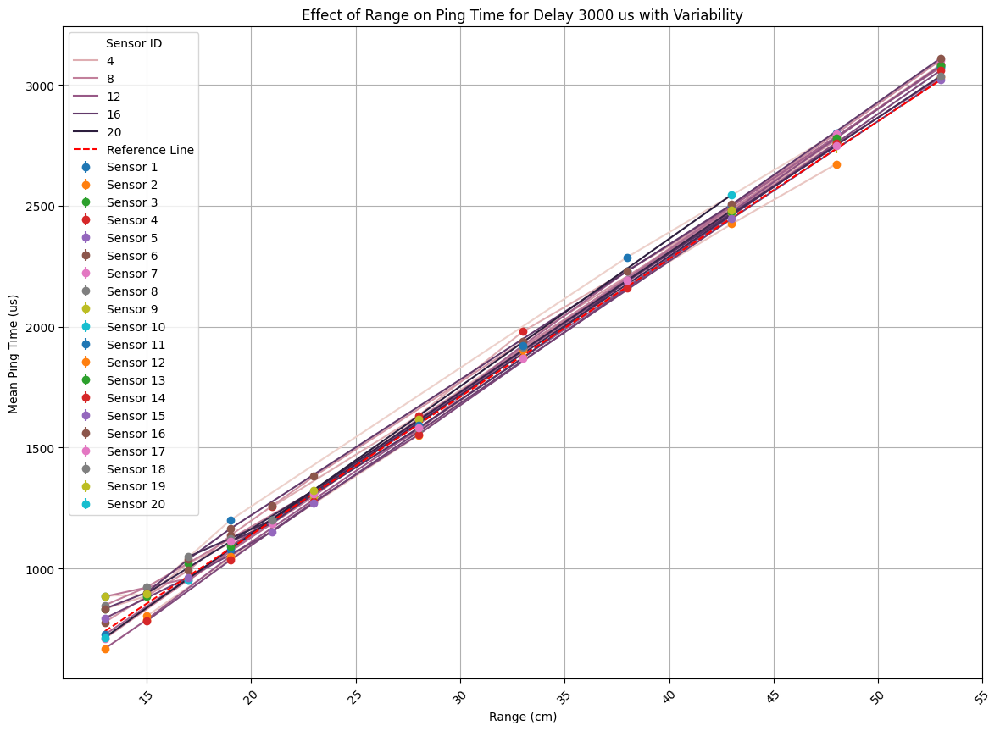

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


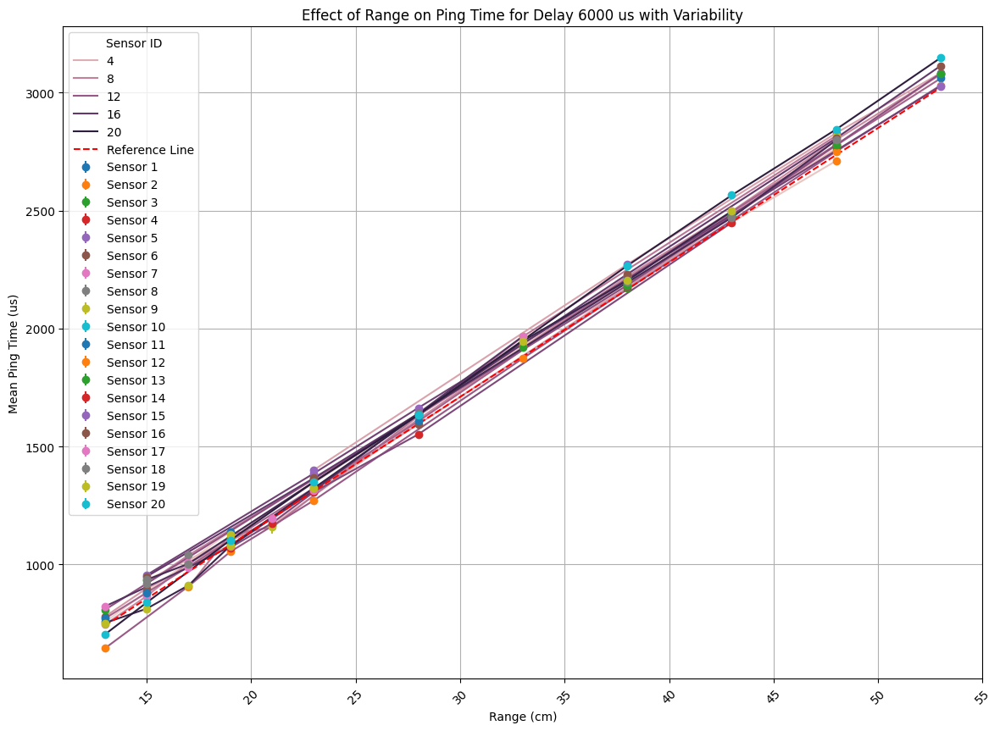

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


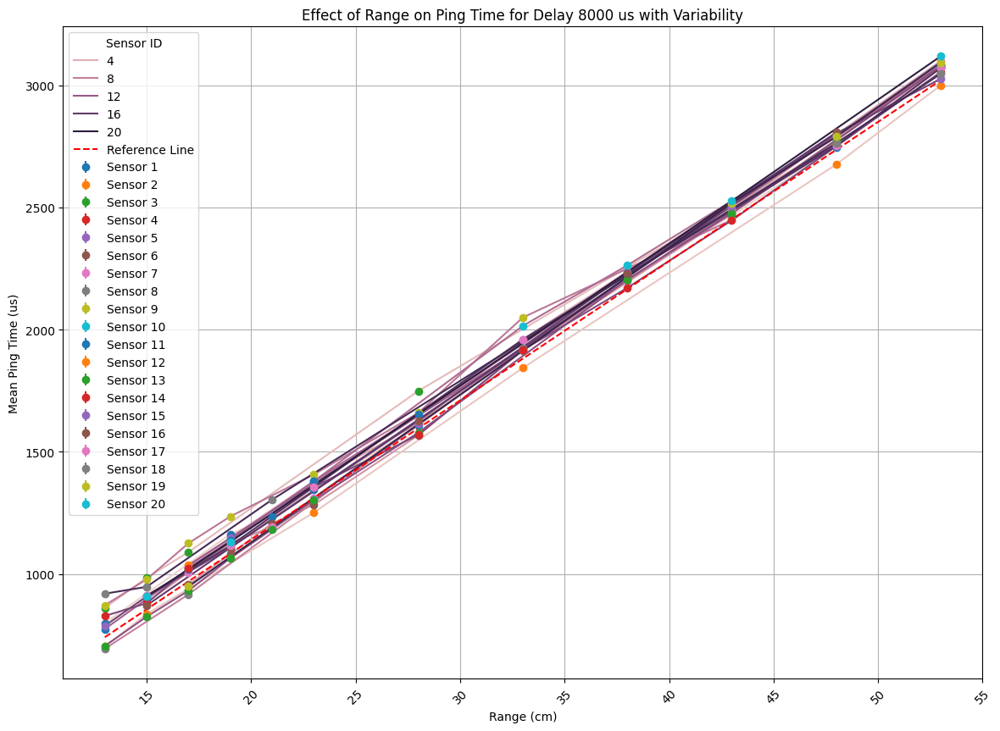

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


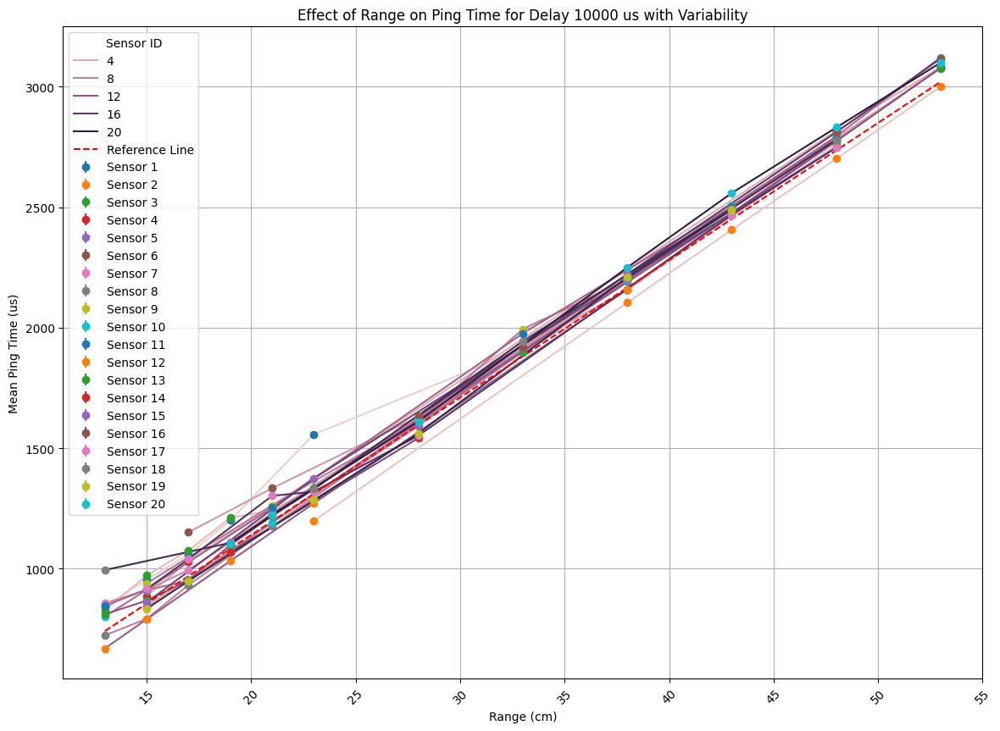

/var/folders/9b/zsztmz7j6v92l4fdx69q5pxh0000gn/T/ipykernel_35814/2302568329.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


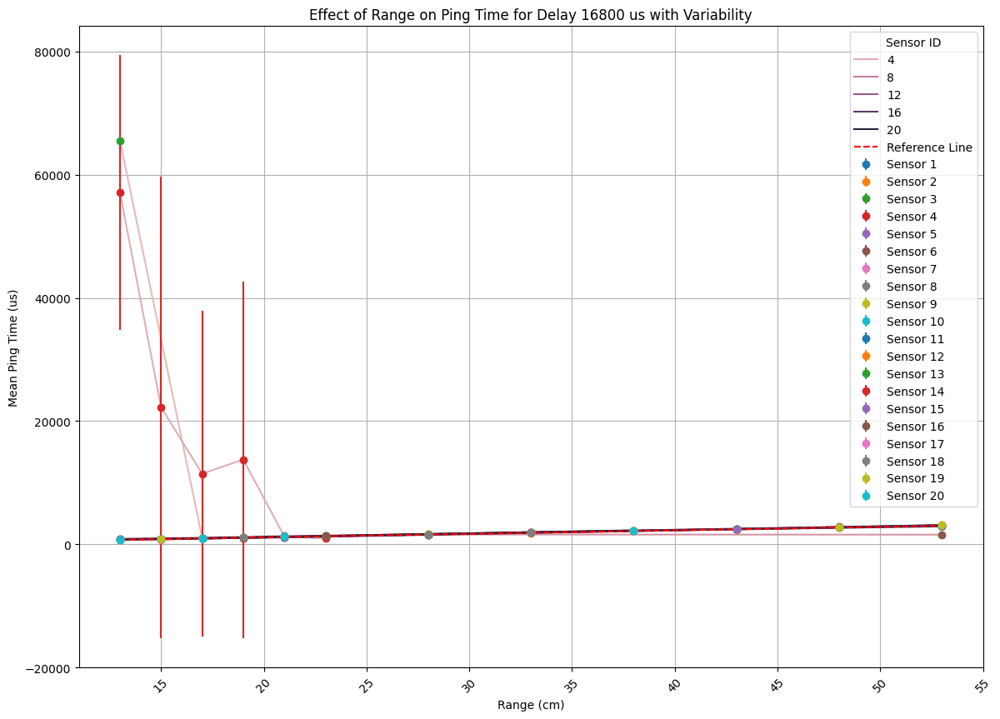

In [79]:
visualize_lineplot_ping_time_with_variability(df_outliers_upper)

#### Investigate Frequency on lower and upper bound

In [80]:
df_outliers_lower.groupby(['Sensor ID', 'Delay (us)'])['Ping Time (us)'].count()

Sensor ID  Delay (us)
1          3000          132
           6000          263
           8000           97
           10000          91
           16800         286
                        ... 
19         16800         108
20         3000            9
           6000            9
           10000          25
           16800          16
Name: Ping Time (us), Length: 99, dtype: int64

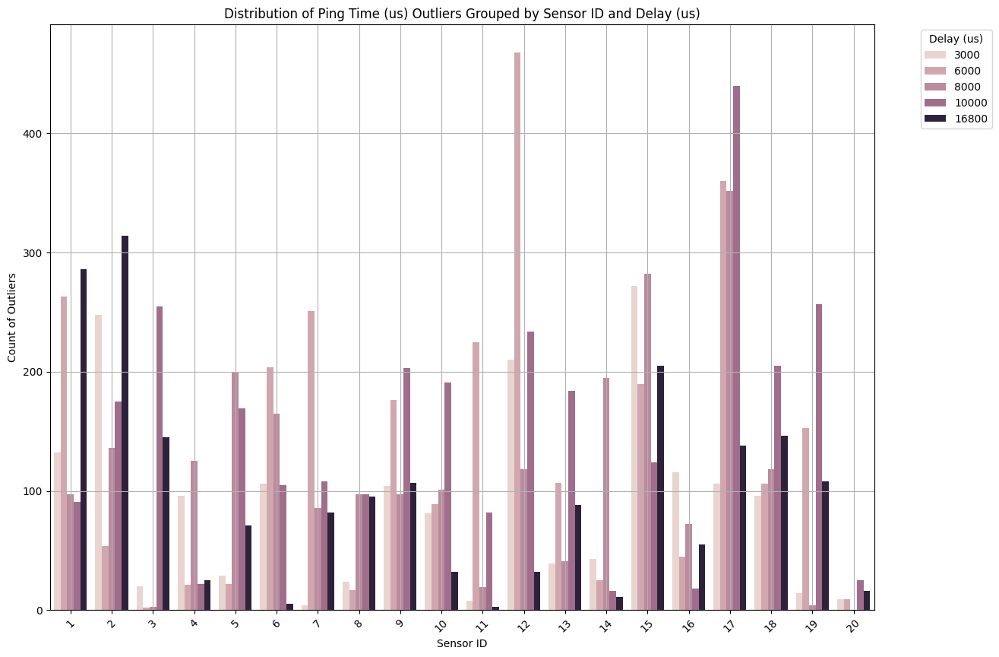

In [81]:
# Group the outliers by 'Sensor ID' and 'Delay (us)'
grouped_outliers = df_outliers_lower.groupby(['Sensor ID', 'Delay (us)'])['Ping Time (us)'].count().reset_index()

# Plot the distribution of outliers
plt.figure(figsize=(14, 10))
sns.barplot(
    x='Sensor ID', 
    y='Ping Time (us)', 
    hue='Delay (us)', 
    data=grouped_outliers
)
plt.title('Distribution of Ping Time (us) Outliers Grouped by Sensor ID and Delay (us)')
plt.xlabel('Sensor ID')
plt.ylabel('Count of Outliers')
plt.legend(title='Delay (us)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

In [82]:
df_outliers_upper.groupby(['Sensor ID', 'Delay (us)'])['Ping Time (us)'].count()

Sensor ID  Delay (us)
1          3000          172
           6000          273
           8000          148
           10000         136
           16800         295
                        ... 
20         3000           27
           6000           95
           8000           13
           10000         114
           16800          26
Name: Ping Time (us), Length: 100, dtype: int64

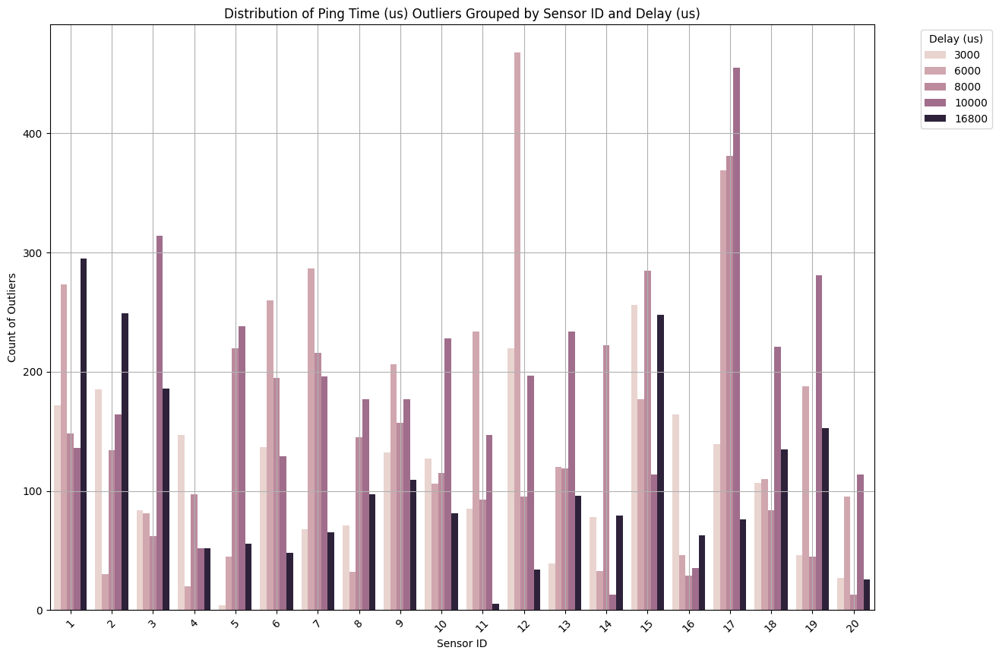

In [83]:
# Group the outliers by 'Sensor ID' and 'Delay (us)'
grouped_upper_outliers = df_outliers_upper.groupby(['Sensor ID', 'Delay (us)'])['Ping Time (us)'].count().reset_index()

# Plot the distribution of outliers
plt.figure(figsize=(14, 10))
sns.barplot(
    x='Sensor ID', 
    y='Ping Time (us)', 
    hue='Delay (us)', 
    data=grouped_upper_outliers
)
plt.title('Distribution of Ping Time (us) Outliers Grouped by Sensor ID and Delay (us)')
plt.xlabel('Sensor ID')
plt.ylabel('Count of Outliers')
plt.legend(title='Delay (us)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

## Further ideas

Ideas for feature engineering:
- new features related to IQR methods: range_delay_middle, range_delay_lower,range_delay_upper
- Another features which is a product of IQR method: lower_delay_freq and upper_delay_freq 

Ideas for characterization:
- Do feature importance to find out which features are important features like L1... but theres no target. 
- Use anamoly detection without labels -> we can use clustering methods



investigate varaiability 


Data collection time elapsed
- each run takes 30 second
- we test 9 ranges
- each time we have to move the motor and minor adjust it which will take 20sec

7 delays 9 ranges with 100 samples 6300 data points.
